# Import Necessary Libraries

In [312]:
%matplotlib inline
import math
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats
import os
import glob
import math
import itertools
sns.set()
pd.options.mode.chained_assignment = None  # default='warn'
import warnings
warnings.filterwarnings("ignore")

# Defining Functions

In [313]:
# Define a heatmap function
def halfHeatMap(df, mirror, corrtype):

    # Create Correlation df
    corr = df.corr(method = corrtype)
    # Plot figsize
    fig, ax = plt.subplots(figsize=(15, 15))
    # Generate Color Map
    colormap = sns.diverging_palette(220, 10, as_cmap=True)

    if mirror == True:
        #Generate Heat Map, allow annotations and place floats in map
        sns.heatmap(corr, cmap=colormap, annot=True, fmt=".2f")

    else:
        # Drop self-correlations
        dropSelf = np.zeros_like(corr)
        dropSelf[np.triu_indices_from(dropSelf)] = True# Generate Color Map
        colormap = sns.diverging_palette(220, 10, as_cmap=True)
        # Generate Heat Map, allow annotations and place floats in map
        sns.heatmap(corr, cmap=colormap, annot=True, fmt=".2f", mask=dropSelf)
        
    #show plot
    plt.show()

# Importing Data

In [314]:
train = pd.read_csv("train_V2.csv", low_memory = False)
test = pd.read_csv("test_V2.csv", low_memory = False)

In [315]:
# Inspecting all the features available
train.columns

Index(['Id', 'groupId', 'matchId', 'assists', 'boosts', 'damageDealt', 'DBNOs',
       'headshotKills', 'heals', 'killPlace', 'killPoints', 'kills',
       'killStreaks', 'longestKill', 'matchDuration', 'matchType', 'maxPlace',
       'numGroups', 'rankPoints', 'revives', 'rideDistance', 'roadKills',
       'swimDistance', 'teamKills', 'vehicleDestroys', 'walkDistance',
       'weaponsAcquired', 'winPoints', 'winPlacePerc'],
      dtype='object')

In [316]:
#Inspecting the size of the training dataset
train.shape

(4446966, 29)

In [317]:
# Inspecting the unique values for match type
train.matchType.unique()

array(['squad-fpp', 'duo', 'solo-fpp', 'squad', 'duo-fpp', 'solo',
       'normal-squad-fpp', 'crashfpp', 'flaretpp', 'normal-solo-fpp',
       'flarefpp', 'normal-duo-fpp', 'normal-duo', 'normal-squad',
       'crashtpp', 'normal-solo'], dtype=object)

In [318]:
# Inspecting the number of unique matches in the training dataset
len(train.matchId.unique())

47965

In [319]:
# Inspecting the number of matches for games that do not belong to the typical game modes
len(train[train.matchType.str.contains("normal")])

25386

In [320]:
len(train[train.matchType.str.contains("flare")])

3223

In [321]:
len(train[train.matchType.str.contains("crash")])

6658

# Data Wrangling

In [322]:
train = train[~(train.matchType.str.contains("flare") | 
            train.matchType.str.contains("normal") | 
            train.matchType.str.contains("crash"))]

In [323]:
train.shape

(4411699, 29)

In [324]:
for gamemode in train.matchType.unique():
    tempdf = train[train.matchType == gamemode]
    print("Game mode : {}, Number of observations - {}, Number of games - {}".format(gamemode, len(tempdf), len(tempdf.matchId.unique())))

Game mode : squad-fpp, Number of observations - 1756186, Number of games - 18576
Game mode : duo, Number of observations - 313591, Number of games - 3356
Game mode : solo-fpp, Number of observations - 536762, Number of games - 5679
Game mode : squad, Number of observations - 626526, Number of games - 6658
Game mode : duo-fpp, Number of observations - 996691, Number of games - 10620
Game mode : solo, Number of observations - 181943, Number of games - 2297


In [325]:
train.drop("rankPoints", axis = 1, inplace = True)

In [326]:
train.shape

(4411699, 28)

In [327]:
train_dict = {}
modes = []
for gamemode in train.matchType.unique():
    modes.append(gamemode)
    train_dict[gamemode] = train[train.matchType == gamemode]

In [328]:
modes

['squad-fpp', 'duo', 'solo-fpp', 'squad', 'duo-fpp', 'solo']

# EDA (Visualizations and Inferential Statistics)

## Solo Modes

### Solo Mode

In [329]:
solo = train_dict["solo"].reset_index(drop = True)
solofpp = train_dict["solo-fpp"].reset_index(drop = True)

In [330]:
solo.describe().T

,count,mean,std,min,25%,50%,75%,max
assists,181943.0,0.055616,0.245147,0.0,0.0000,0.0000,0.0000,4.0
boosts,181943.0,1.066048,1.825299,0.0,0.0000,0.0000,2.0000,24.0
damageDealt,181943.0,112.615132,159.219277,0.0,0.0000,65.7300,159.6000,2490.0
DBNOs,181943.0,0.000000,0.000000,0.0,0.0000,0.0000,0.0000,0.0
headshotKills,181943.0,0.223823,0.635332,0.0,0.0000,0.0000,0.0000,19.0
heals,181943.0,1.012130,2.445998,0.0,0.0000,0.0000,1.0000,49.0
killPlace,181943.0,46.172224,28.002309,1.0,21.0000,46.0000,70.0000,100.0
killPoints,181943.0,407.839994,557.630996,0.0,0.0000,0.0000,1032.0000,1962.0
kills,181943.0,0.870932,1.498986,0.0,0.0000,0.0000,1.0000,21.0
killStreaks,181943.0,0.442908,0.566226,0.0,0.0000,0.0000,1.0000,18.0


In [331]:
solo = solo.drop(["DBNOs", "revives"], axis = 1)

In [332]:
features = list(solo.describe().columns)
features

['assists',
 'boosts',
 'damageDealt',
 'headshotKills',
 'heals',
 'killPlace',
 'killPoints',
 'kills',
 'killStreaks',
 'longestKill',
 'matchDuration',
 'maxPlace',
 'numGroups',
 'rideDistance',
 'roadKills',
 'swimDistance',
 'teamKills',
 'vehicleDestroys',
 'walkDistance',
 'weaponsAcquired',
 'winPoints',
 'winPlacePerc']

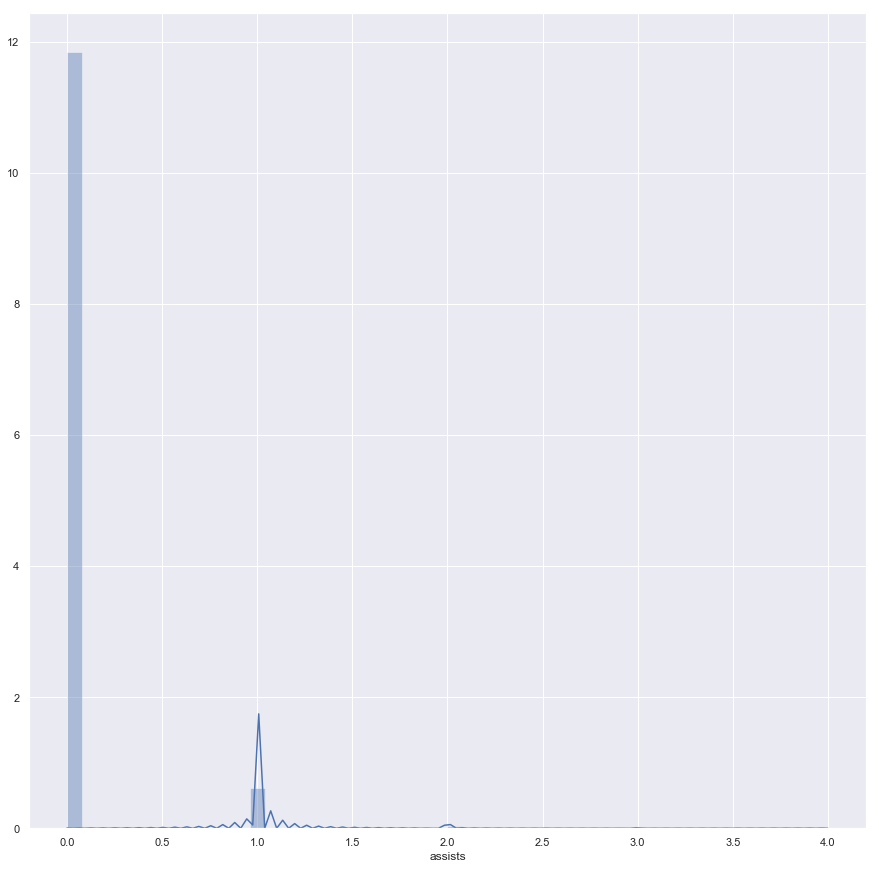

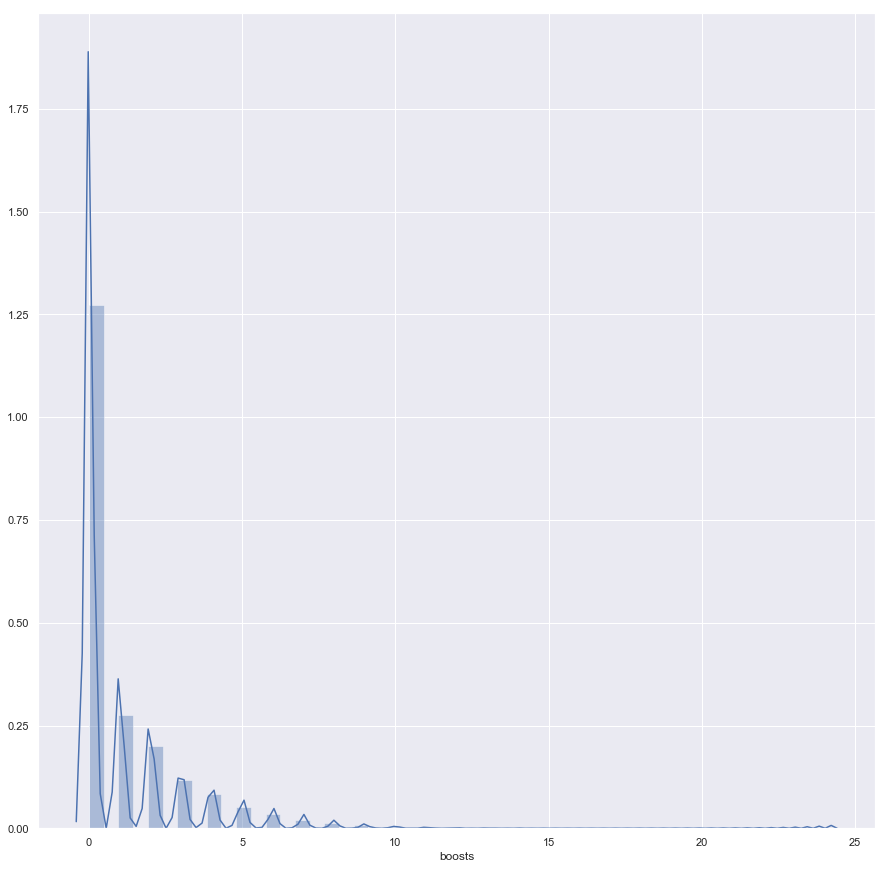

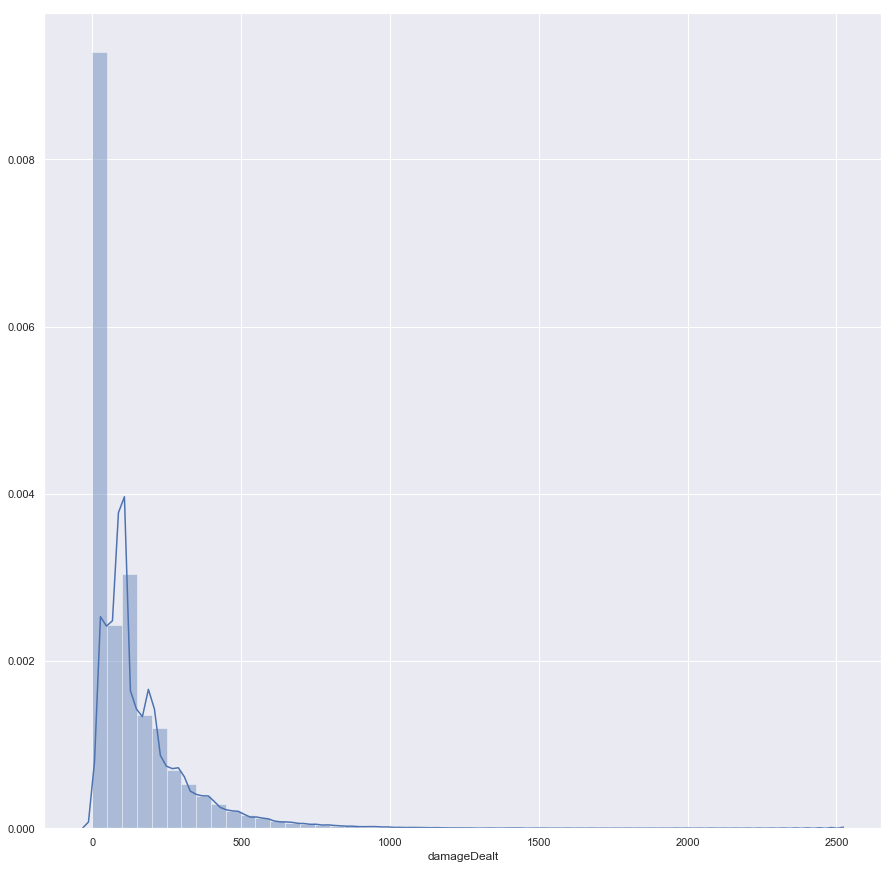

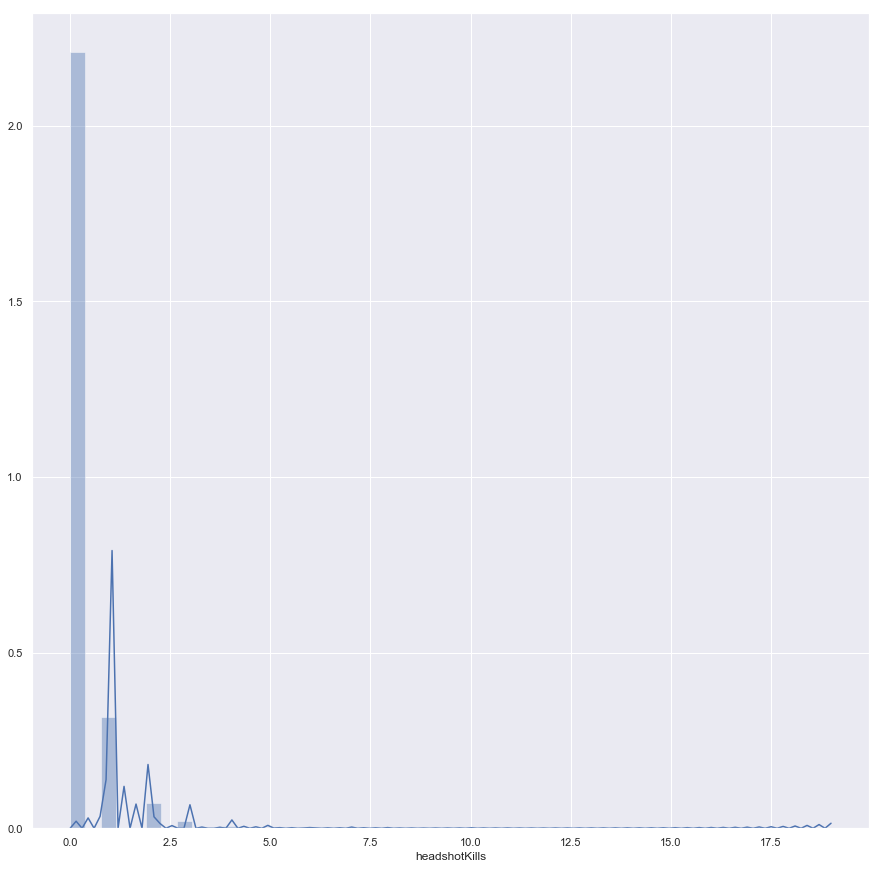

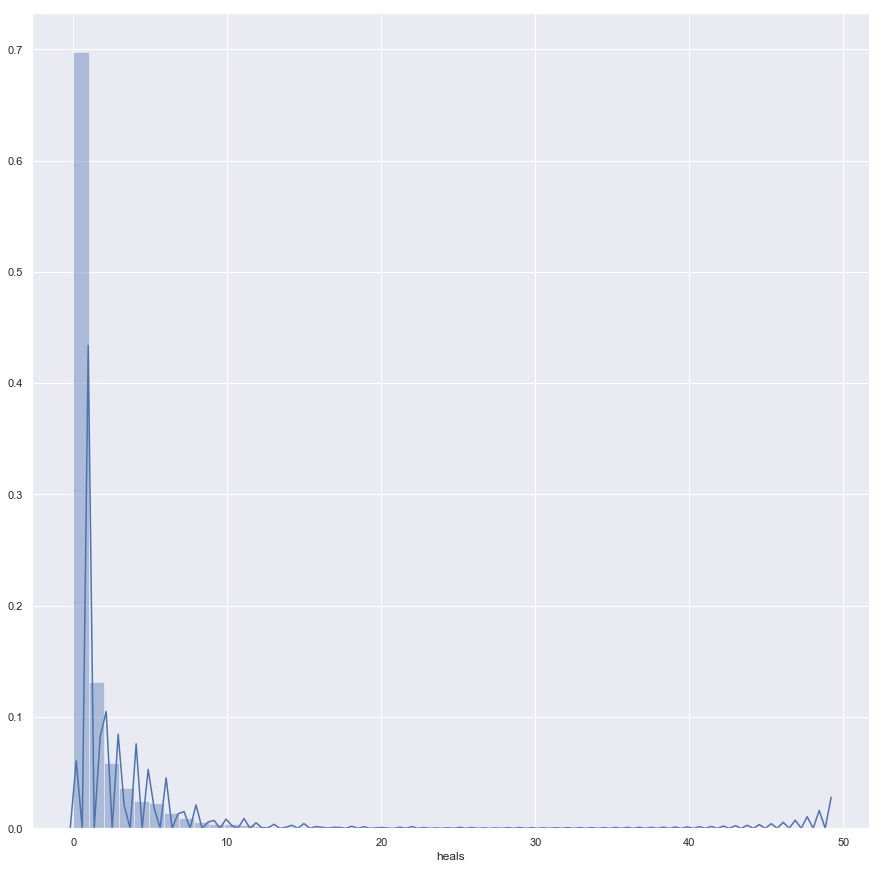

...

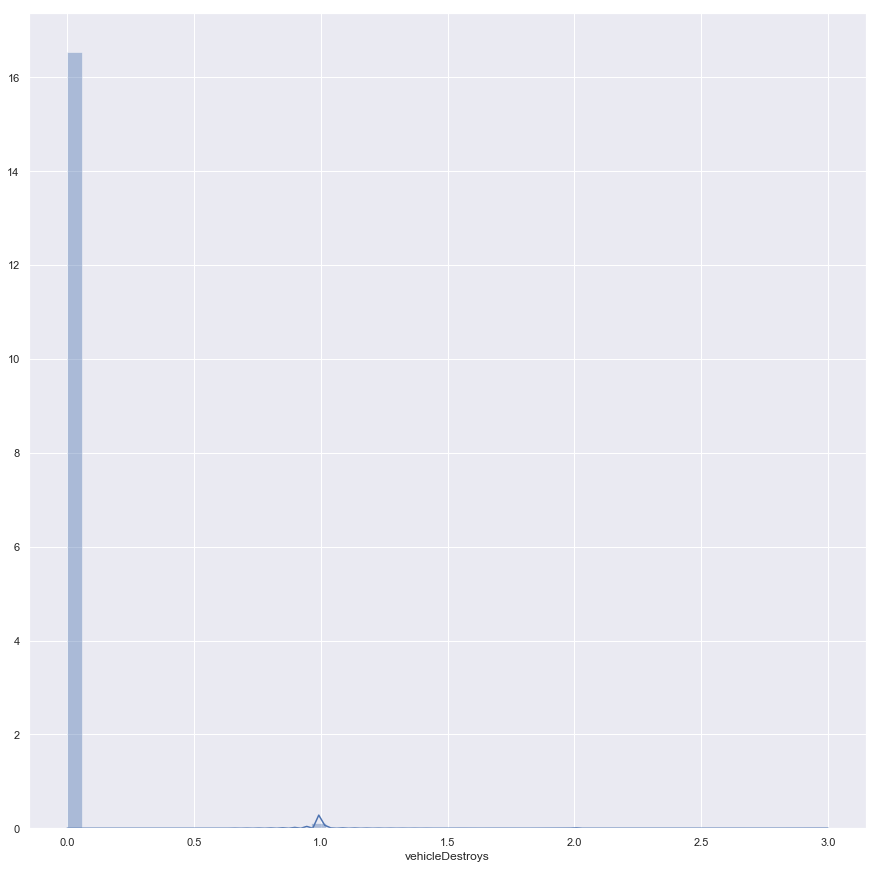

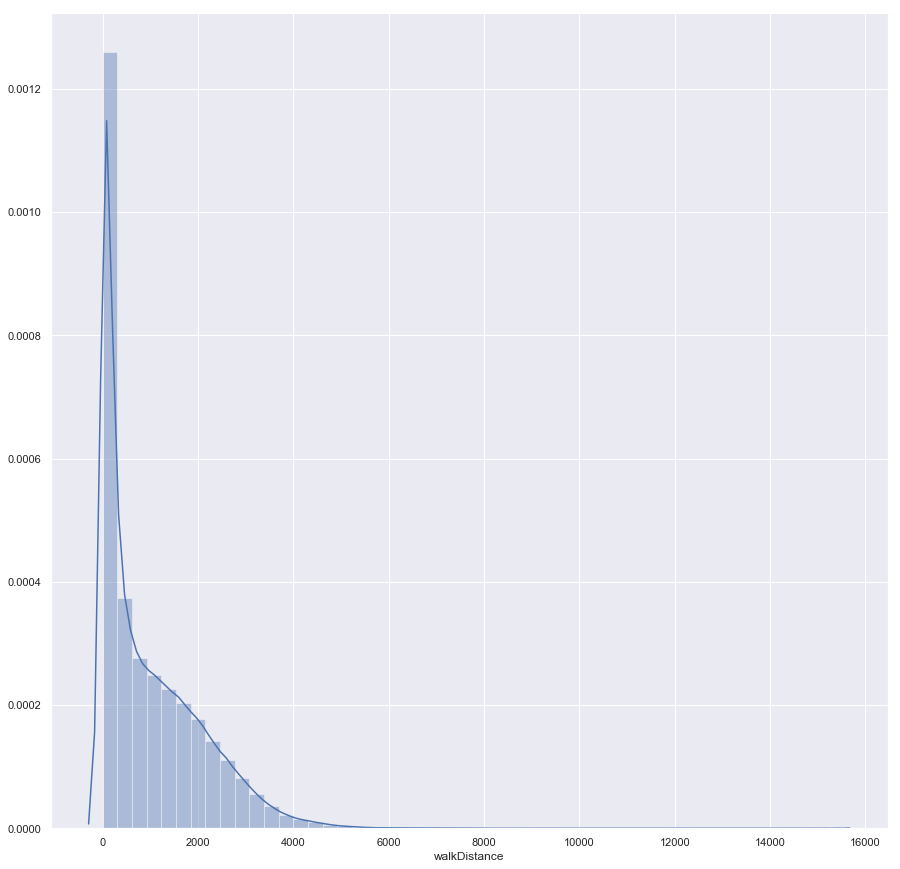

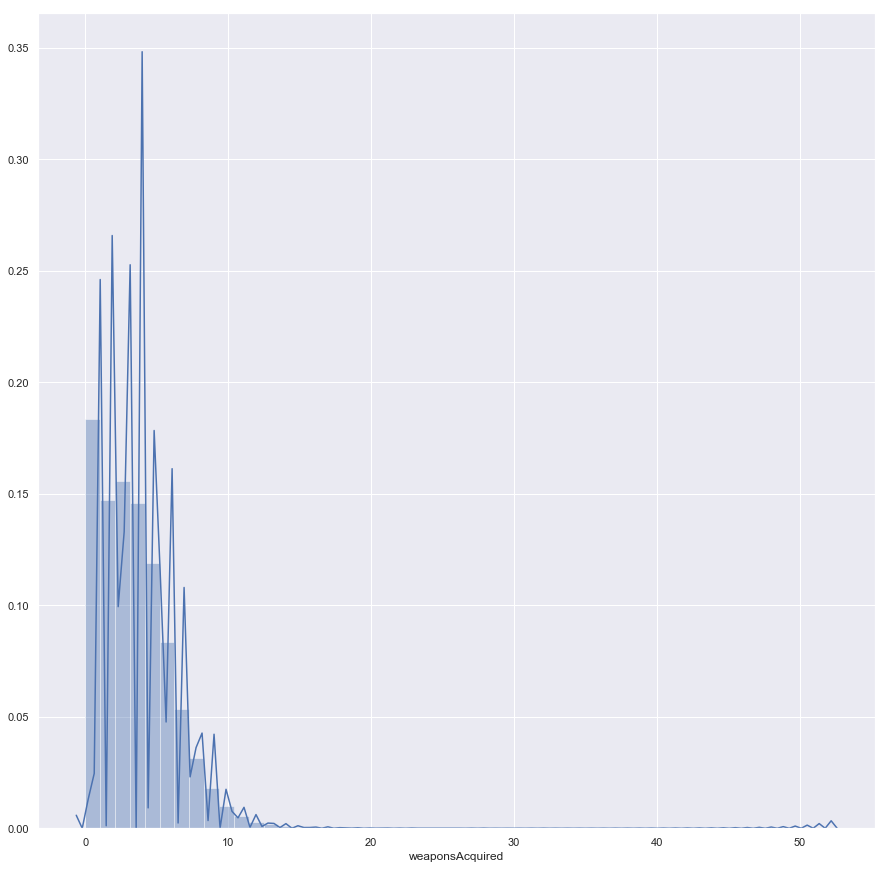

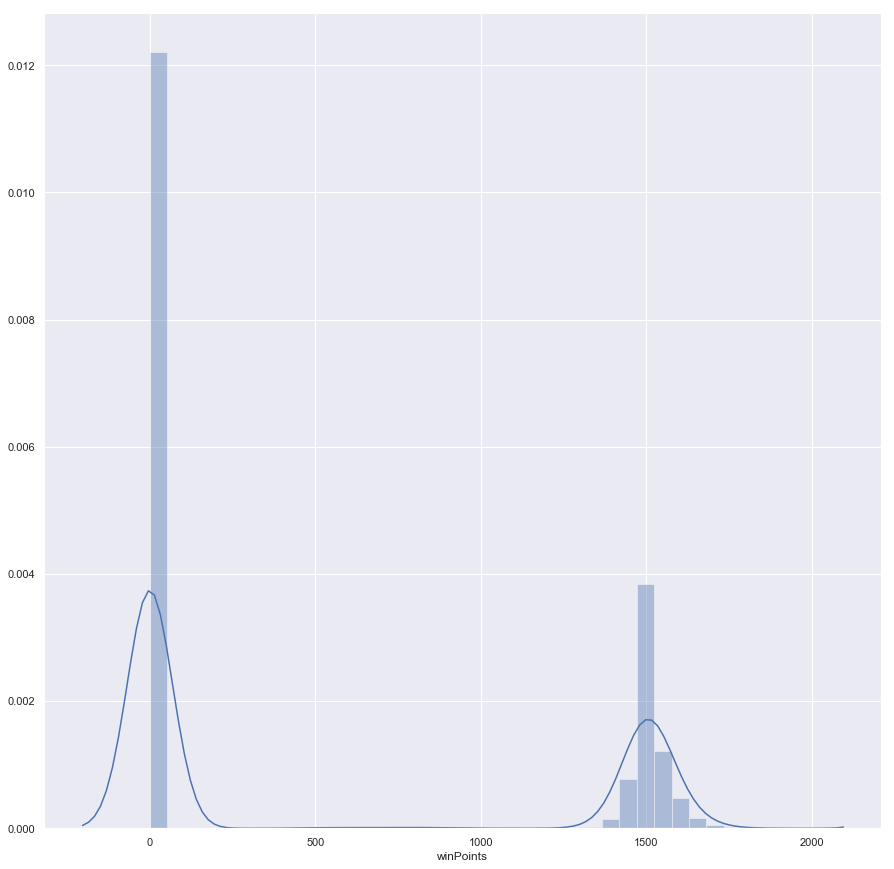

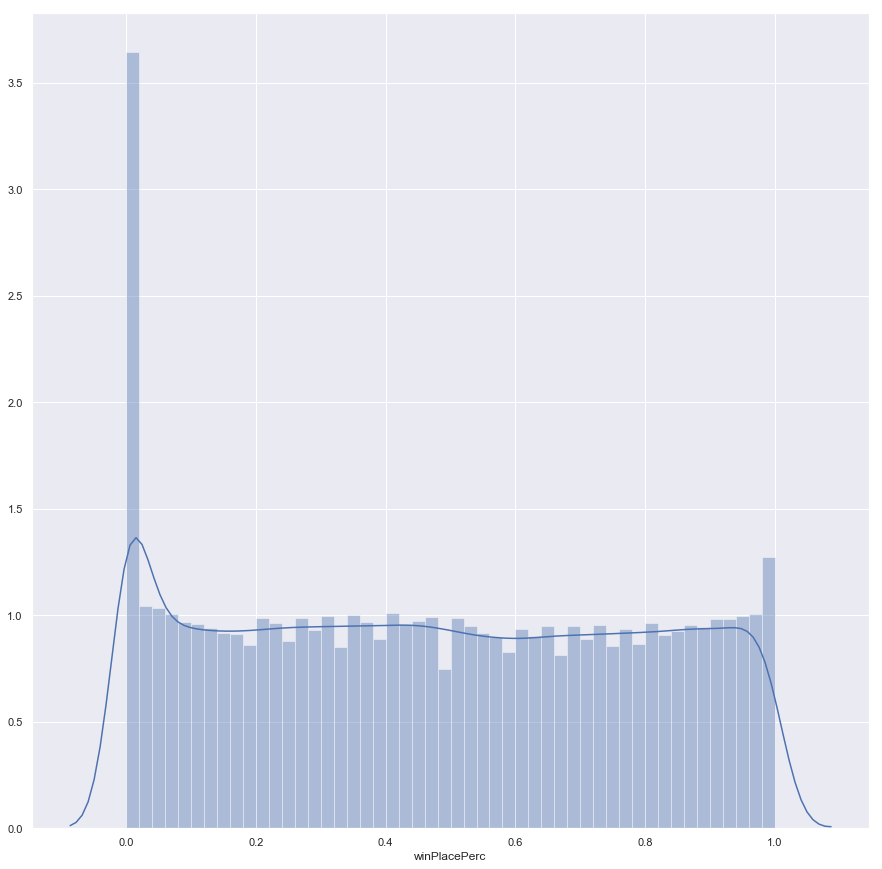

In [333]:
for feature in features:
    plt.figure(figsize = (15, 15))
    sns.distplot(solo[feature])

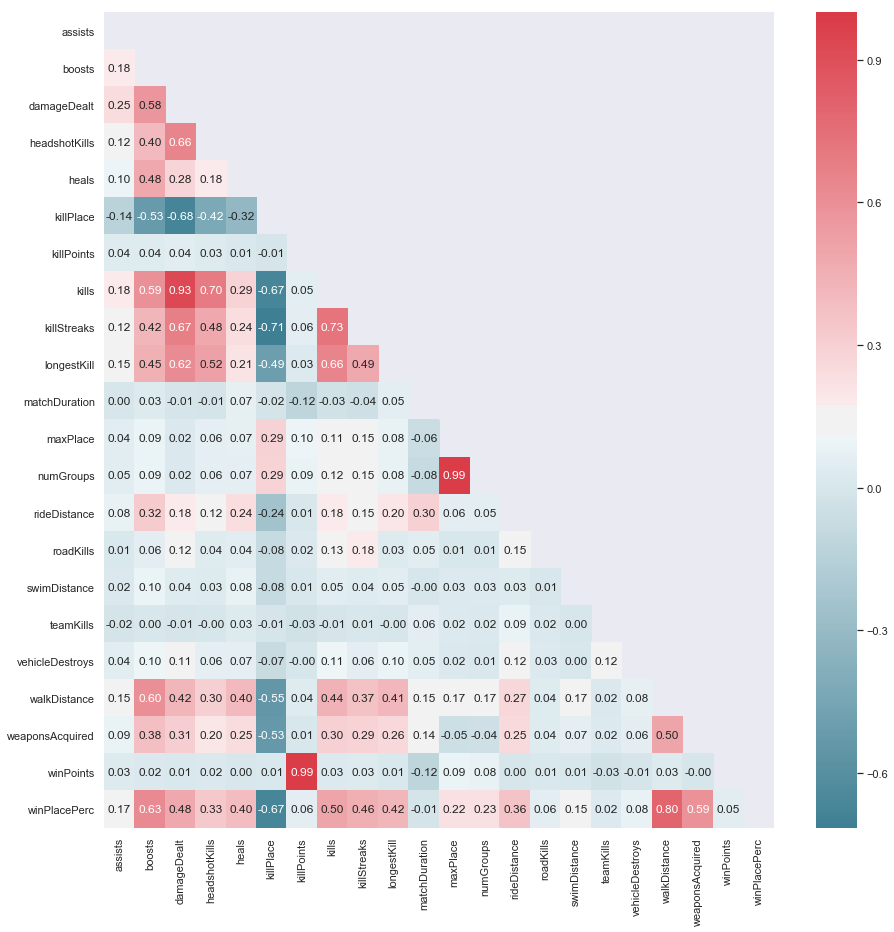

In [334]:
halfHeatMap(solo[features], mirror = False, corrtype = "pearson")

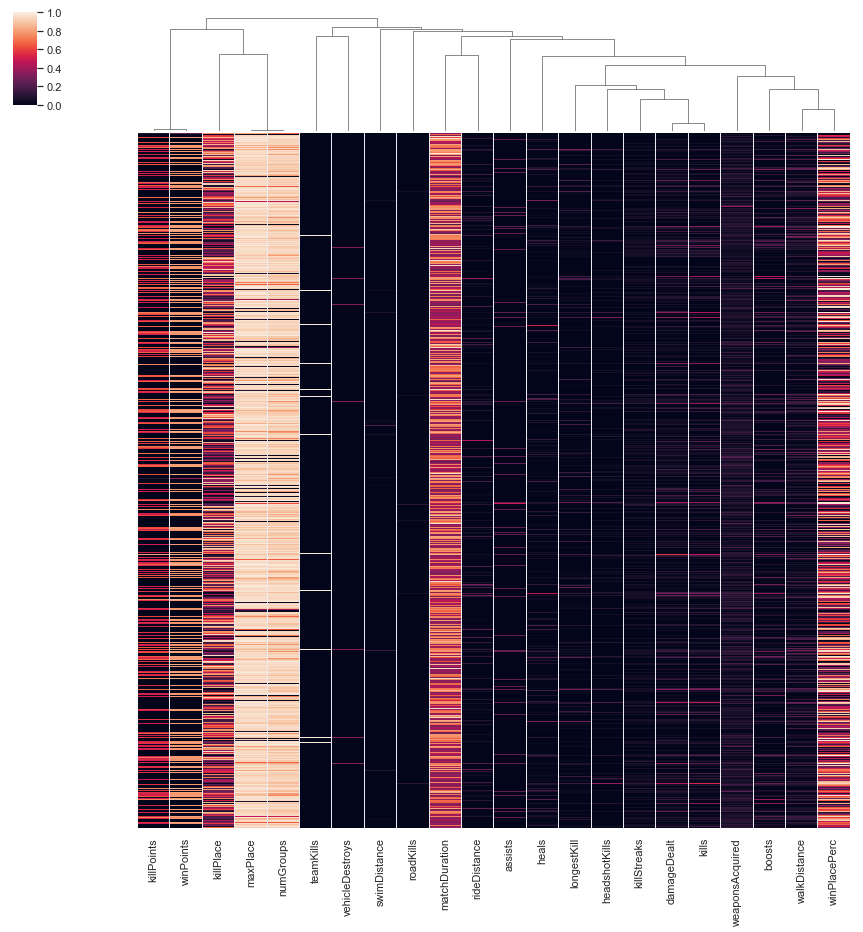

In [335]:
clustermap = sns.clustermap(solo[features], figsize = (15, 15), 
                            metric = "correlation", row_cluster = False, 
                            standard_scale = 1, yticklabels = [])

### Solo FPP Mode

In [336]:
solofpp.describe().T

,count,mean,std,min,25%,50%,75%,max
assists,536762.0,0.057640,0.245488,0.0,0.0000,0.0000,0.0000,5.0
boosts,536762.0,1.058978,1.791552,0.0,0.0000,0.0000,2.0000,28.0
damageDealt,536762.0,118.918582,158.345718,0.0,0.0000,75.7900,171.0000,2305.0
DBNOs,536762.0,0.000000,0.000000,0.0,0.0000,0.0000,0.0000,0.0
headshotKills,536762.0,0.251553,0.633480,0.0,0.0000,0.0000,0.0000,16.0
heals,536762.0,1.009677,2.383452,0.0,0.0000,0.0000,1.0000,63.0
killPlace,536762.0,48.025509,27.579988,1.0,24.0000,48.0000,72.0000,100.0
killPoints,536762.0,460.651026,606.861680,0.0,0.0000,0.0000,1120.0000,1970.0
kills,536762.0,0.934729,1.495987,0.0,0.0000,0.0000,1.0000,23.0
killStreaks,536762.0,0.482456,0.556407,0.0,0.0000,0.0000,1.0000,5.0


In [337]:
solofpp = solofpp.dropna()
solofpp.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 536761 entries, 0 to 536761
Data columns (total 28 columns):
Id                 536761 non-null object
groupId            536761 non-null object
matchId            536761 non-null object
assists            536761 non-null int64
boosts             536761 non-null int64
damageDealt        536761 non-null float64
DBNOs              536761 non-null int64
headshotKills      536761 non-null int64
heals              536761 non-null int64
killPlace          536761 non-null int64
killPoints         536761 non-null int64
kills              536761 non-null int64
killStreaks        536761 non-null int64
longestKill        536761 non-null float64
matchDuration      536761 non-null int64
matchType          536761 non-null object
maxPlace           536761 non-null int64
numGroups          536761 non-null int64
revives            536761 non-null int64
rideDistance       536761 non-null float64
roadKills          536761 non-null int64
swimDistance      

In [338]:
solofpp = solofpp.drop(["DBNOs", "revives"], axis = 1)

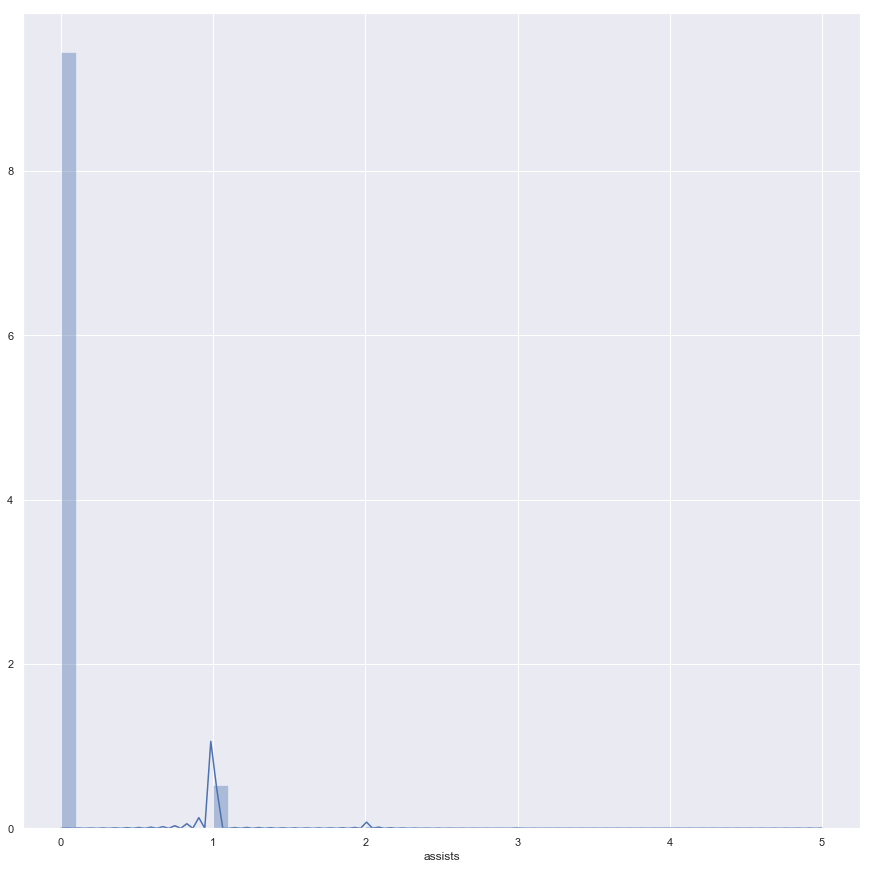

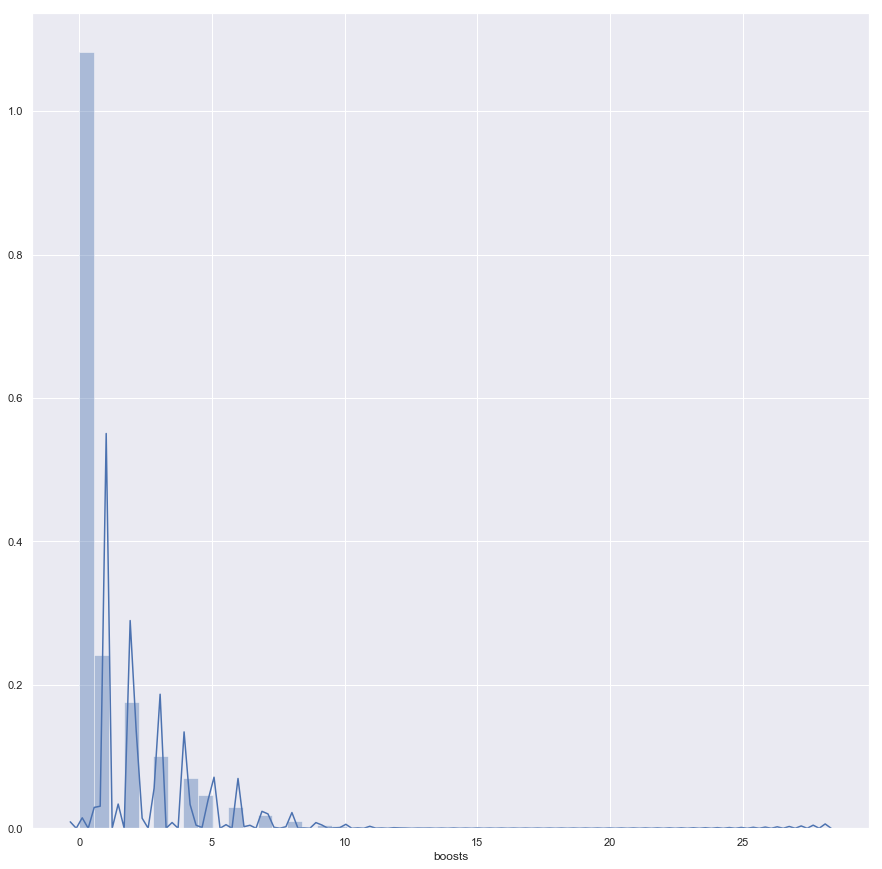

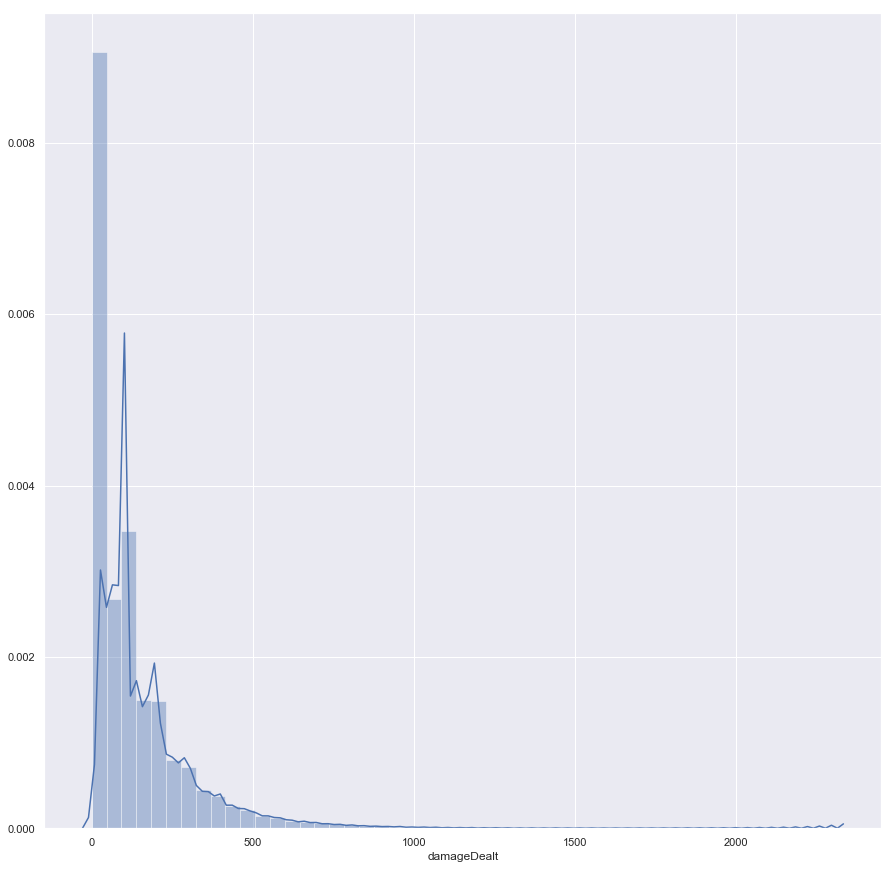

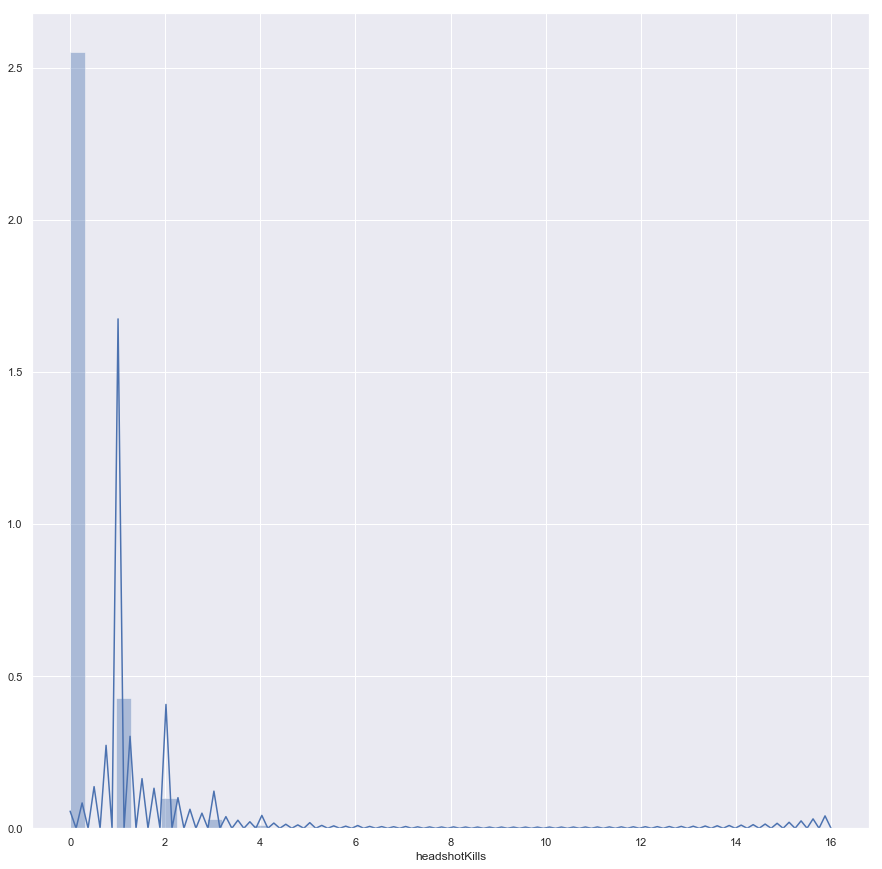

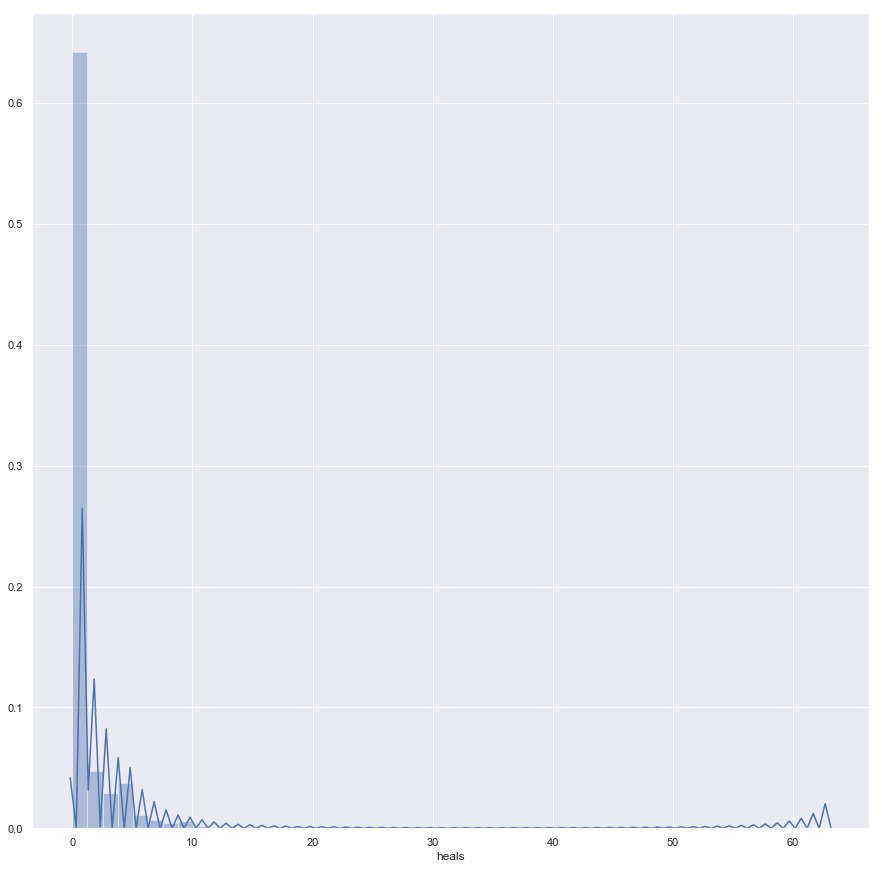

...

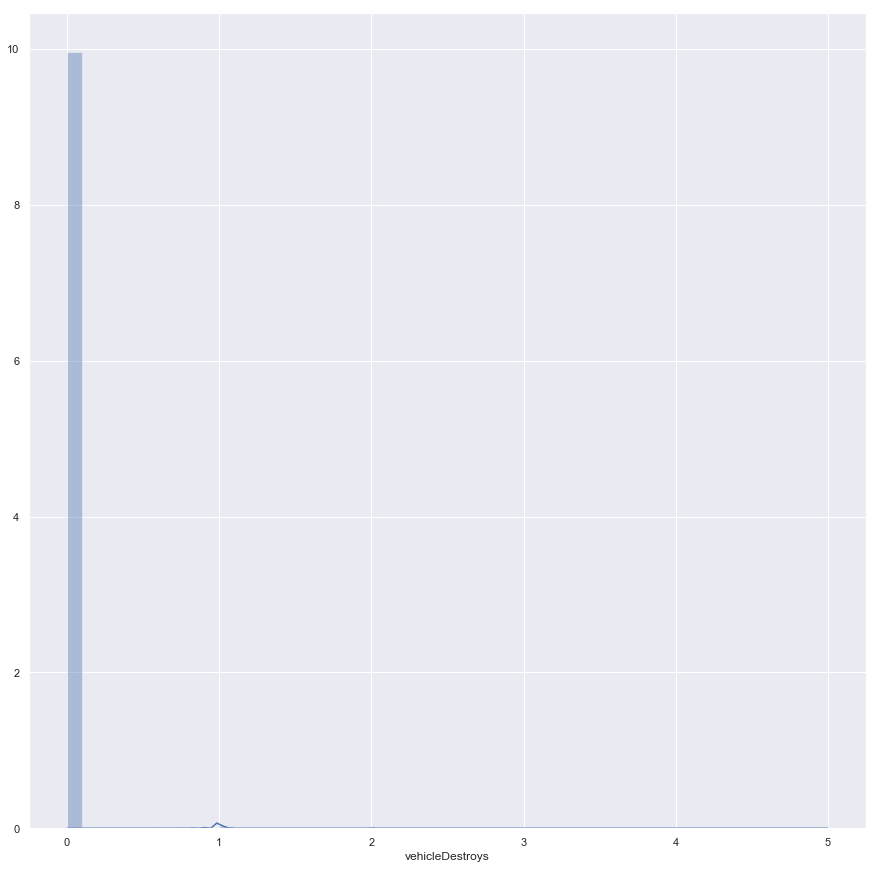

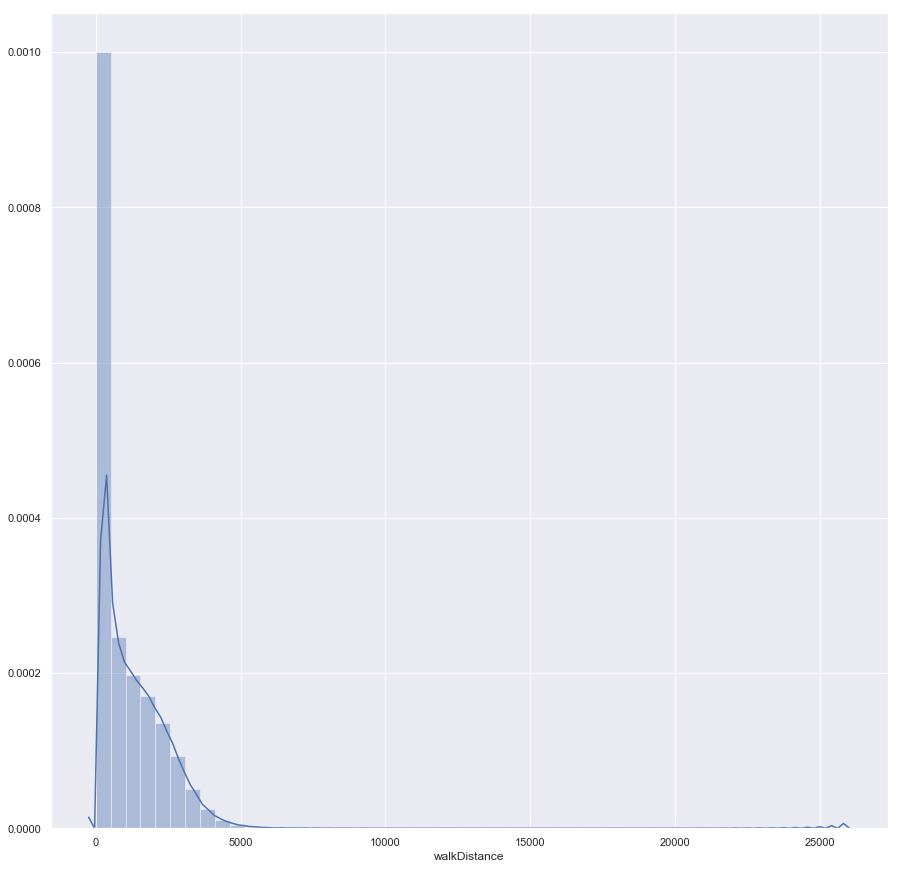

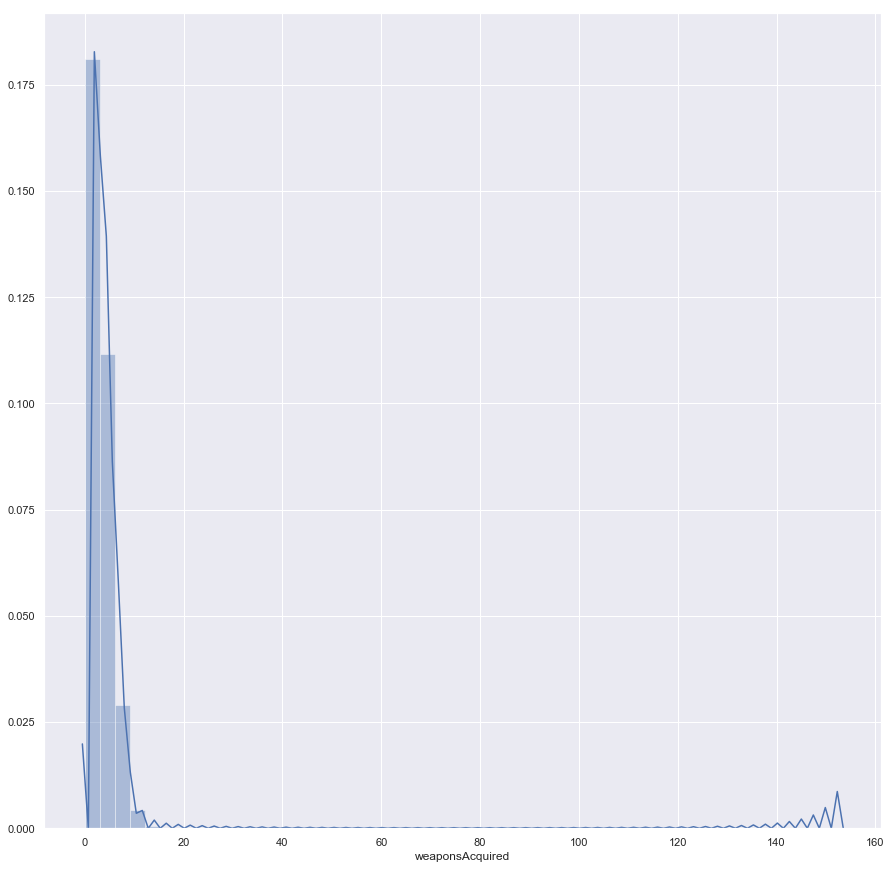

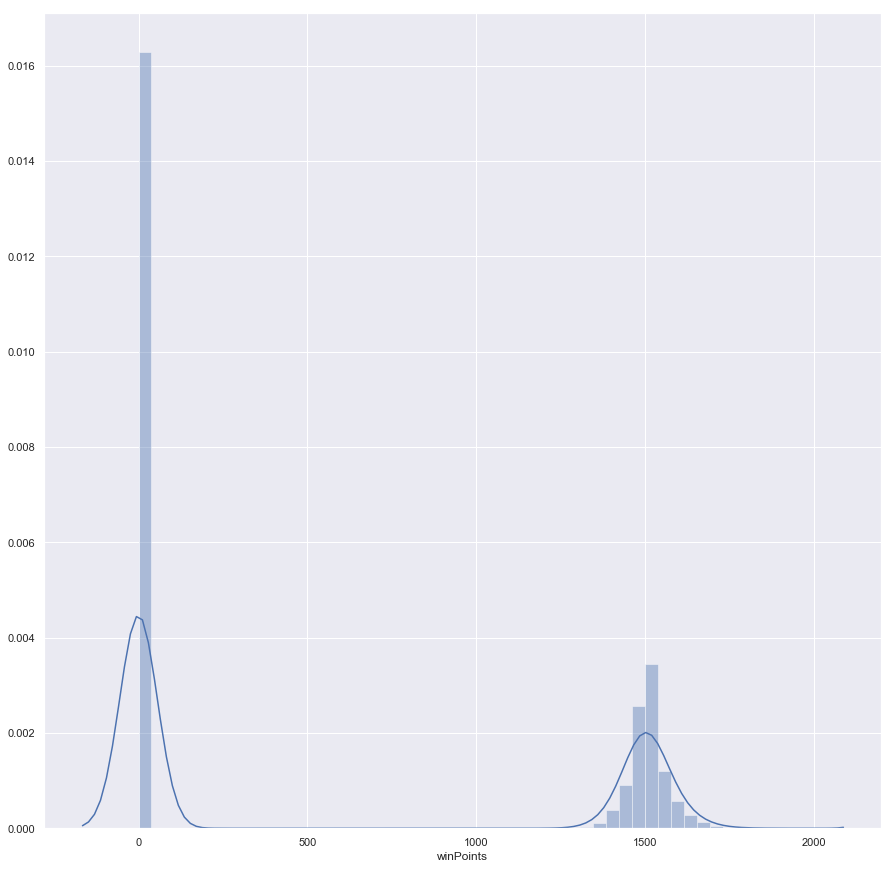

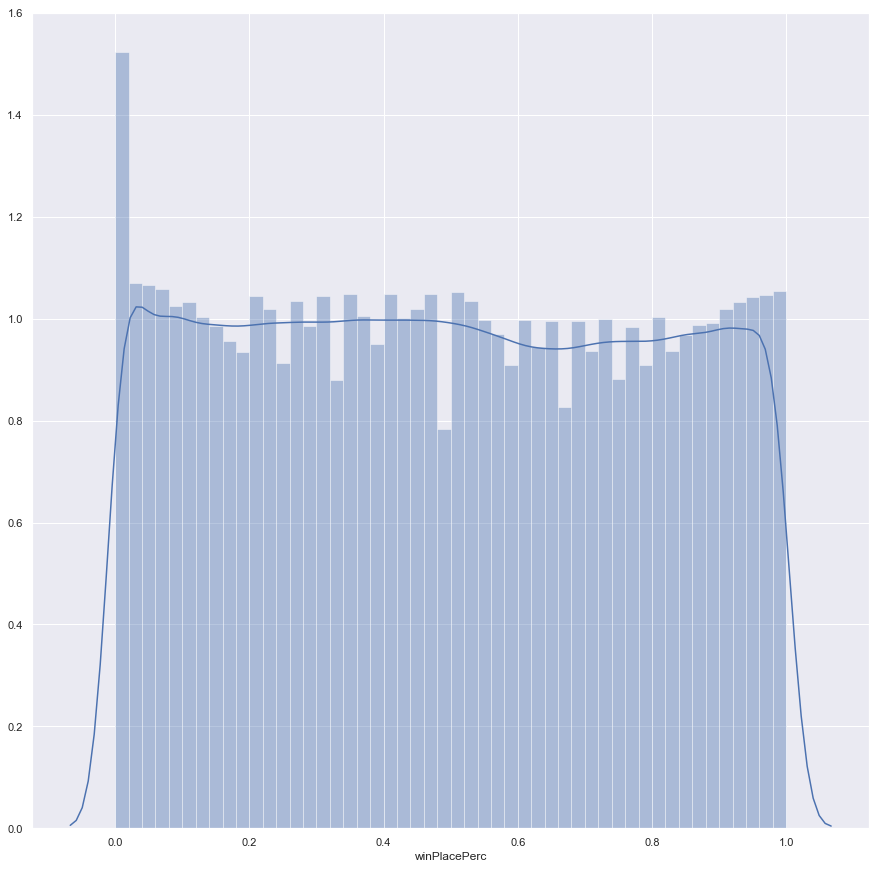

In [339]:
for feature in features:
    plt.figure(figsize = (15, 15))
    sns.distplot(solofpp[feature])

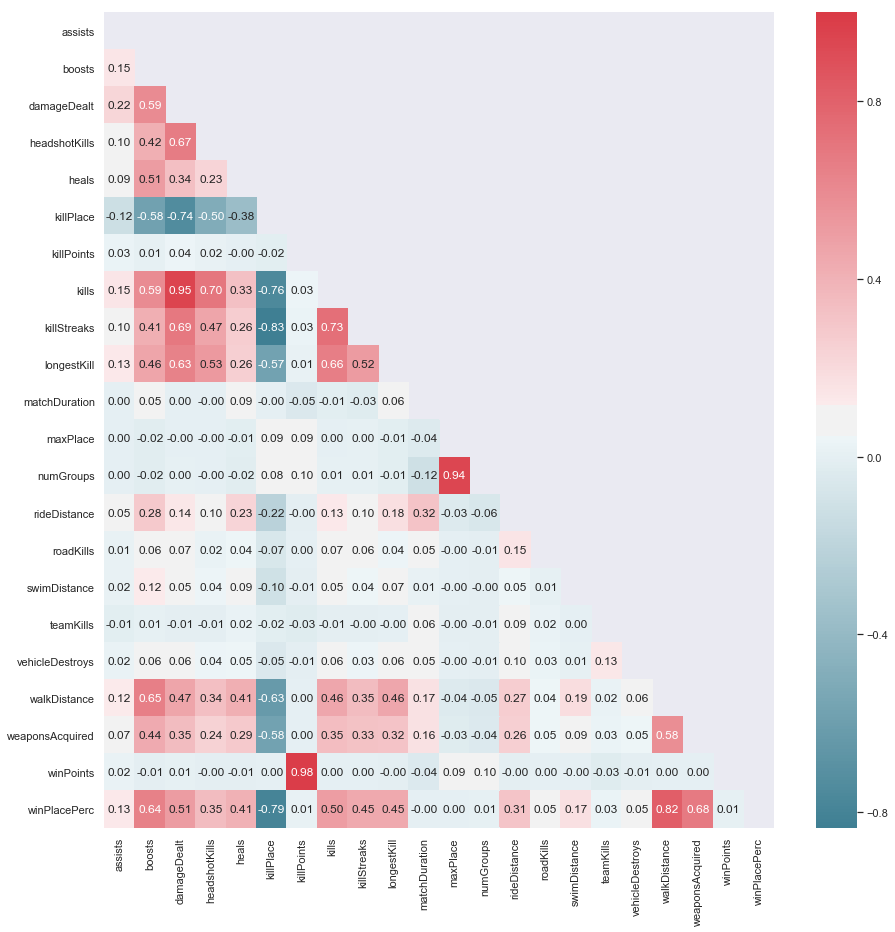

In [340]:
halfHeatMap(solofpp[features], mirror = False, corrtype = "pearson")

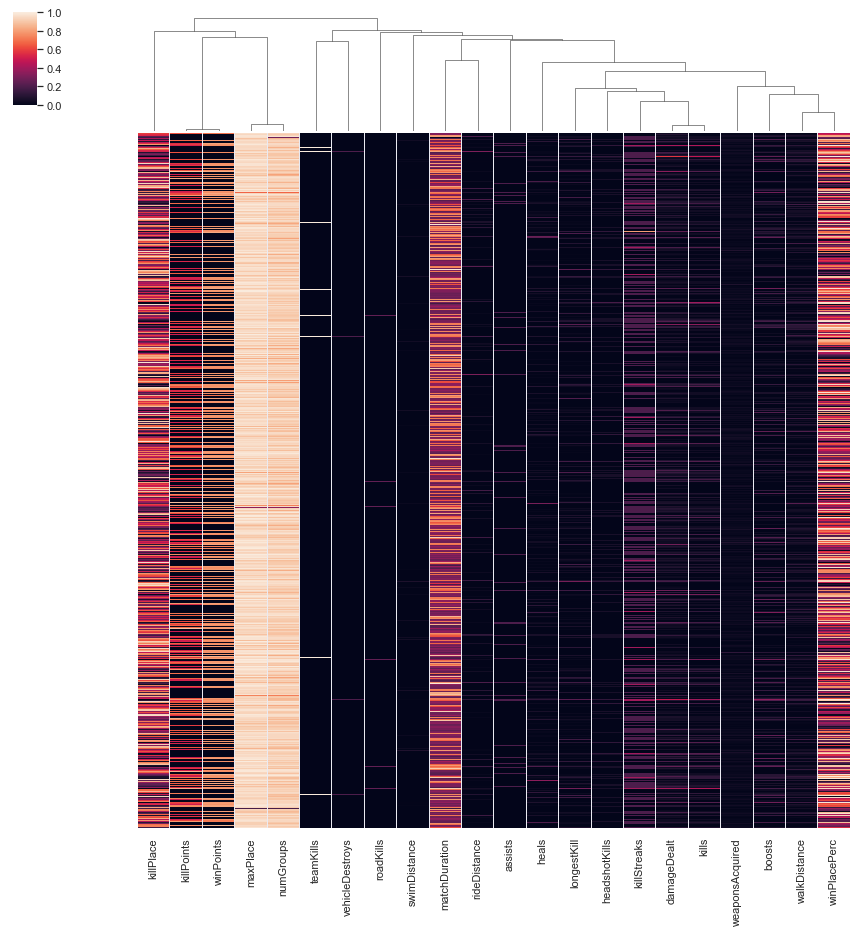

In [341]:
clustermap = sns.clustermap(solofpp[features], figsize = (15, 15), 
                            metric = "correlation", row_cluster = False, 
                            standard_scale = 1, yticklabels = [])

### Normal/FPP modes

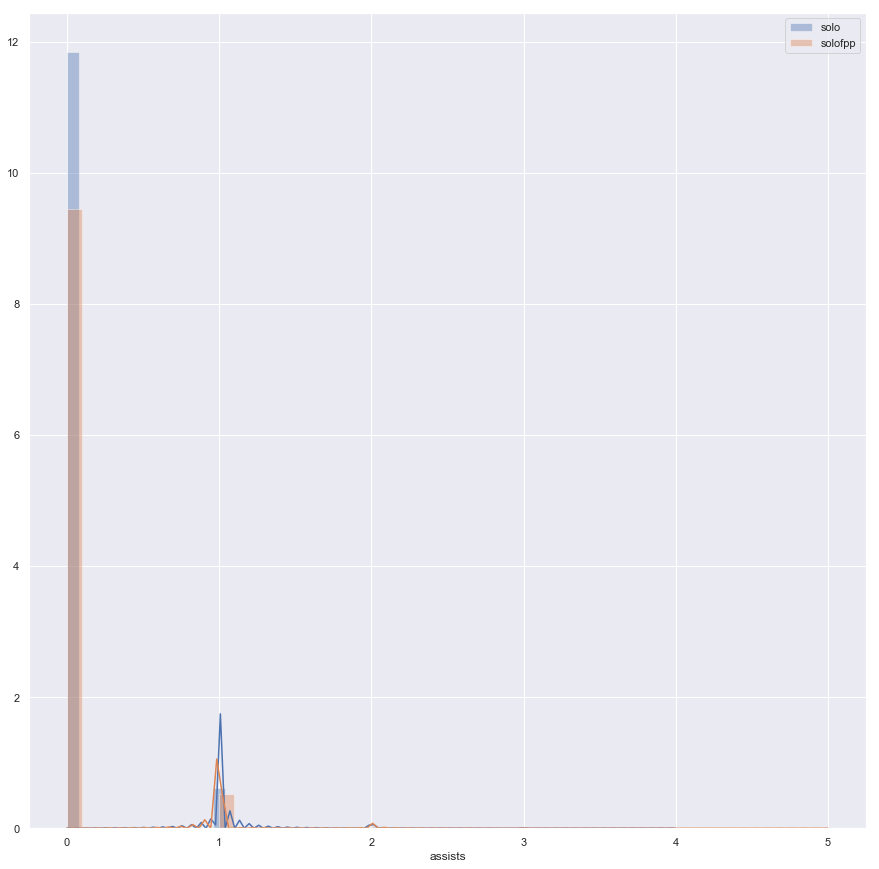

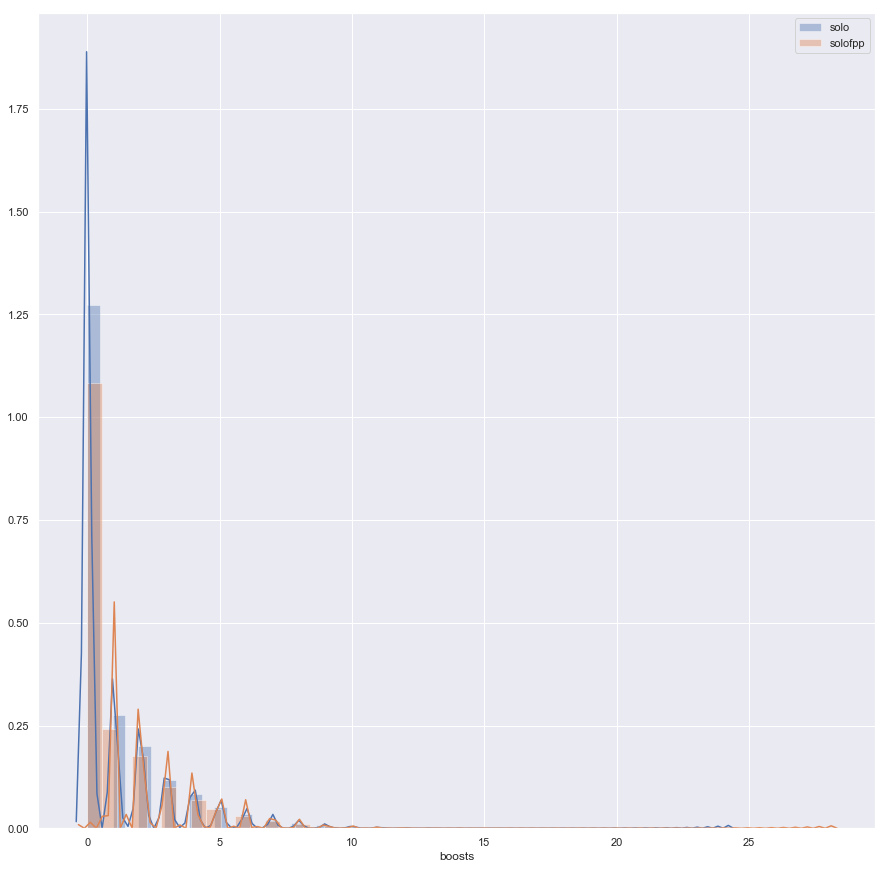

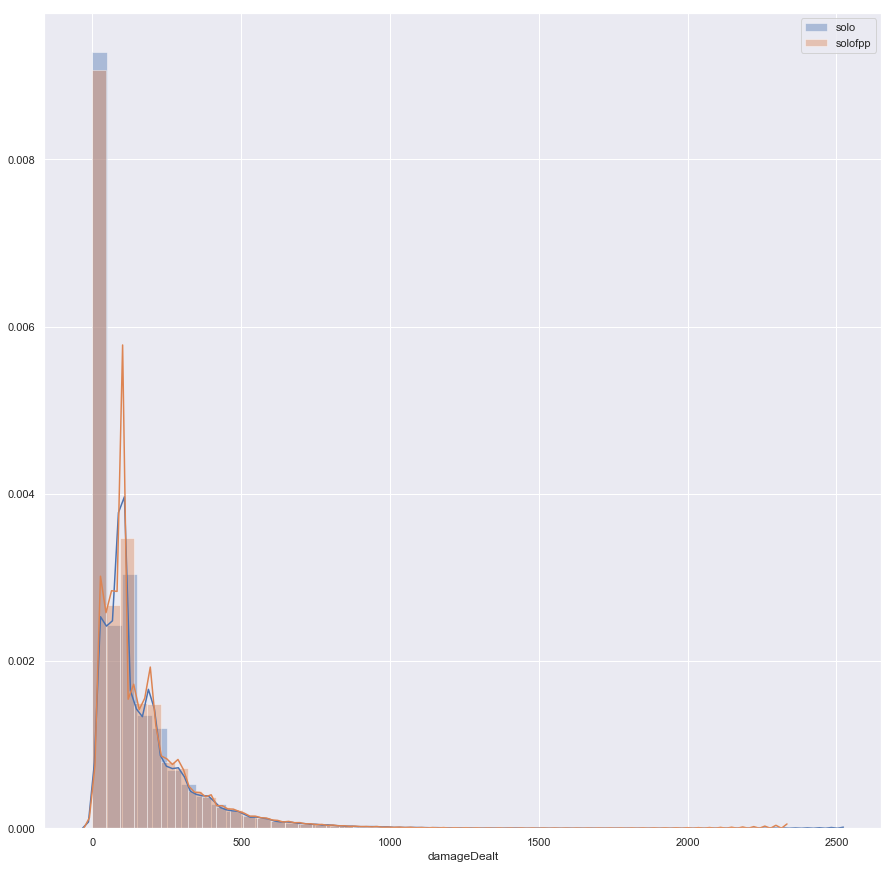

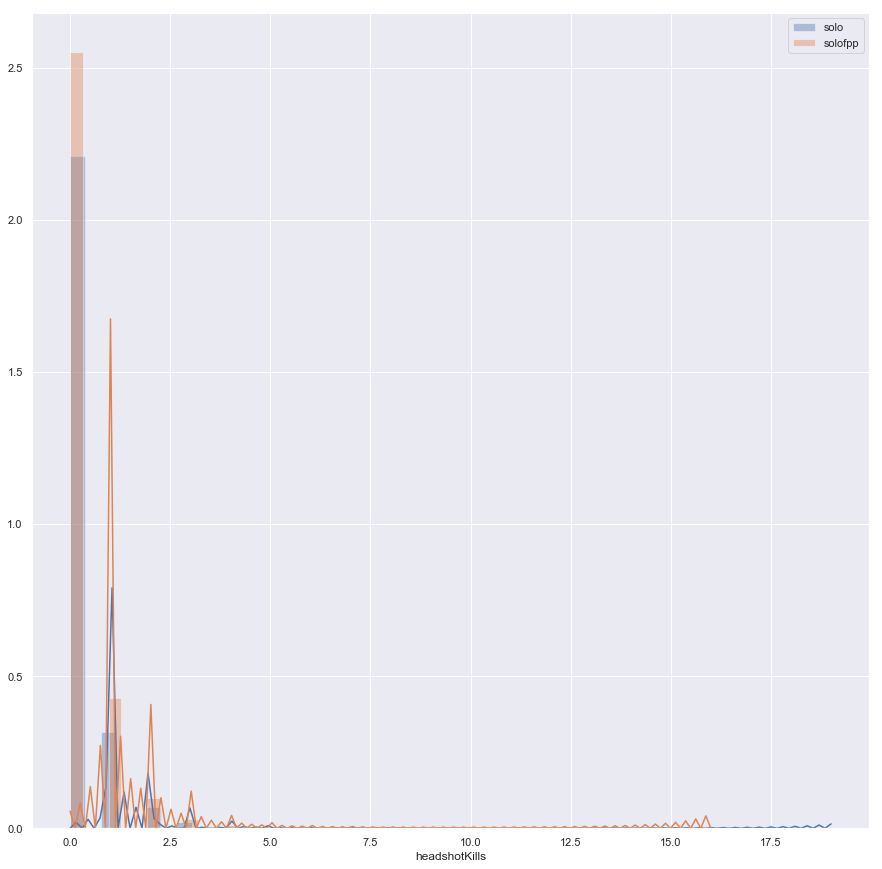

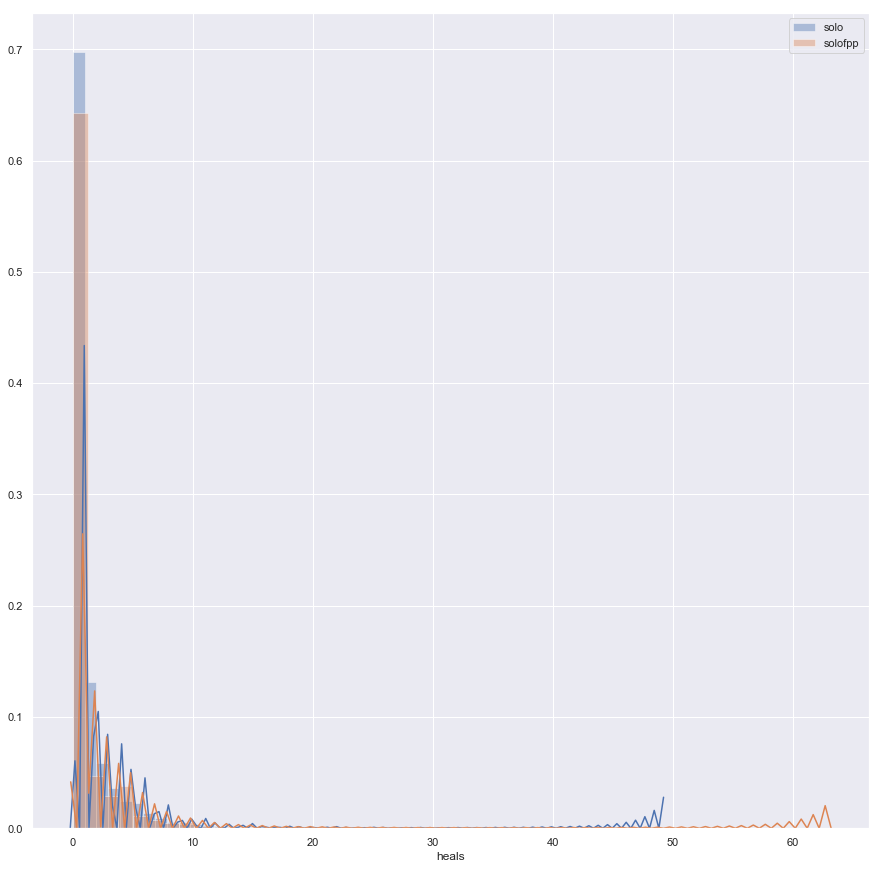

...

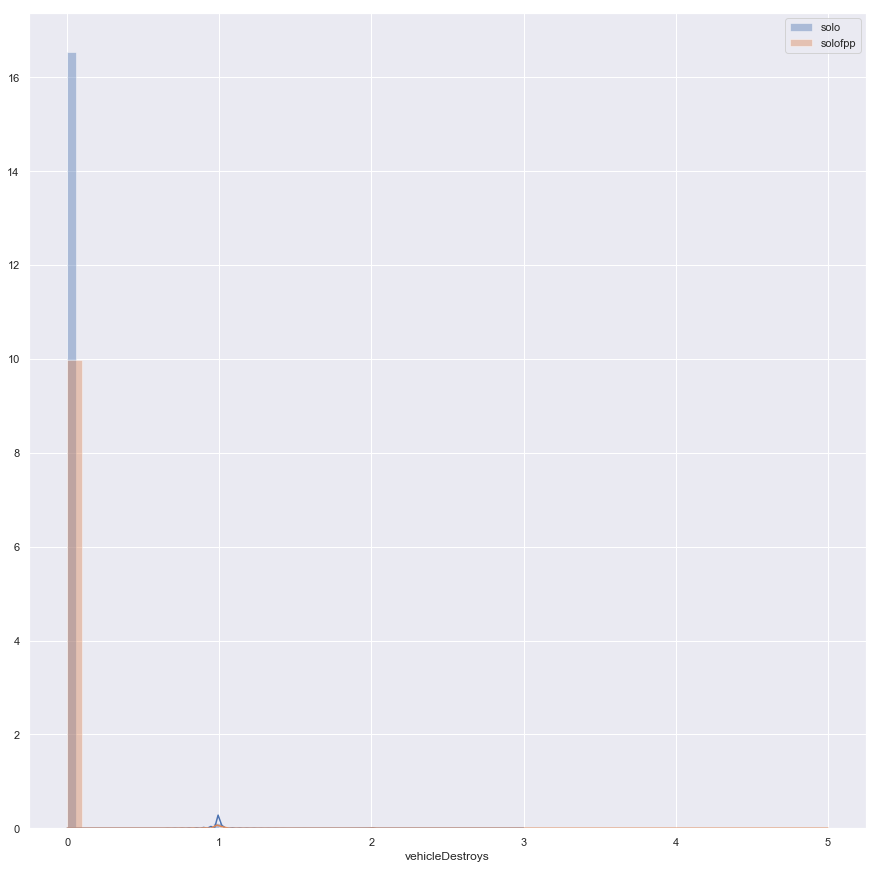

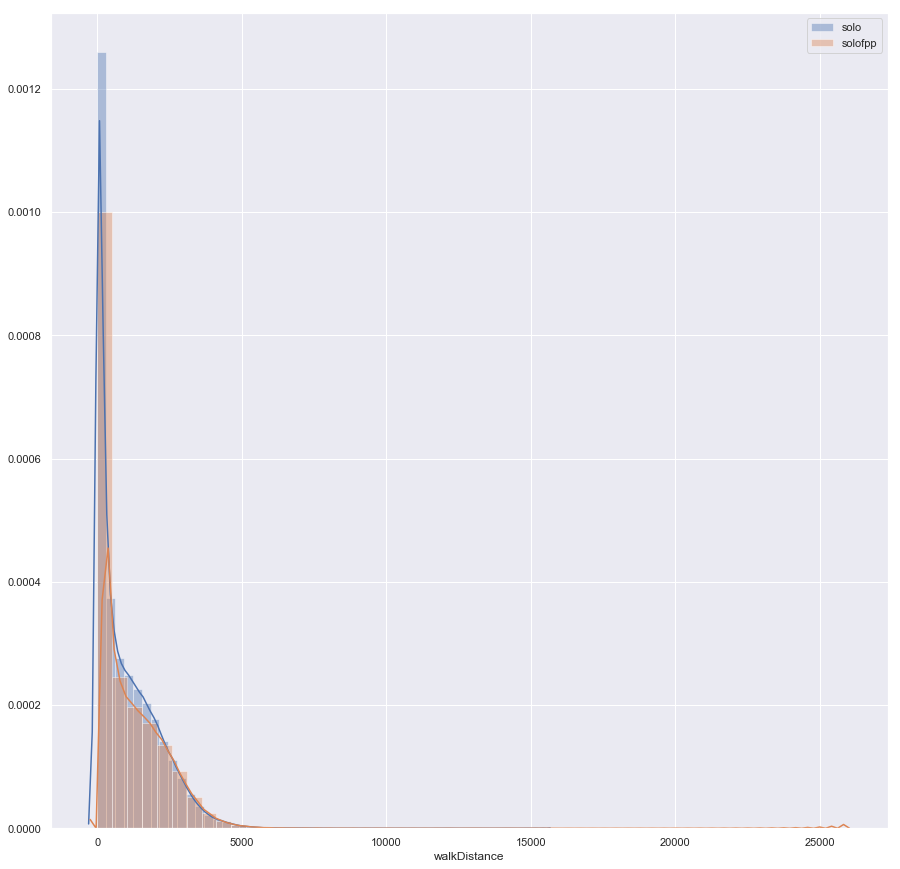

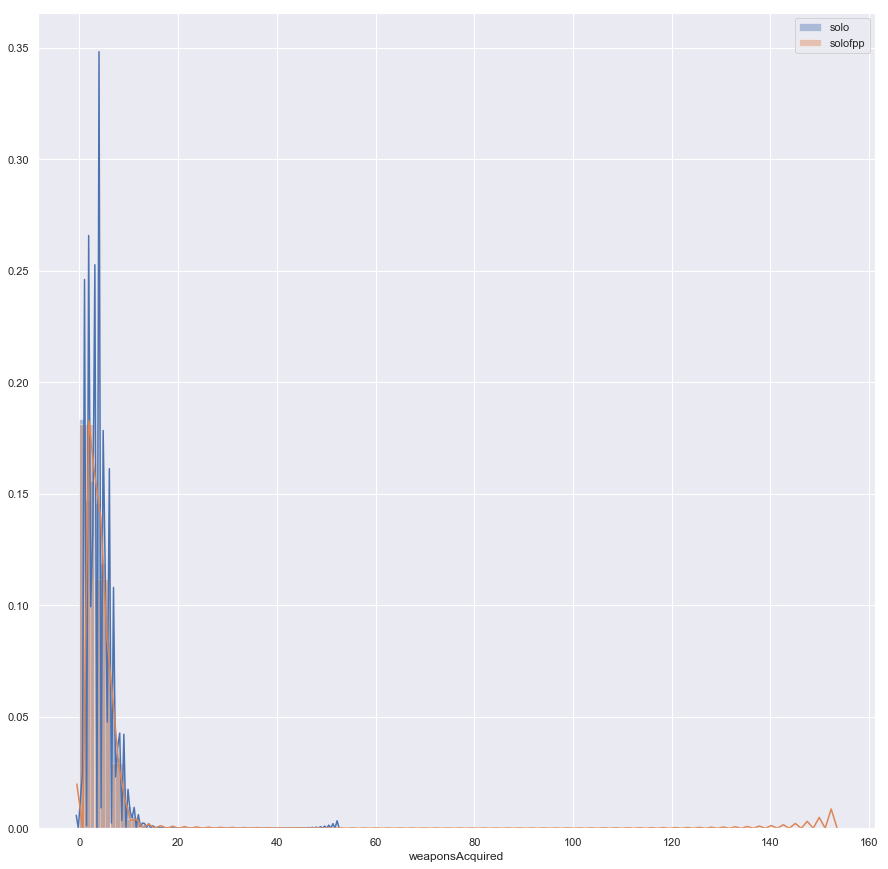

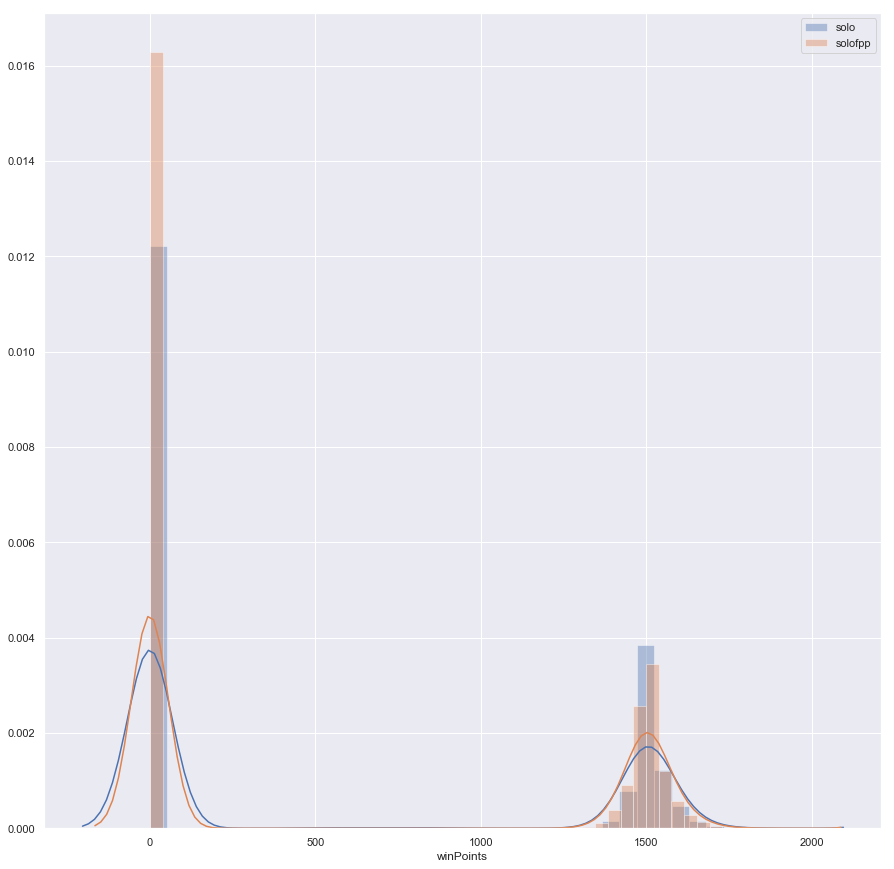

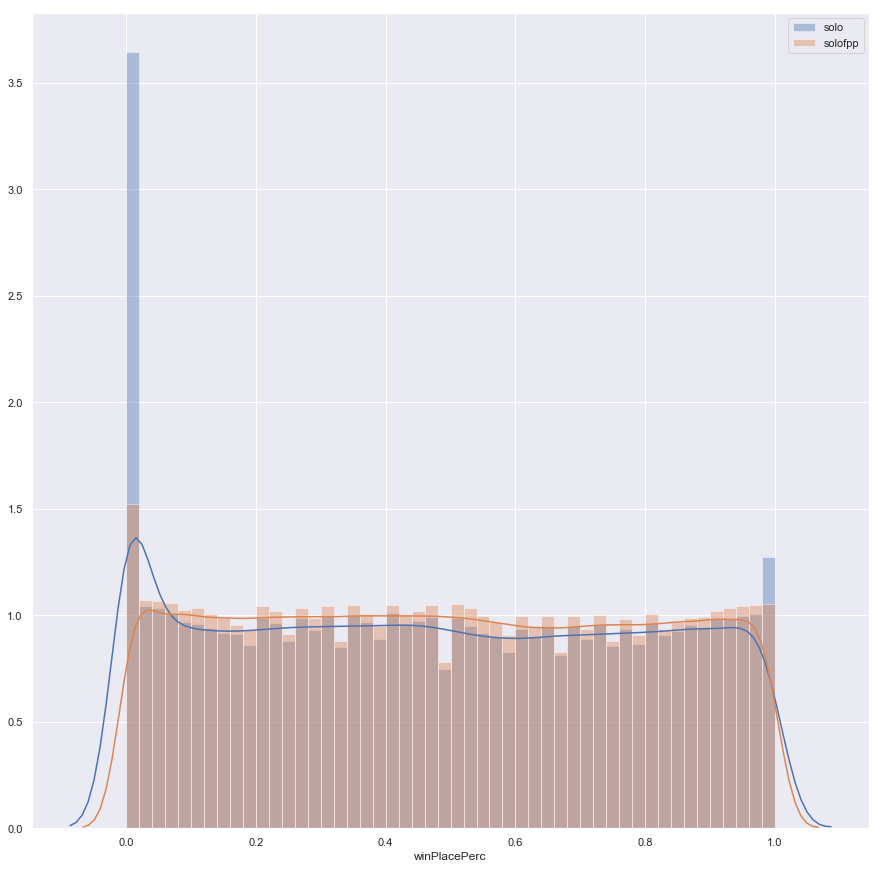

In [342]:
for feature in features:
    fig, ax = plt.subplots(figsize = (15, 15))
    sns.distplot(solo[feature], ax = ax, label = "solo")
    sns.distplot(solofpp[feature], ax = ax, label = "solofpp")
    ax.legend()

## Duo Modes

In [343]:
duo = train_dict["duo"].reset_index(drop = True)
duofpp = train_dict["duo-fpp"].reset_index(drop = True)

### Duo Mode

In [344]:
duo.describe().T

,count,mean,std,min,25%,50%,75%,max
assists,313591.0,0.213676,0.536297,0.0,0.0000,0.0000,0.00,8.0
boosts,313591.0,1.133486,1.769551,0.0,0.0000,0.0000,2.00,19.0
damageDealt,313591.0,126.321987,167.128966,0.0,0.0000,78.6500,180.40,2333.0
DBNOs,313591.0,0.610553,0.965529,0.0,0.0000,0.0000,1.00,31.0
headshotKills,313591.0,0.212576,0.592413,0.0,0.0000,0.0000,0.00,17.0
heals,313591.0,1.338989,2.642116,0.0,0.0000,0.0000,1.00,62.0
killPlace,313591.0,47.408660,27.230830,1.0,24.0000,47.0000,71.00,100.0
killPoints,313591.0,443.144156,569.591462,0.0,0.0000,0.0000,1060.00,1967.0
kills,313591.0,0.907966,1.518920,0.0,0.0000,0.0000,1.00,21.0
killStreaks,313591.0,0.545258,0.717018,0.0,0.0000,0.0000,1.00,10.0


In [345]:
duo.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 313591 entries, 0 to 313590
Data columns (total 28 columns):
Id                 313591 non-null object
groupId            313591 non-null object
matchId            313591 non-null object
assists            313591 non-null int64
boosts             313591 non-null int64
damageDealt        313591 non-null float64
DBNOs              313591 non-null int64
headshotKills      313591 non-null int64
heals              313591 non-null int64
killPlace          313591 non-null int64
killPoints         313591 non-null int64
kills              313591 non-null int64
killStreaks        313591 non-null int64
longestKill        313591 non-null float64
matchDuration      313591 non-null int64
matchType          313591 non-null object
maxPlace           313591 non-null int64
numGroups          313591 non-null int64
revives            313591 non-null int64
rideDistance       313591 non-null float64
roadKills          313591 non-null int64
swimDistance      

In [346]:
team_features = list(duo.describe().columns)
team_features

['assists',
 'boosts',
 'damageDealt',
 'DBNOs',
 'headshotKills',
 'heals',
 'killPlace',
 'killPoints',
 'kills',
 'killStreaks',
 'longestKill',
 'matchDuration',
 'maxPlace',
 'numGroups',
 'revives',
 'rideDistance',
 'roadKills',
 'swimDistance',
 'teamKills',
 'vehicleDestroys',
 'walkDistance',
 'weaponsAcquired',
 'winPoints',
 'winPlacePerc']

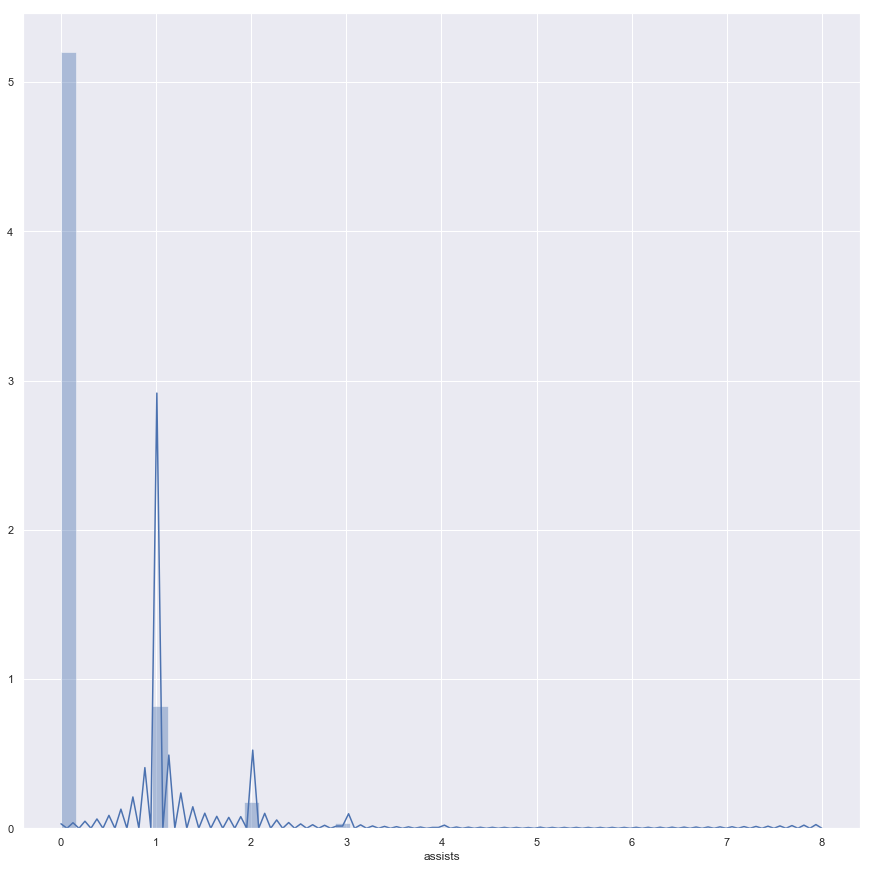

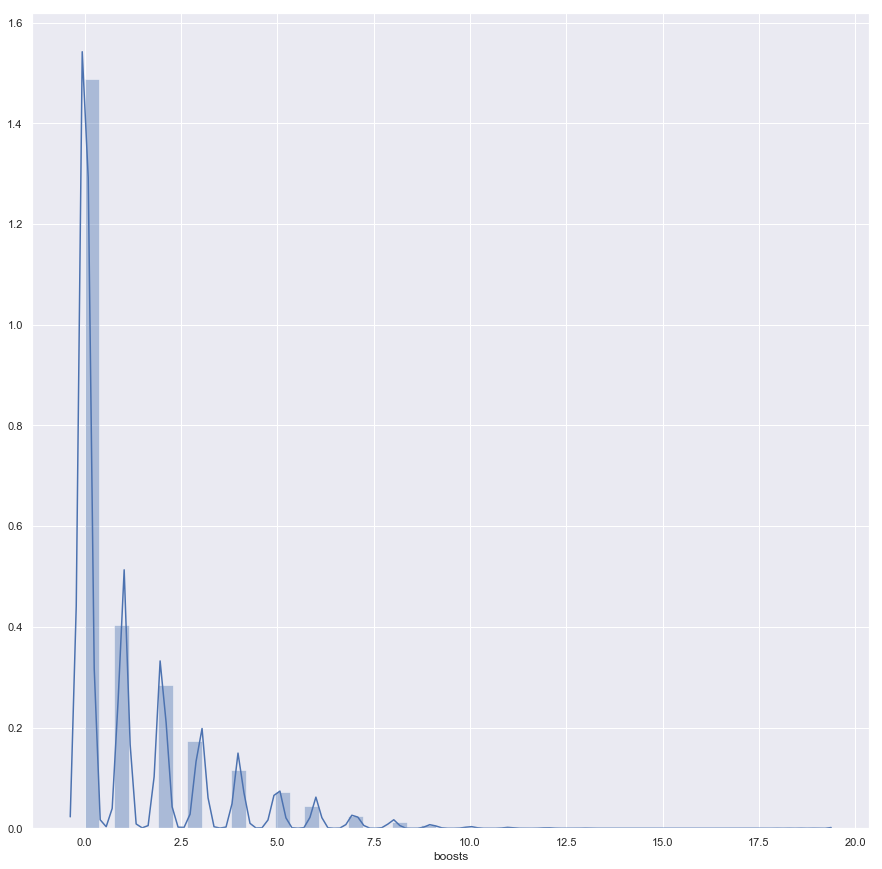

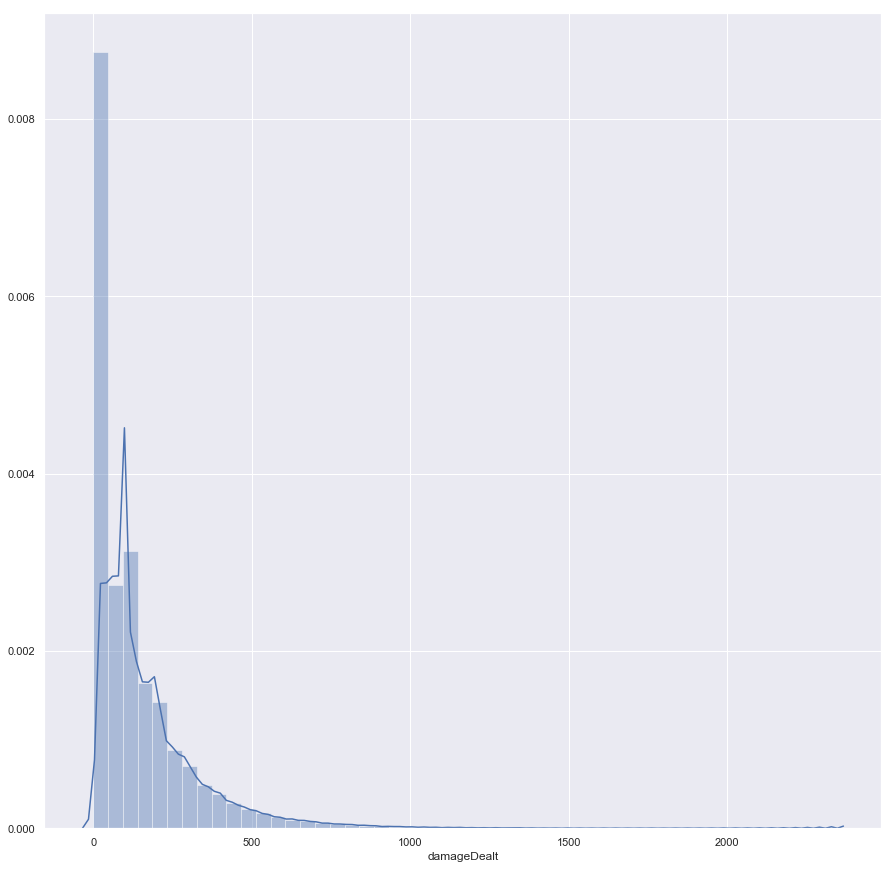

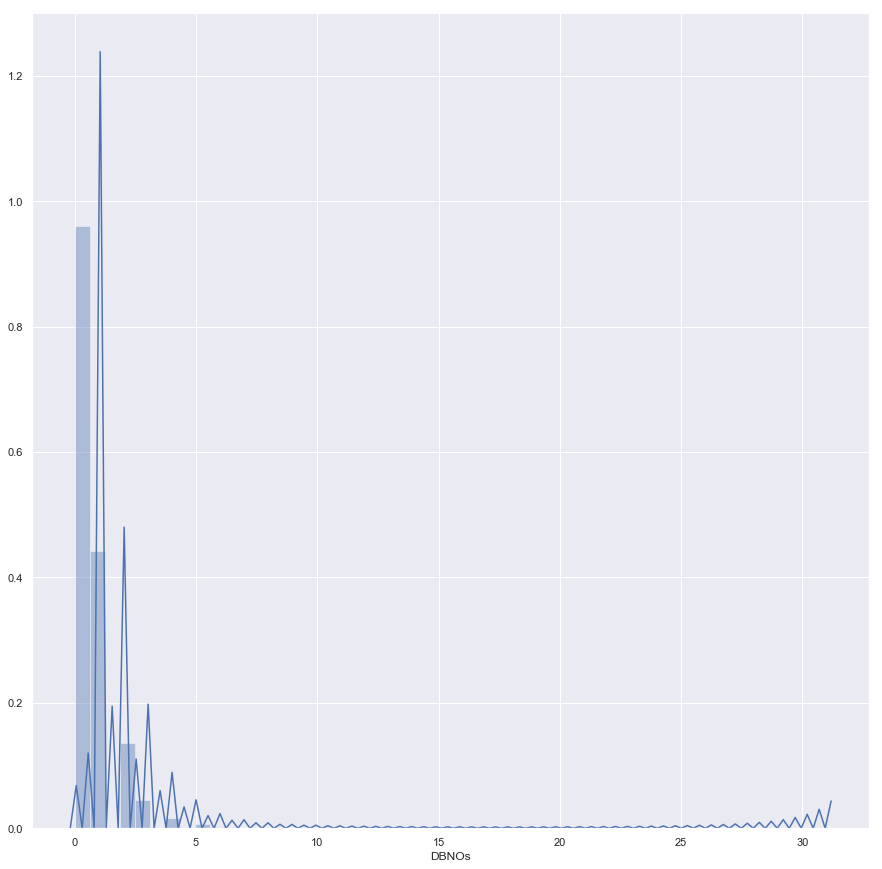

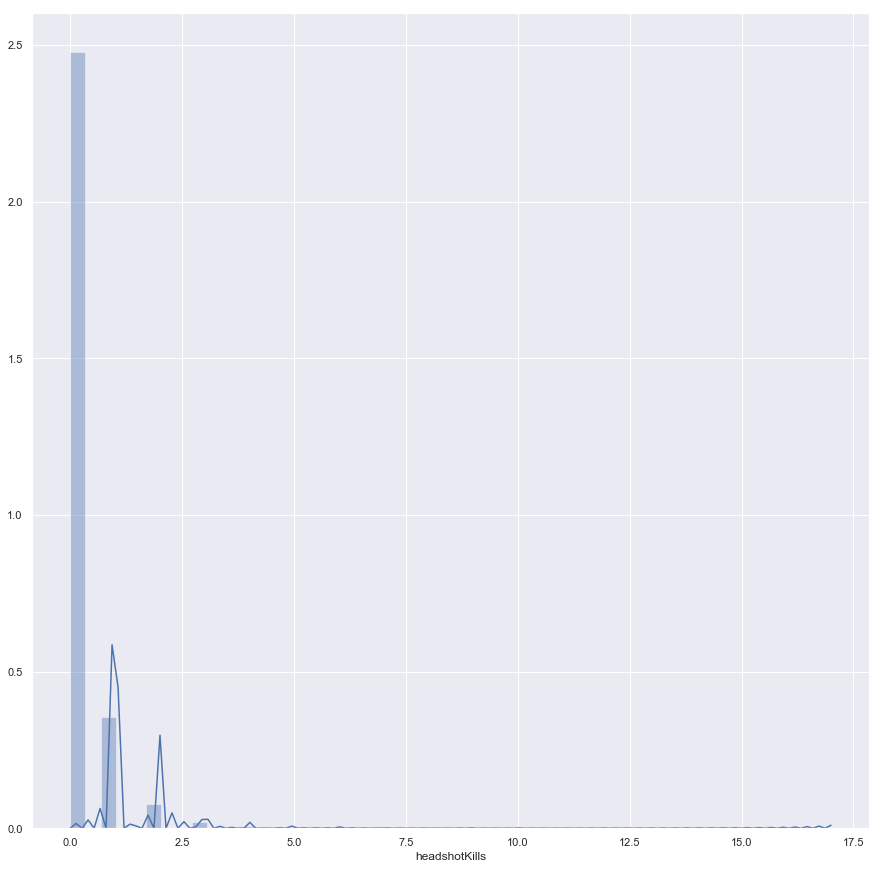

...

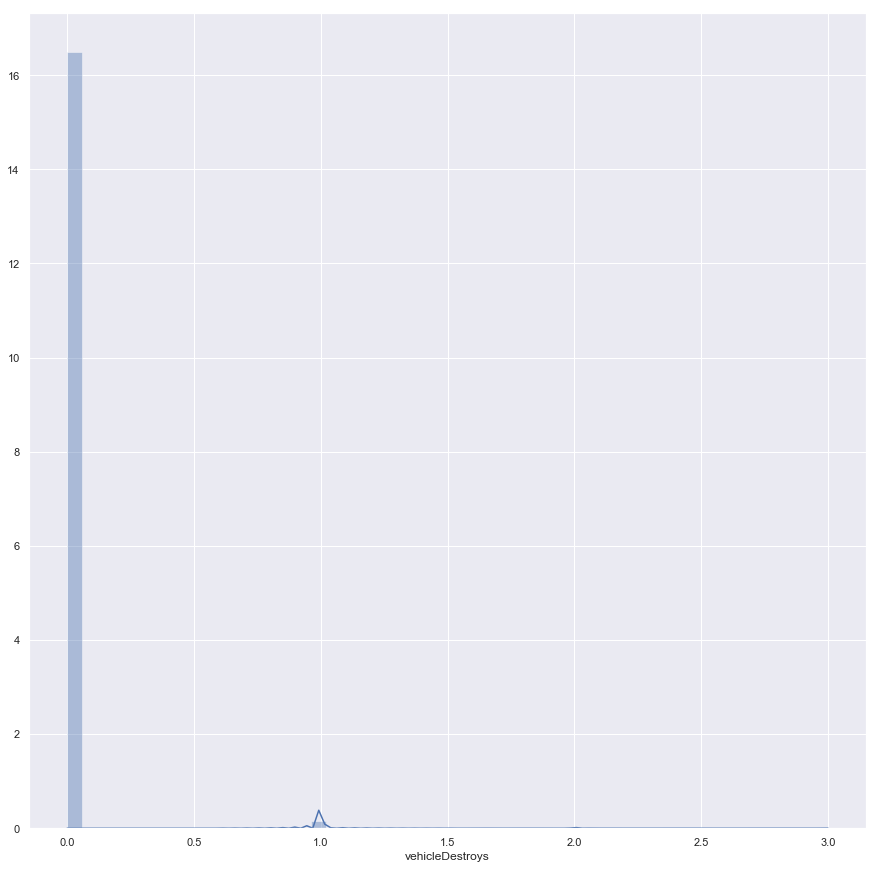

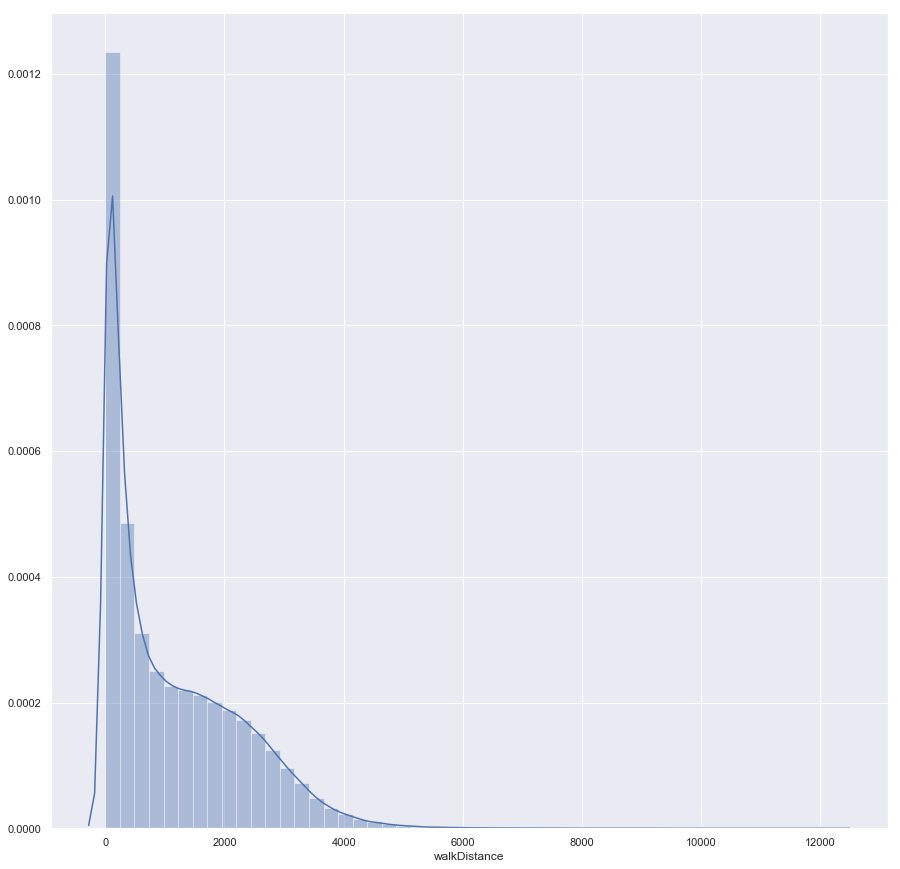

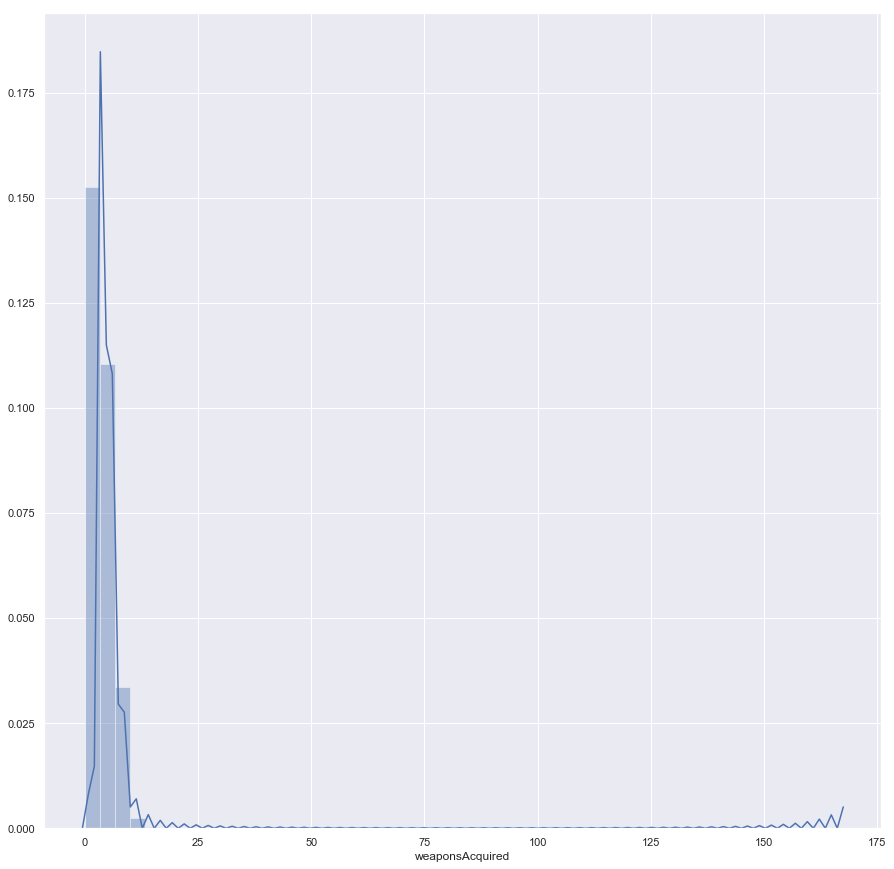

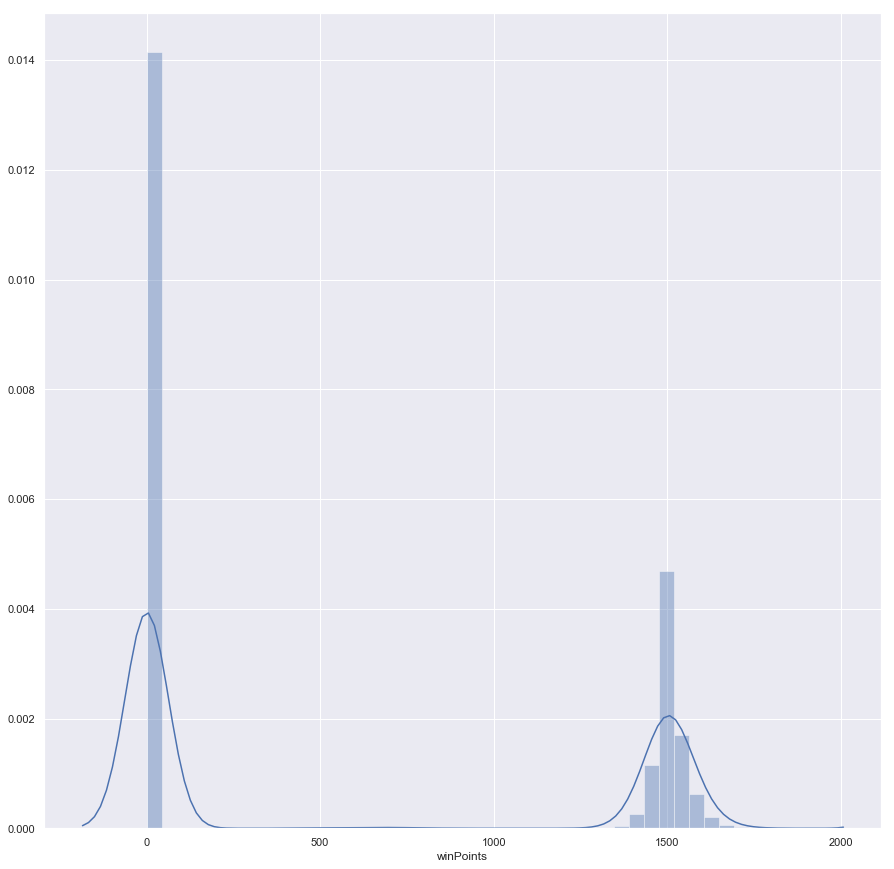

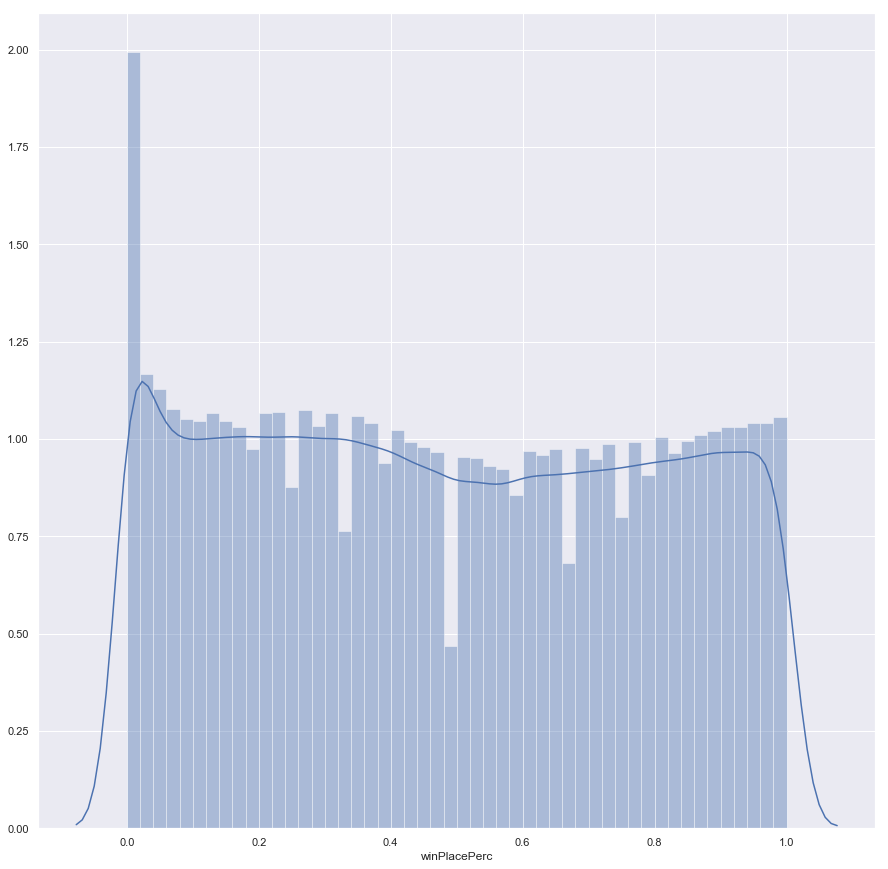

In [347]:
for feature in team_features:
    plt.figure(figsize = (15, 15))
    sns.distplot(duo[feature])

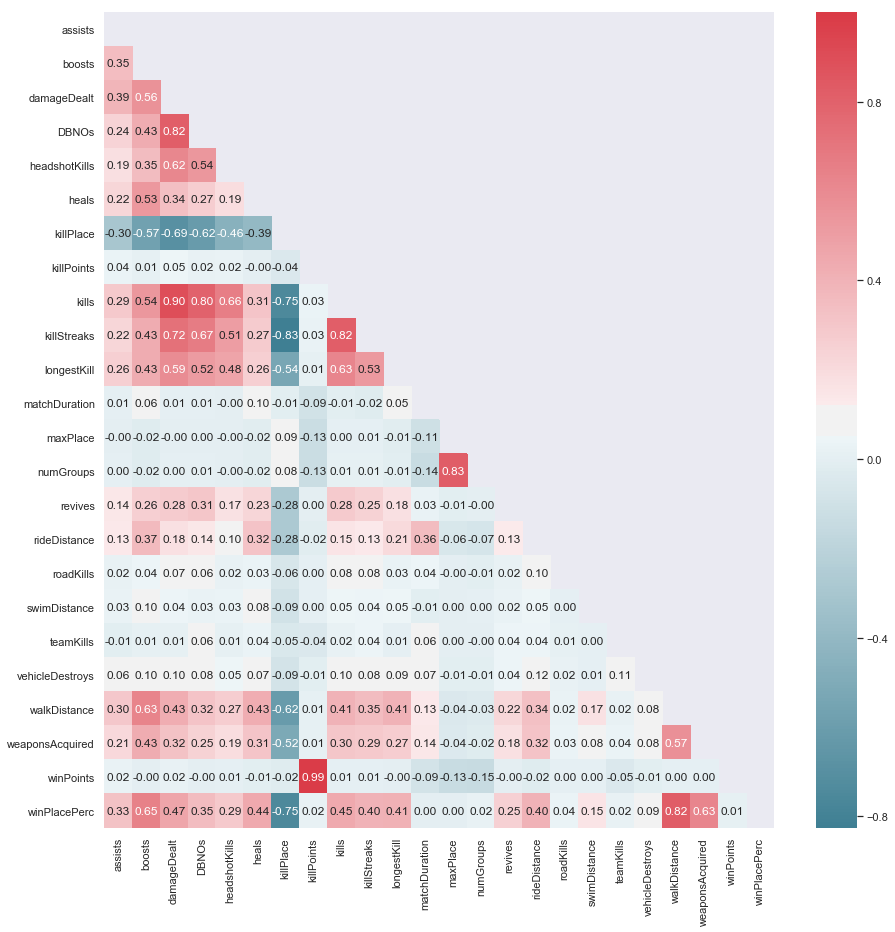

In [348]:
halfHeatMap(duo[team_features], mirror = False, corrtype = "pearson")

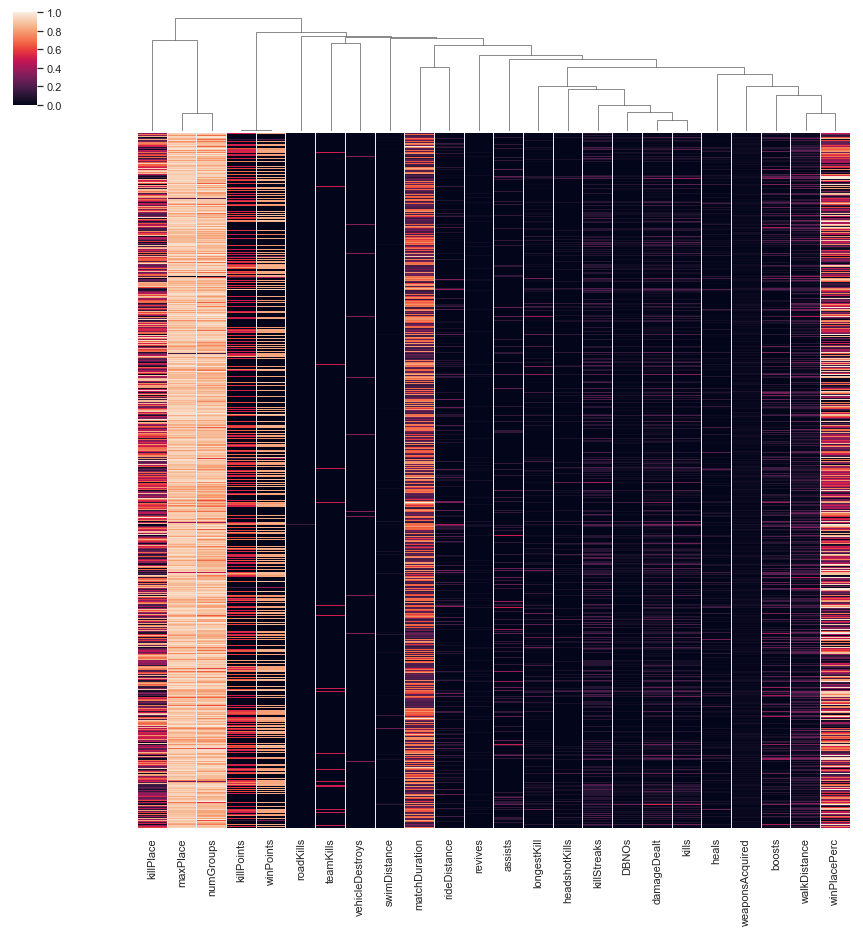

In [349]:
clustermap = sns.clustermap(duo[team_features], figsize = (15, 15), 
                            metric = "correlation", row_cluster = False, 
                            standard_scale = 1, yticklabels = [])

### Duo FPP Mode

In [350]:
duofpp.describe().T

,count,mean,std,min,25%,50%,75%,max
assists,996691.0,0.215806,0.535652,0.0,0.0000,0.0000,0.00,9.0
boosts,996691.0,1.078022,1.696287,0.0,0.0000,0.0000,2.00,21.0
damageDealt,996691.0,132.249549,165.832945,0.0,0.0000,86.4300,189.50,3240.0
DBNOs,996691.0,0.628594,0.951734,0.0,0.0000,0.0000,1.00,25.0
headshotKills,996691.0,0.225009,0.572762,0.0,0.0000,0.0000,0.00,16.0
heals,996691.0,1.328823,2.582781,0.0,0.0000,0.0000,1.00,59.0
killPlace,996691.0,47.638865,27.356901,1.0,24.0000,47.0000,71.00,100.0
killPoints,996691.0,485.647968,614.394604,0.0,0.0000,0.0000,1148.00,1959.0
kills,996691.0,0.926086,1.512765,0.0,0.0000,0.0000,1.00,22.0
killStreaks,996691.0,0.566743,0.730104,0.0,0.0000,0.0000,1.00,8.0


In [351]:
duofpp.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 996691 entries, 0 to 996690
Data columns (total 28 columns):
Id                 996691 non-null object
groupId            996691 non-null object
matchId            996691 non-null object
assists            996691 non-null int64
boosts             996691 non-null int64
damageDealt        996691 non-null float64
DBNOs              996691 non-null int64
headshotKills      996691 non-null int64
heals              996691 non-null int64
killPlace          996691 non-null int64
killPoints         996691 non-null int64
kills              996691 non-null int64
killStreaks        996691 non-null int64
longestKill        996691 non-null float64
matchDuration      996691 non-null int64
matchType          996691 non-null object
maxPlace           996691 non-null int64
numGroups          996691 non-null int64
revives            996691 non-null int64
rideDistance       996691 non-null float64
roadKills          996691 non-null int64
swimDistance      

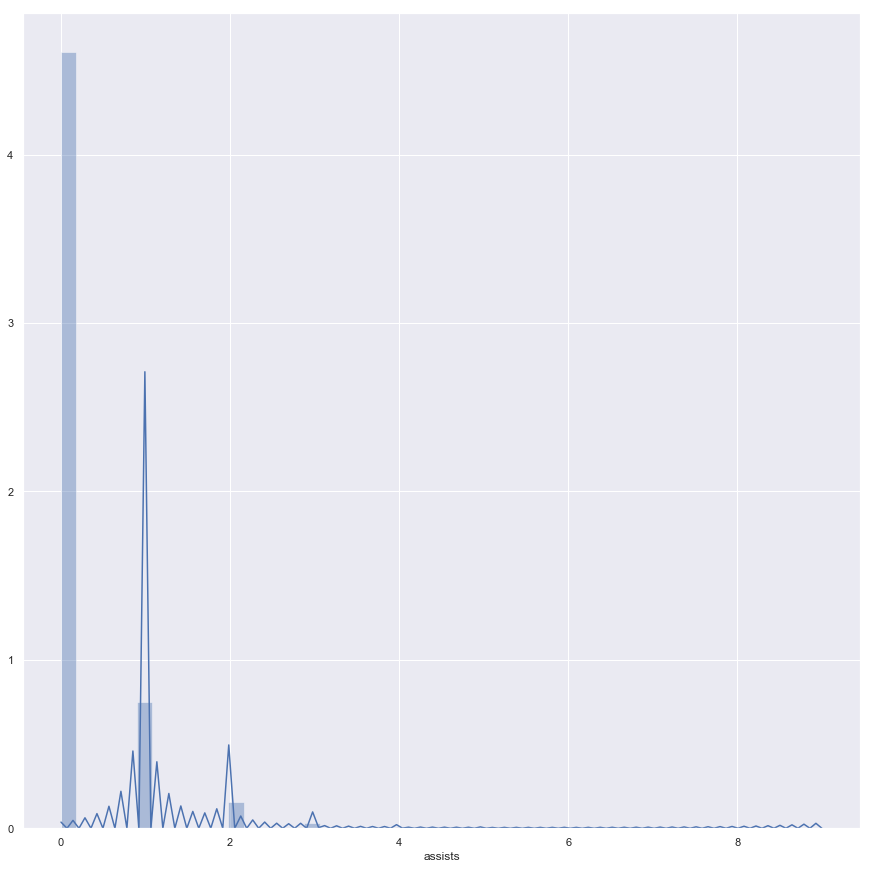

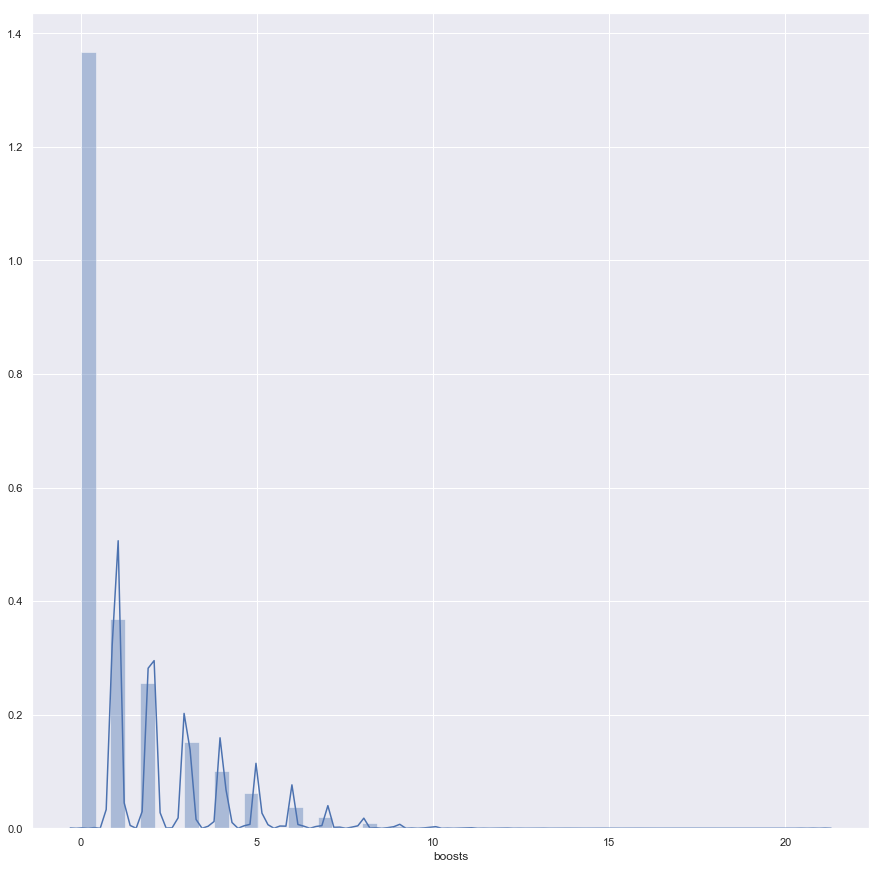

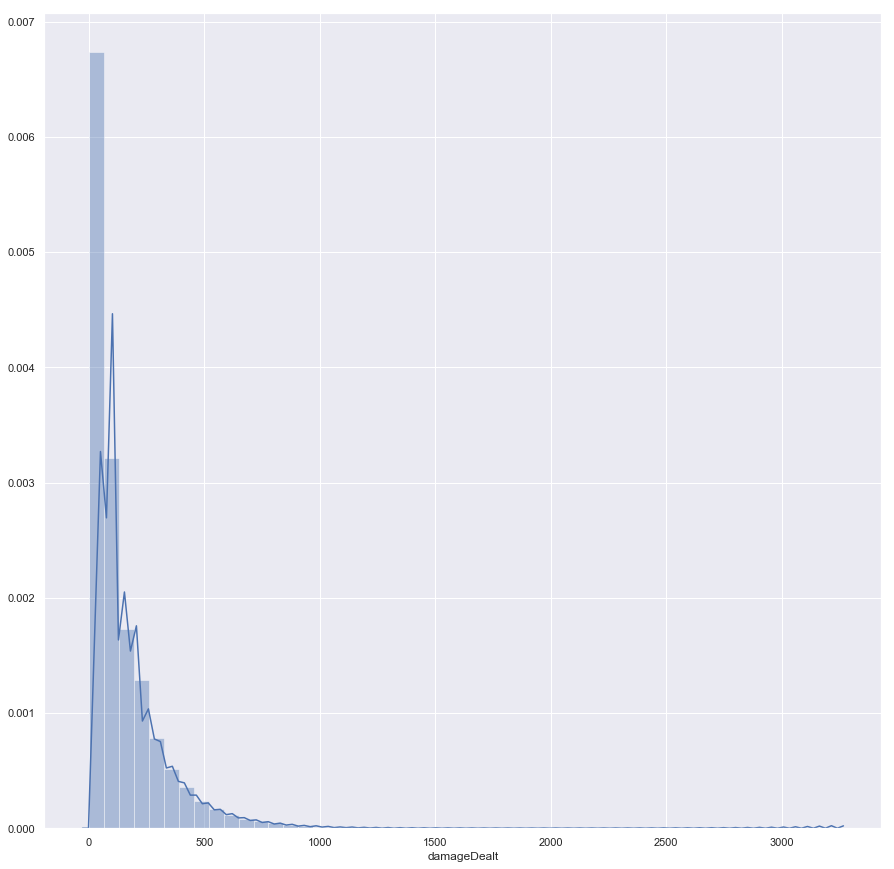

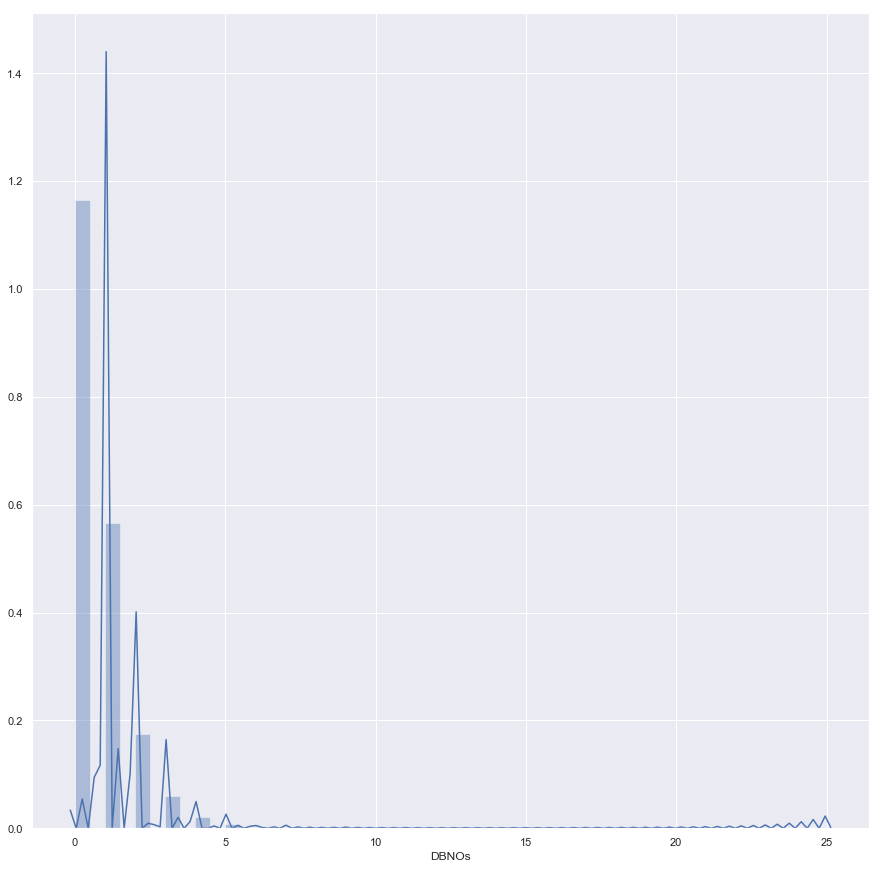

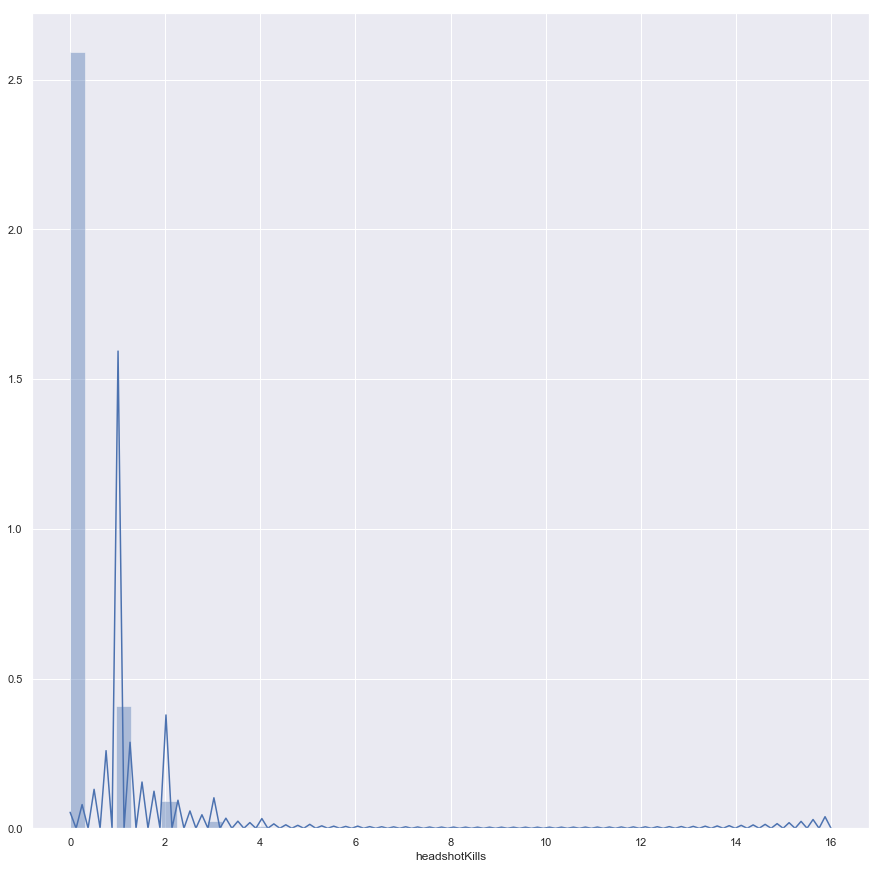

...

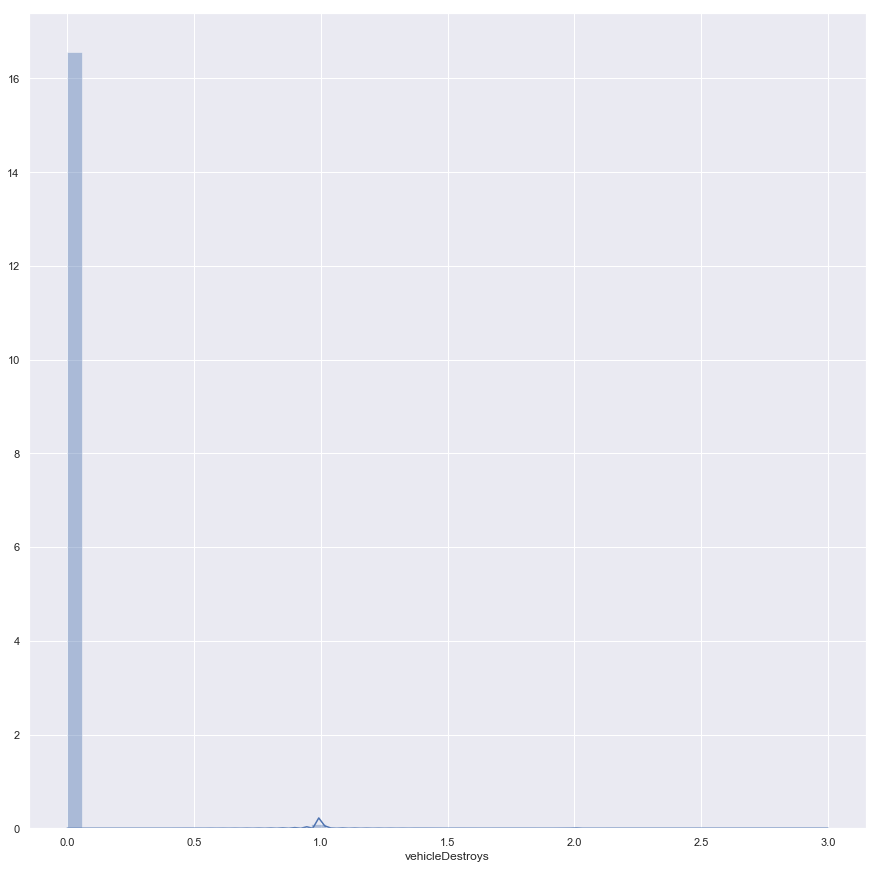

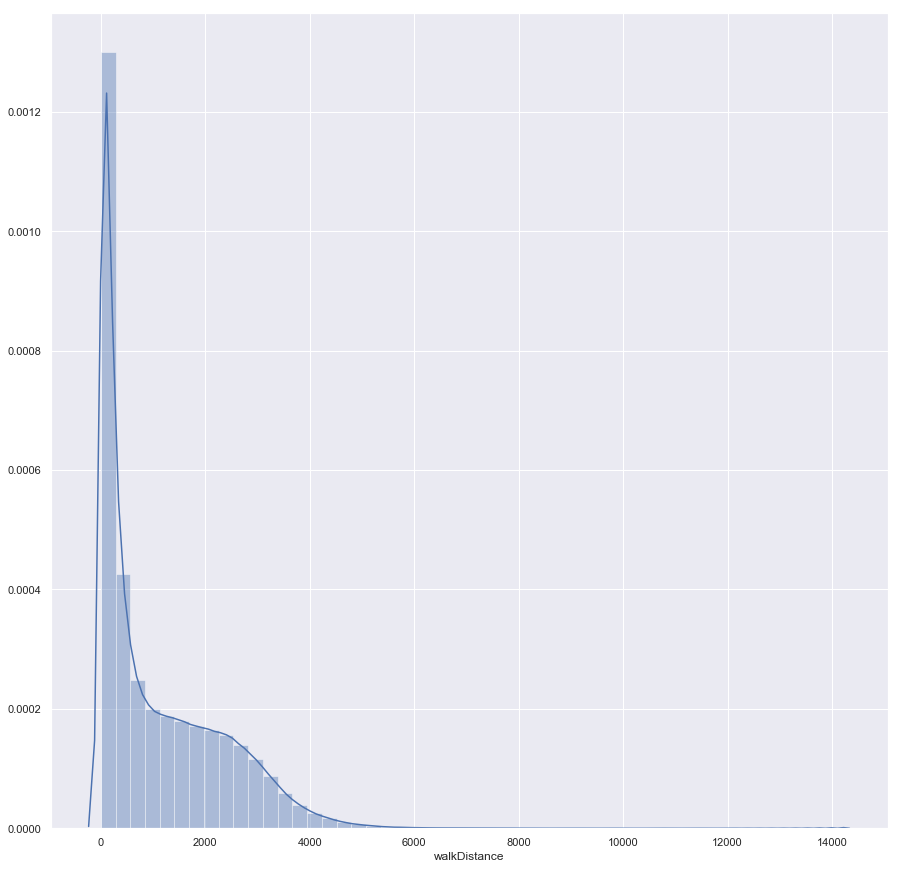

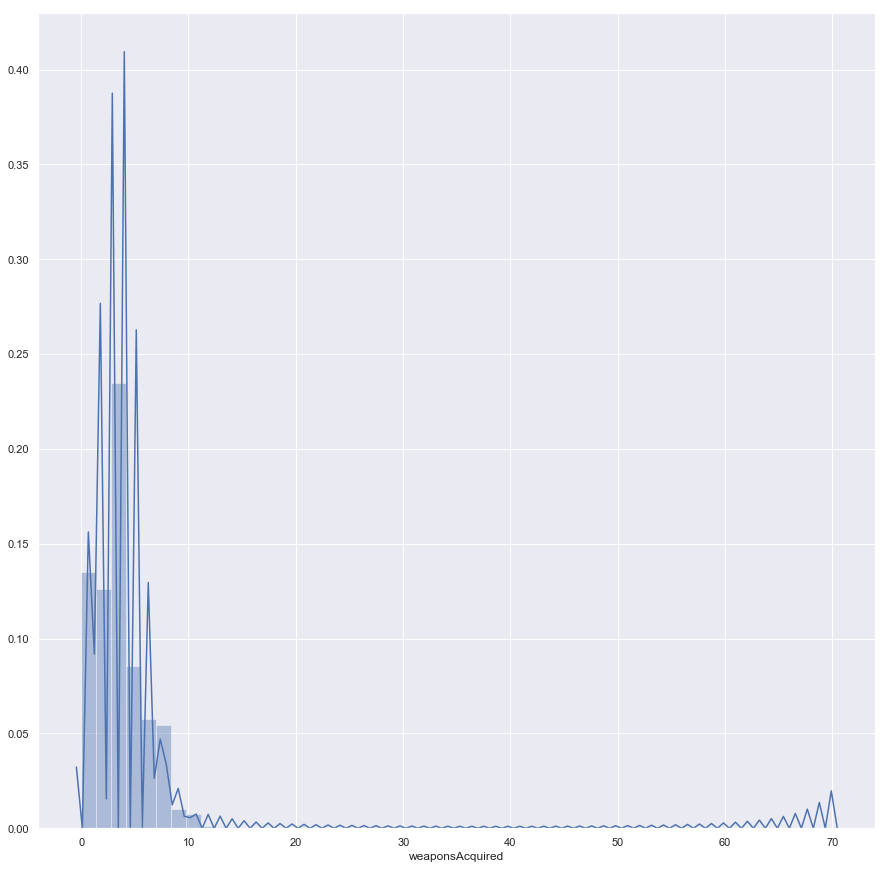

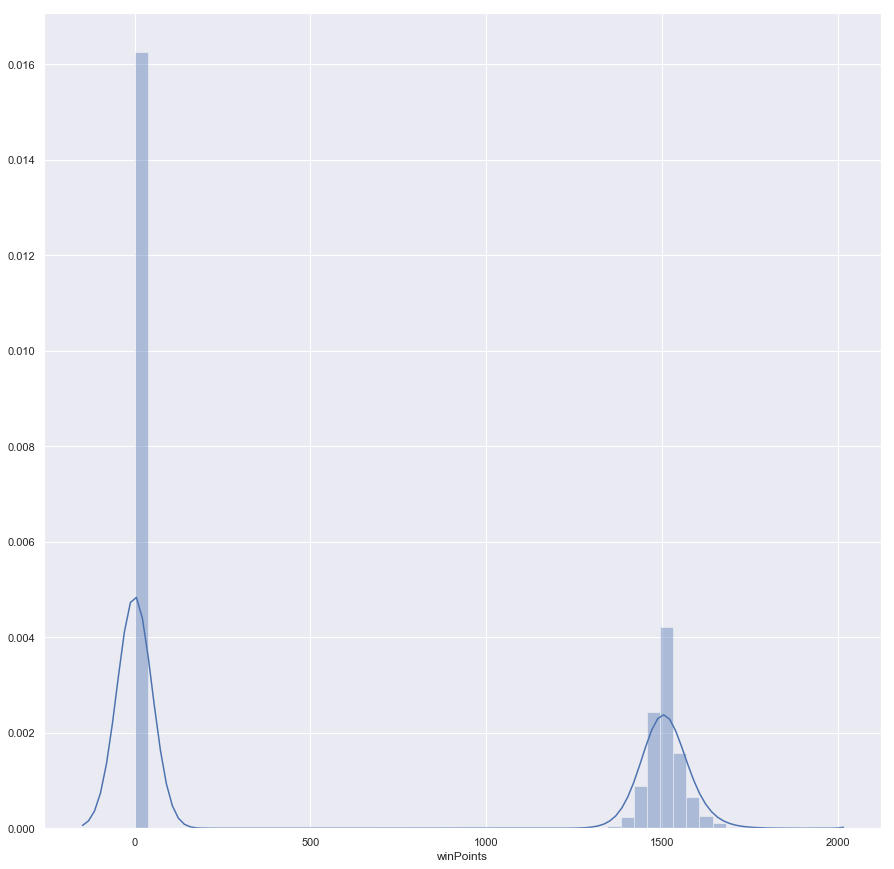

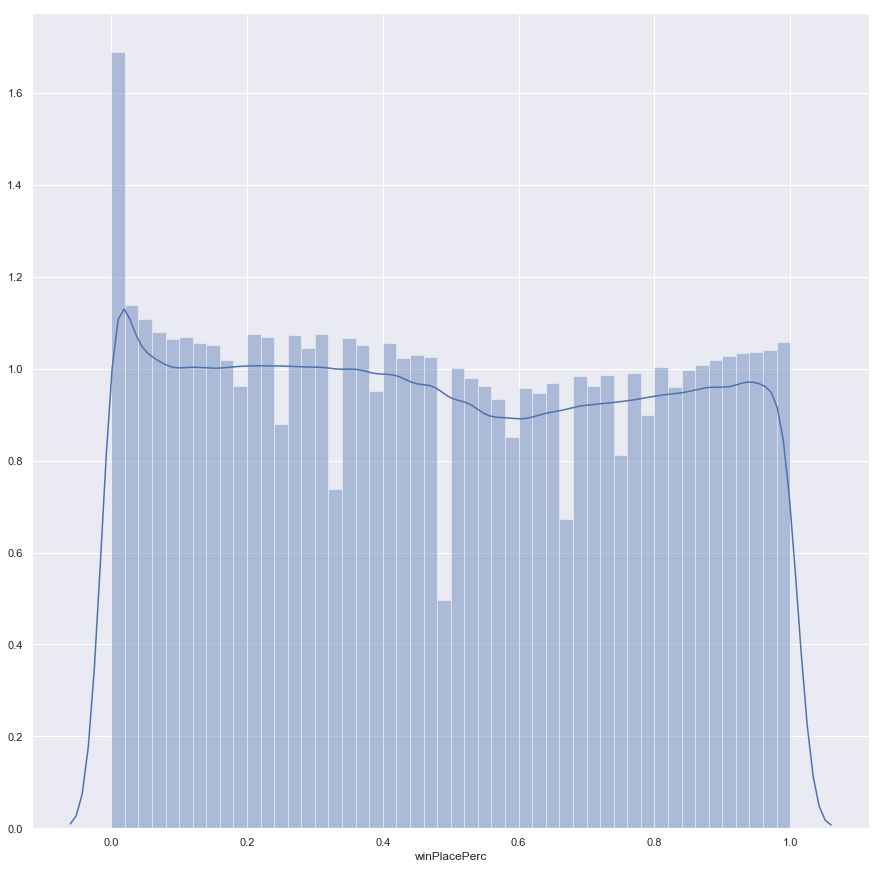

In [352]:
for feature in team_features:
    plt.figure(figsize = (15, 15))
    sns.distplot(duofpp[feature])

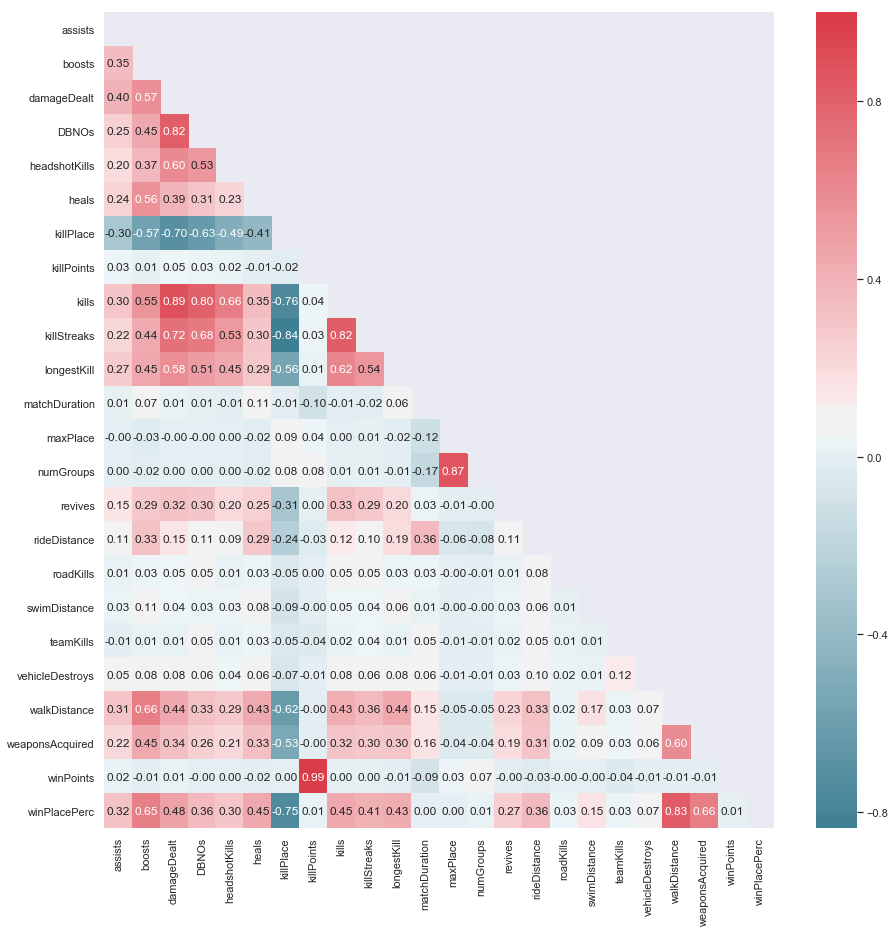

In [353]:
halfHeatMap(duofpp[team_features], mirror = False, corrtype = "pearson")

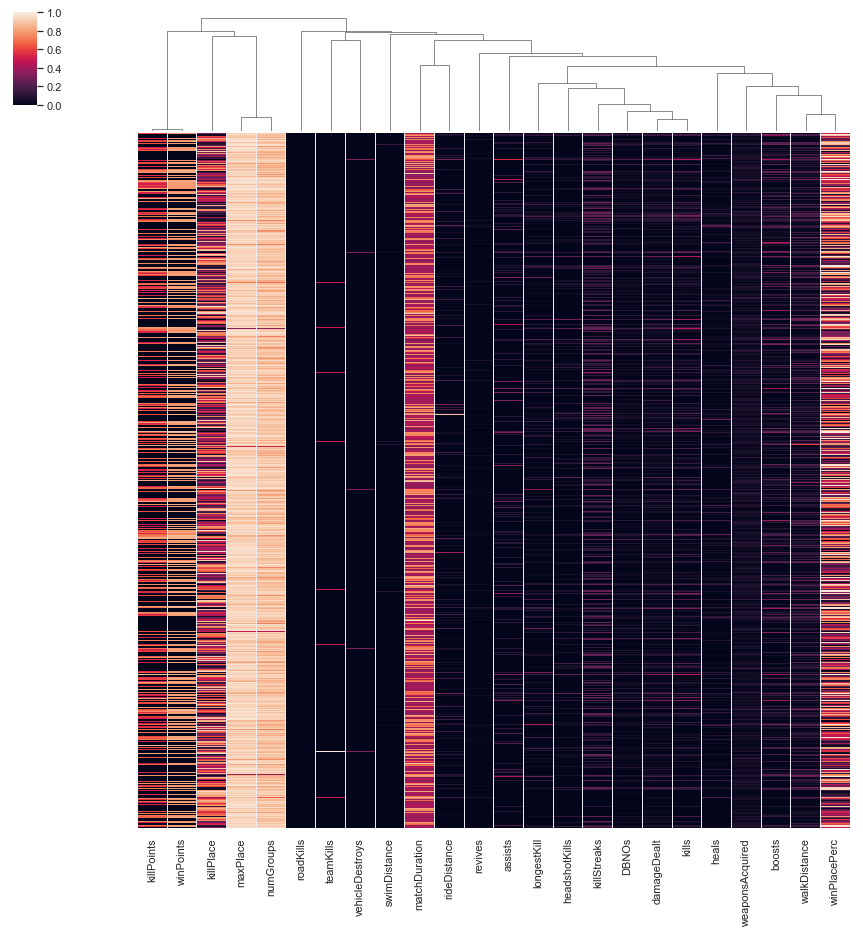

In [354]:
clustermap = sns.clustermap(duofpp[team_features], figsize = (15, 15), 
                            metric = "correlation", row_cluster = False, 
                            standard_scale = 1, yticklabels = [])

### Normal/FPP Mode Comparison

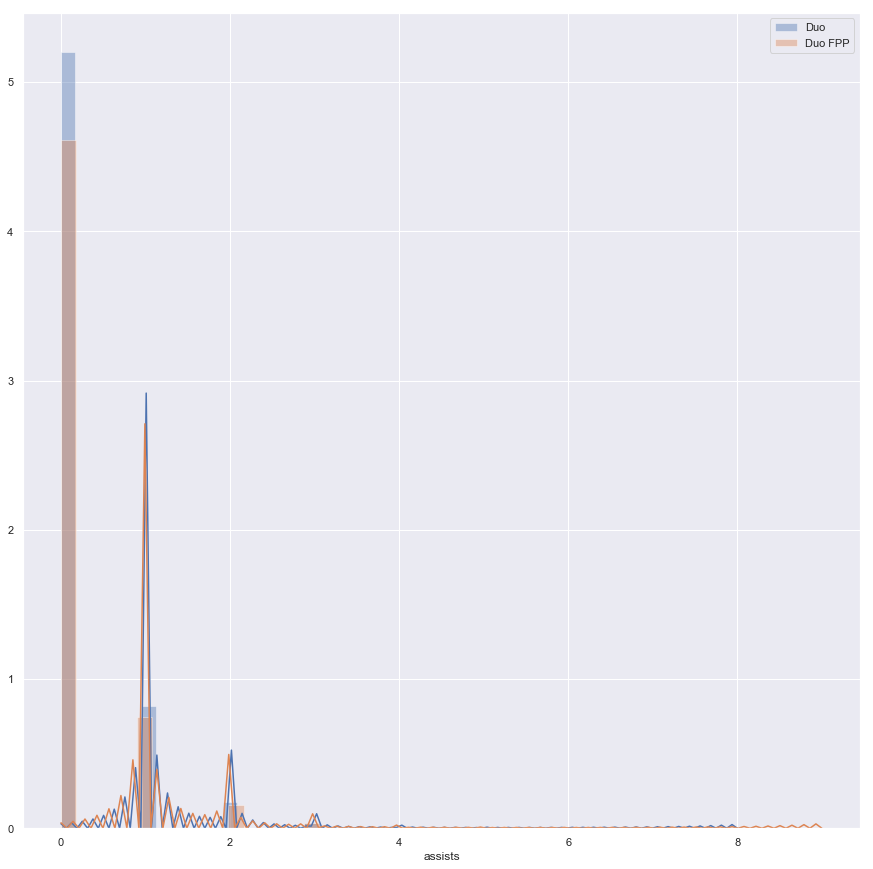

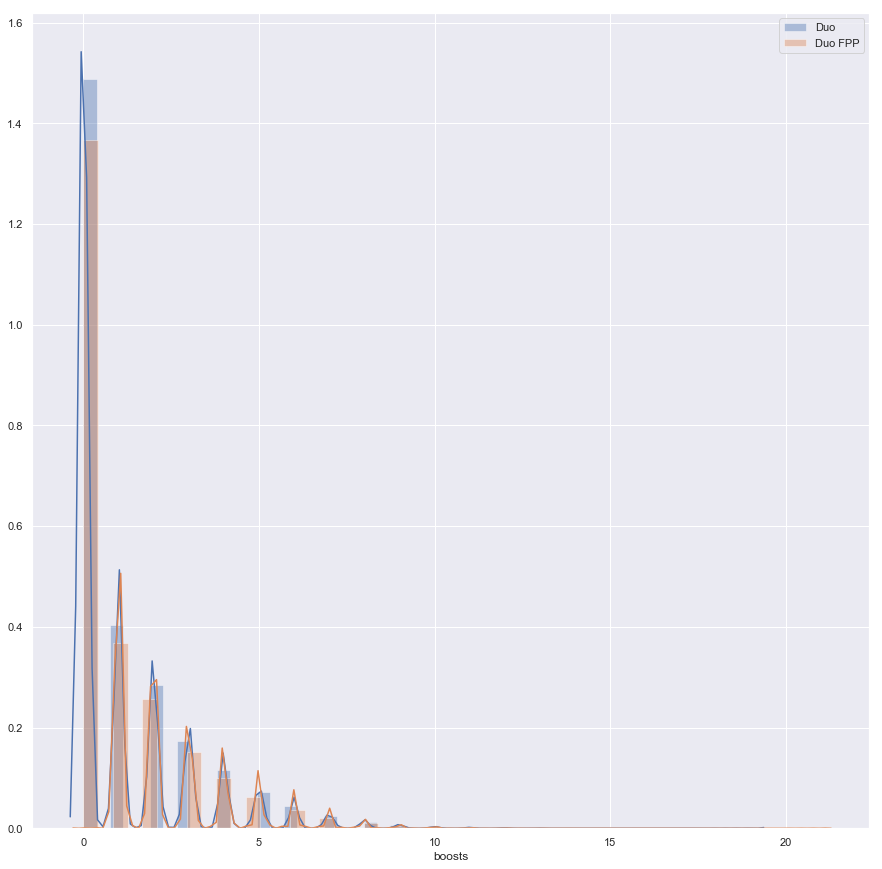

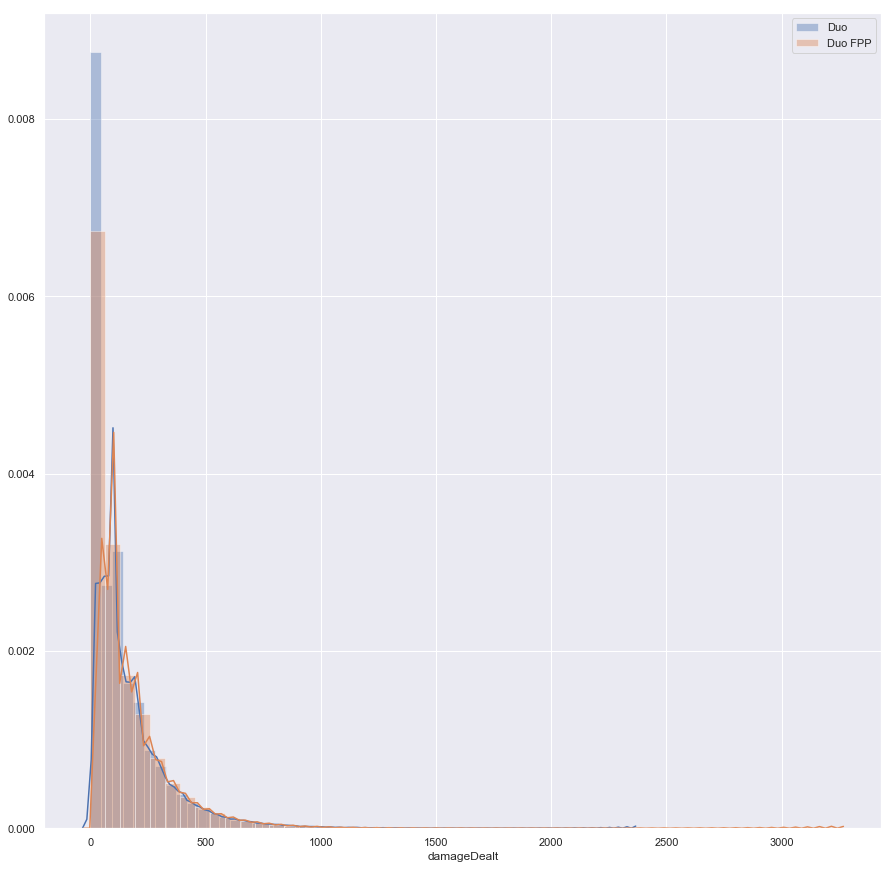

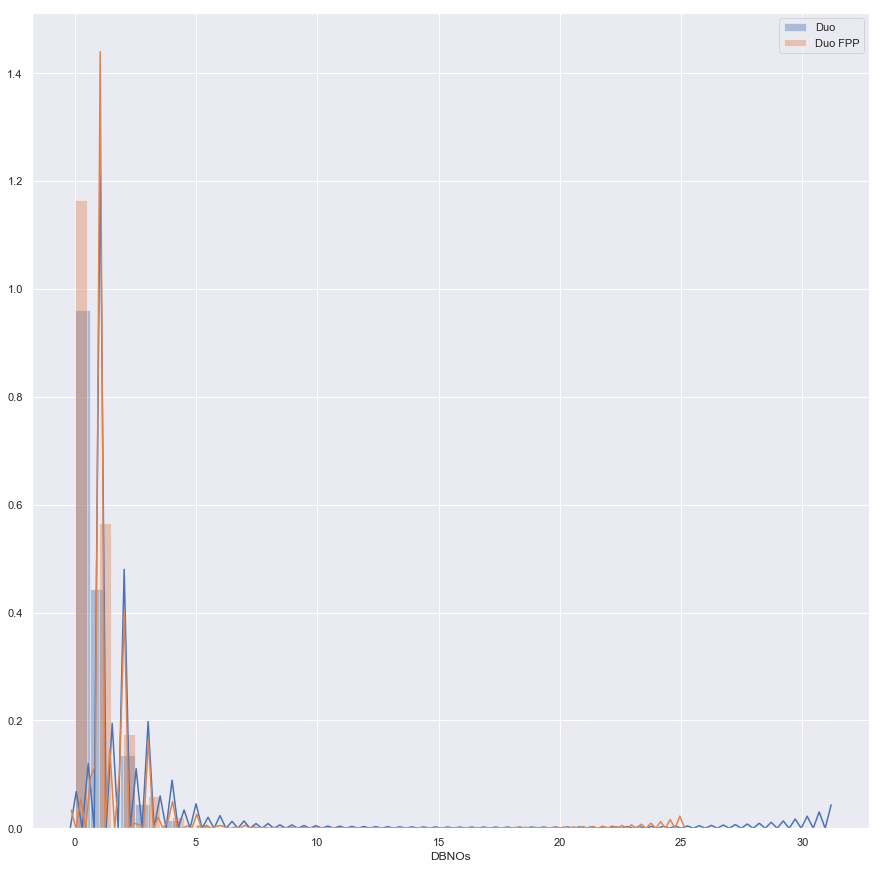

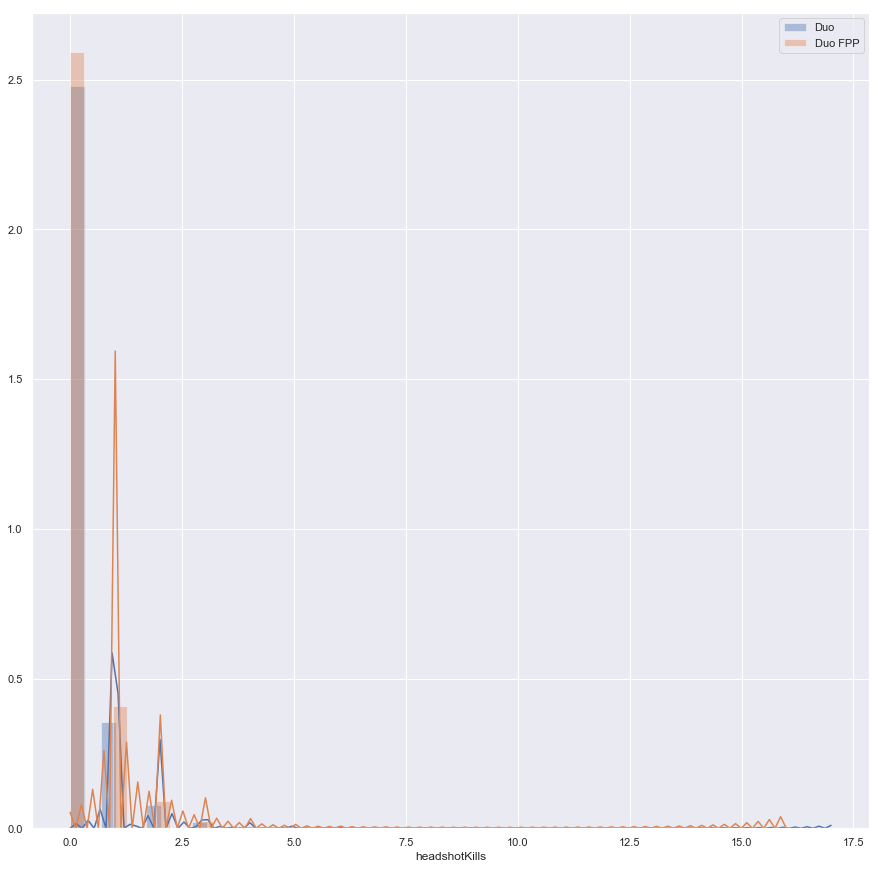

...

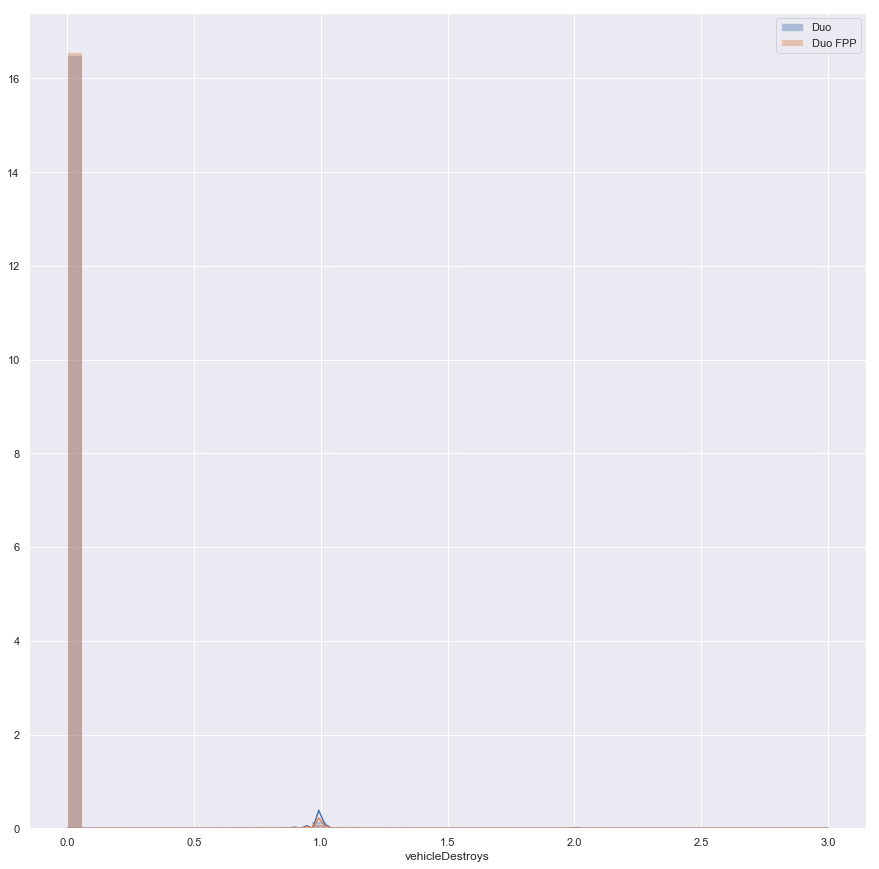

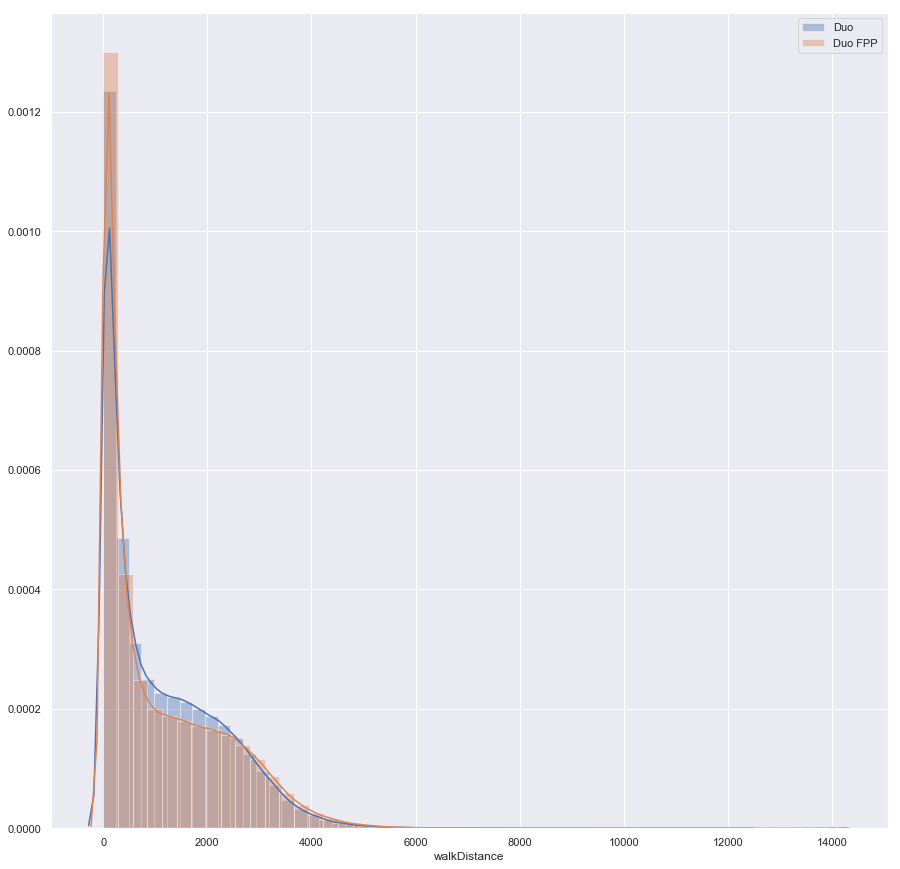

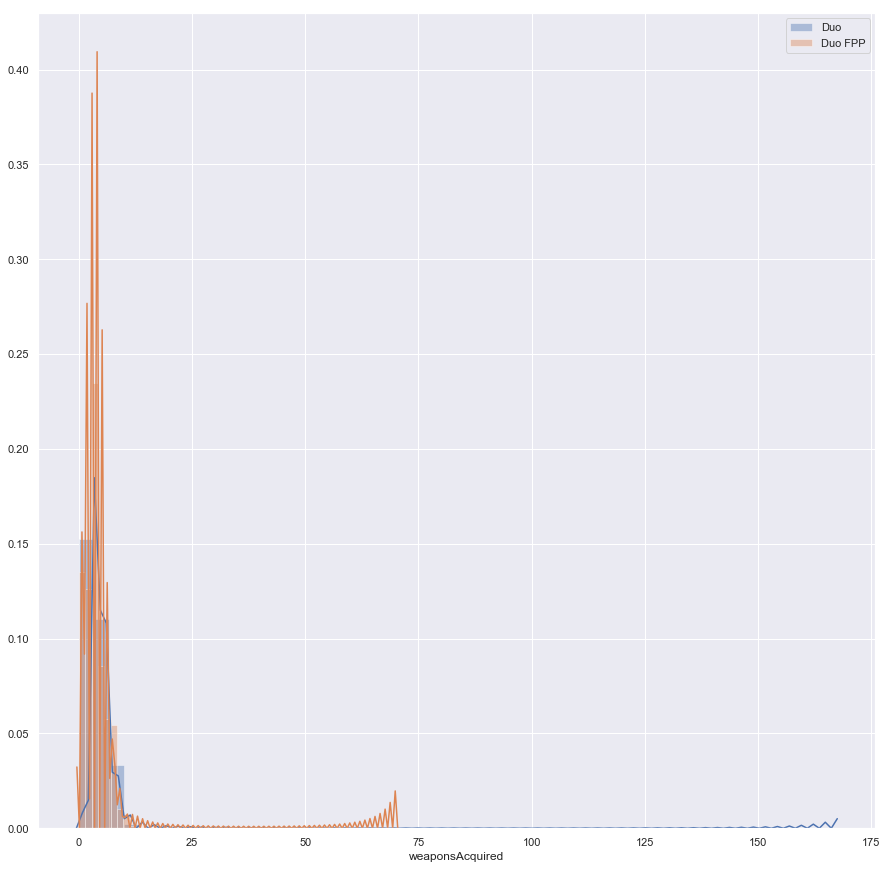

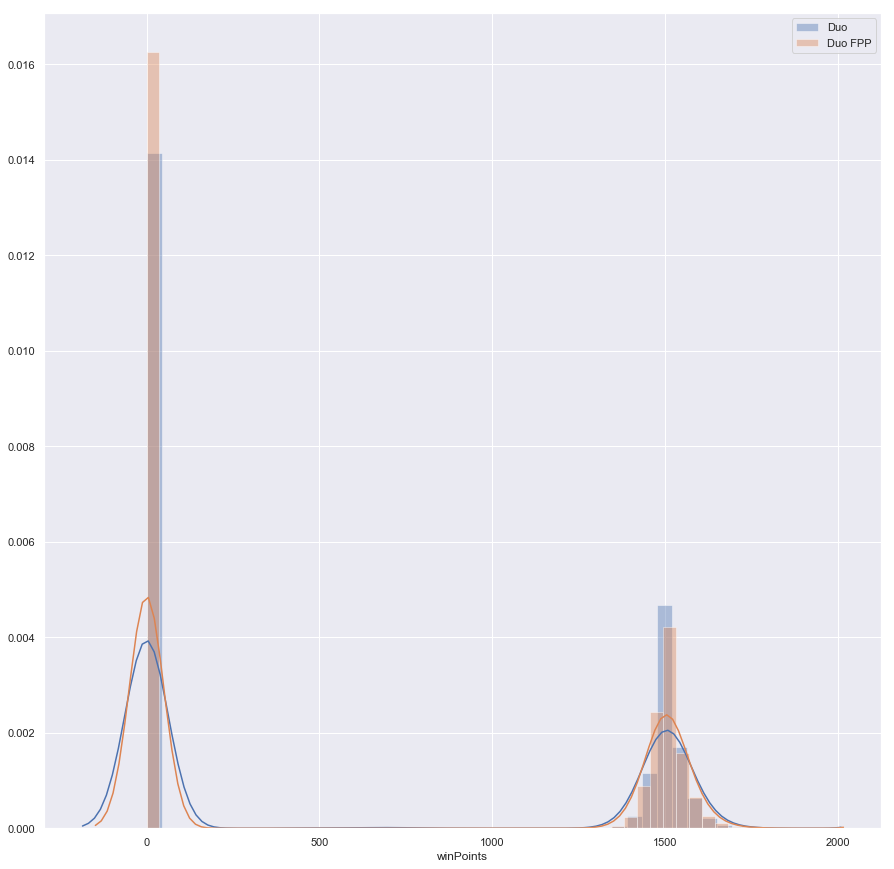

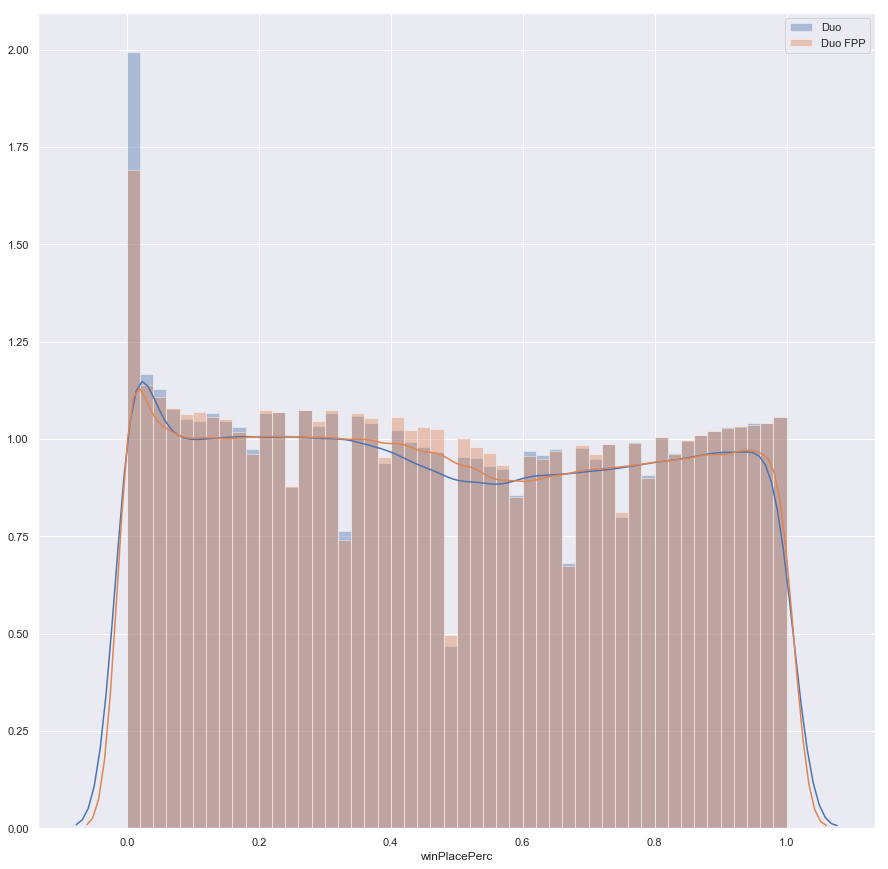

In [355]:
for feature in team_features:
    fig, ax = plt.subplots(figsize = (15, 15))
    sns.distplot(duo[feature], ax = ax, label = "Duo")
    sns.distplot(duofpp[feature], ax = ax, label = "Duo FPP")
    ax.legend()

## Squad Modes

In [356]:
squad = train_dict["squad"].reset_index(drop = True)
squadfpp = train_dict["squad-fpp"].reset_index(drop = True)

### Squad Solo

In [357]:
squad.describe().T

,count,mean,std,min,25%,50%,75%,max
assists,626526.0,0.289891,0.652877,0.0,0.00,0.0000,0.0000,10.0
boosts,626526.0,1.175439,1.746100,0.0,0.00,0.0000,2.0000,20.0
damageDealt,626526.0,127.600206,170.720937,0.0,0.00,79.3550,180.8000,3796.0
DBNOs,626526.0,0.854052,1.321197,0.0,0.00,0.0000,1.0000,32.0
headshotKills,626526.0,0.212073,0.604463,0.0,0.00,0.0000,0.0000,26.0
heals,626526.0,1.508456,2.842145,0.0,0.00,0.0000,2.0000,80.0
killPlace,626526.0,47.690383,27.360136,1.0,24.00,48.0000,71.0000,100.0
killPoints,626526.0,496.643399,615.358404,0.0,0.00,0.0000,1152.0000,2075.0
kills,626526.0,0.891428,1.515365,0.0,0.00,0.0000,1.0000,33.0
killStreaks,626526.0,0.533049,0.723612,0.0,0.00,0.0000,1.0000,10.0


In [358]:
squad.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 626526 entries, 0 to 626525
Data columns (total 28 columns):
Id                 626526 non-null object
groupId            626526 non-null object
matchId            626526 non-null object
assists            626526 non-null int64
boosts             626526 non-null int64
damageDealt        626526 non-null float64
DBNOs              626526 non-null int64
headshotKills      626526 non-null int64
heals              626526 non-null int64
killPlace          626526 non-null int64
killPoints         626526 non-null int64
kills              626526 non-null int64
killStreaks        626526 non-null int64
longestKill        626526 non-null float64
matchDuration      626526 non-null int64
matchType          626526 non-null object
maxPlace           626526 non-null int64
numGroups          626526 non-null int64
revives            626526 non-null int64
rideDistance       626526 non-null float64
roadKills          626526 non-null int64
swimDistance      

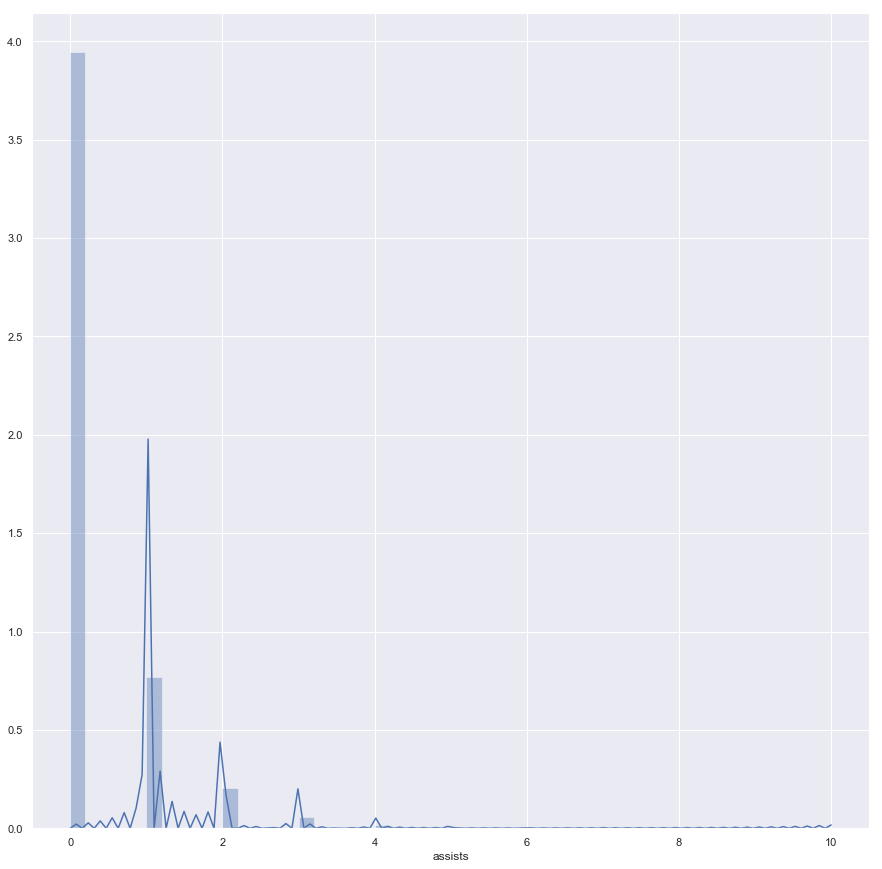

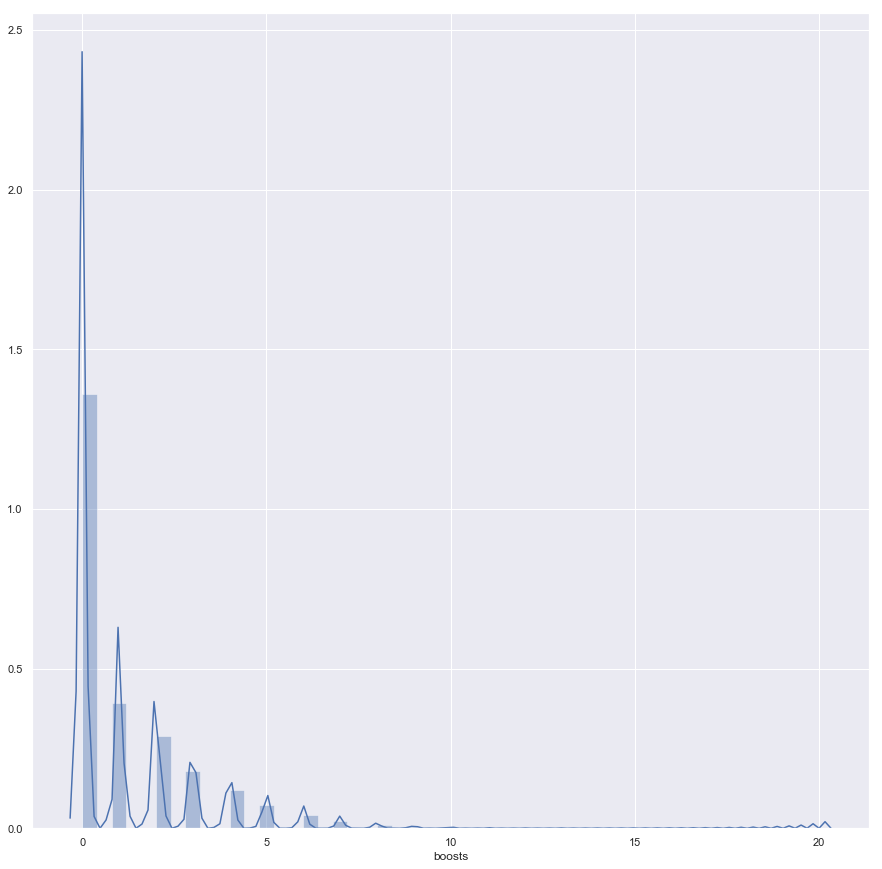

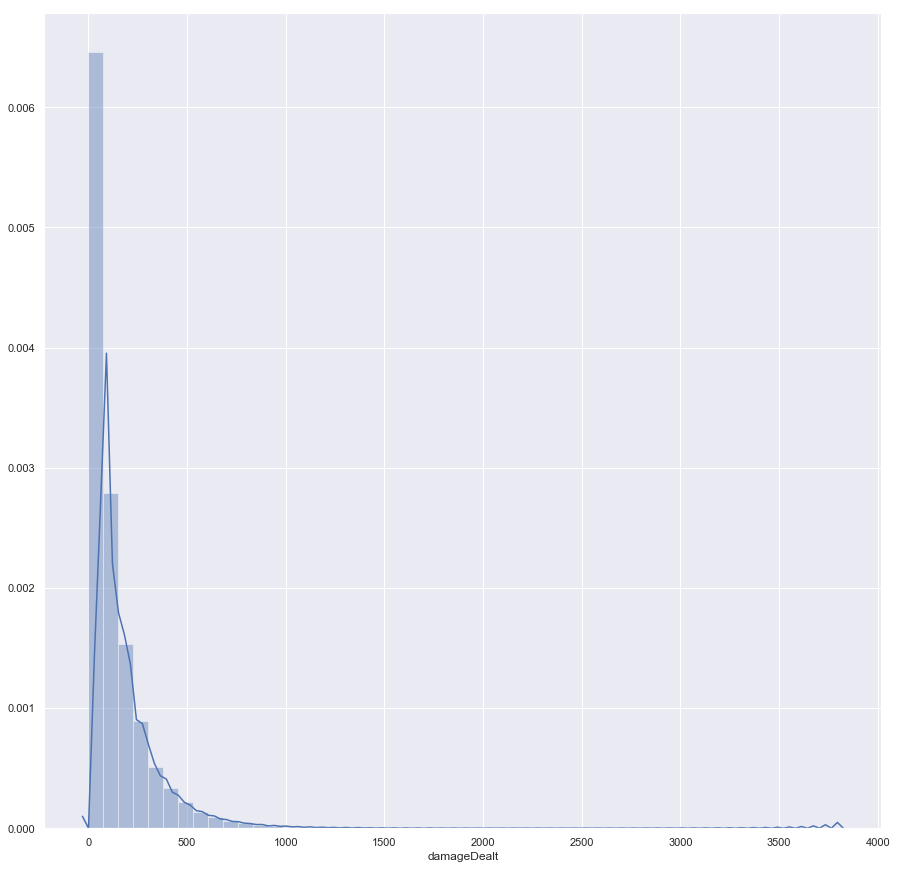

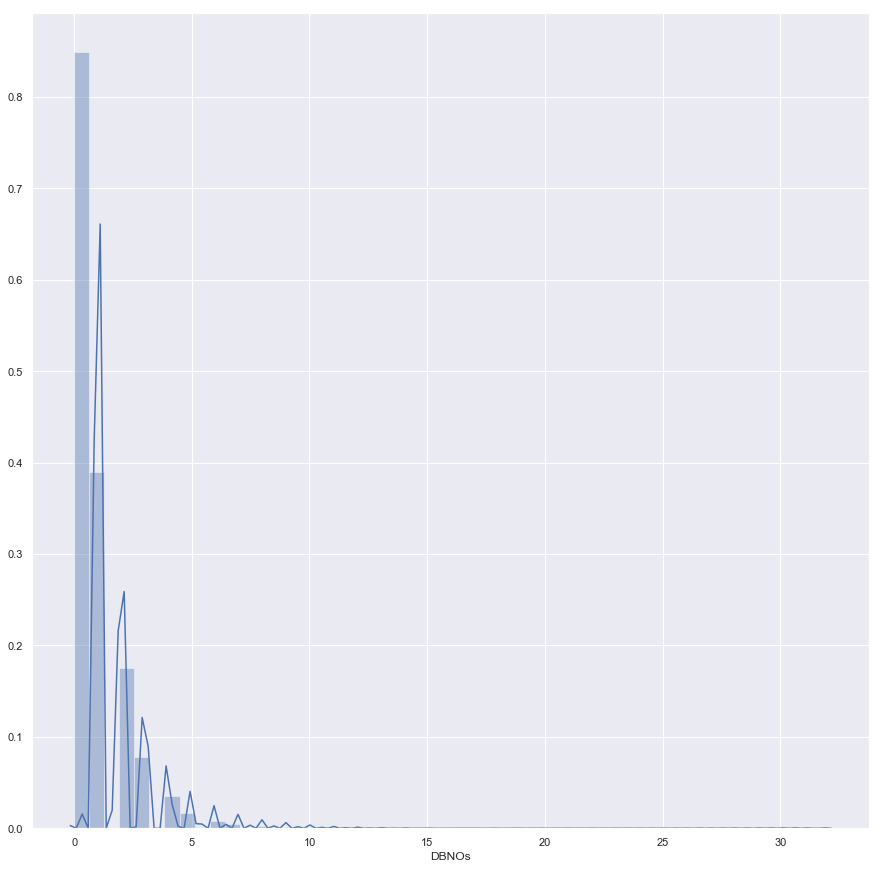

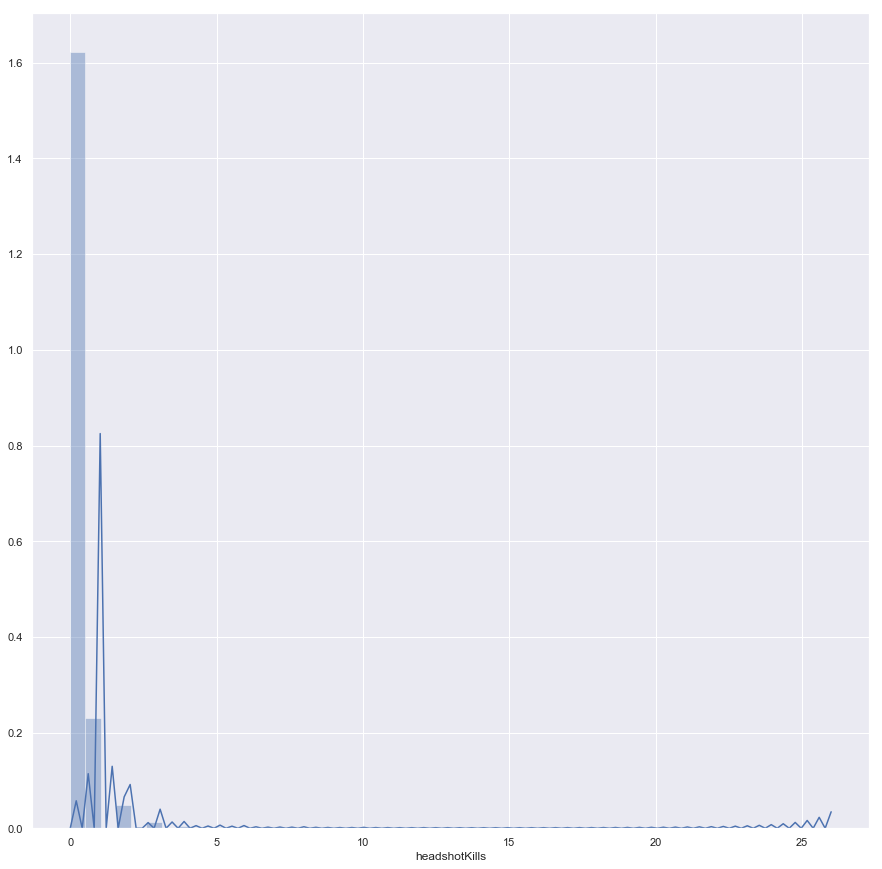

...

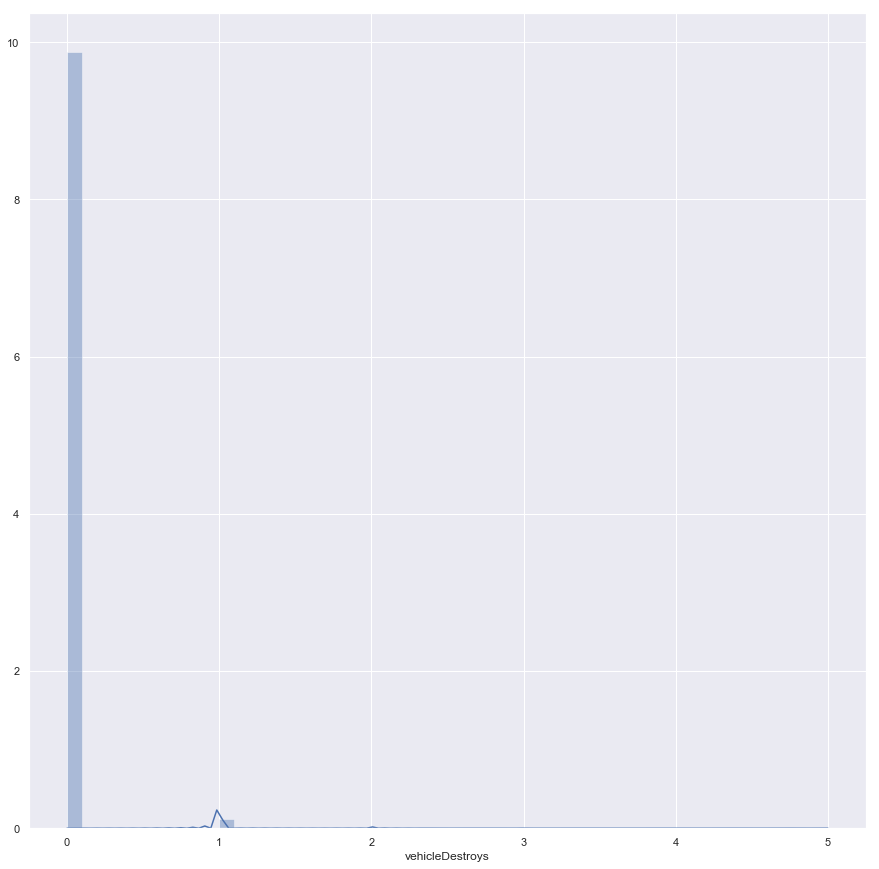

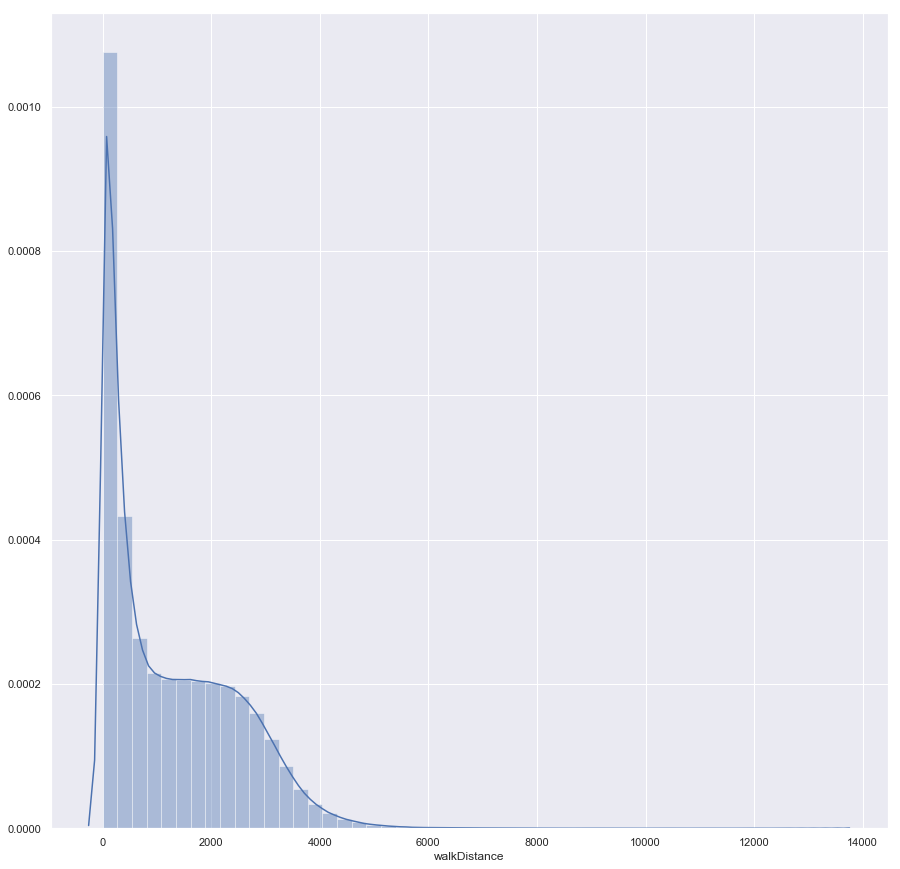

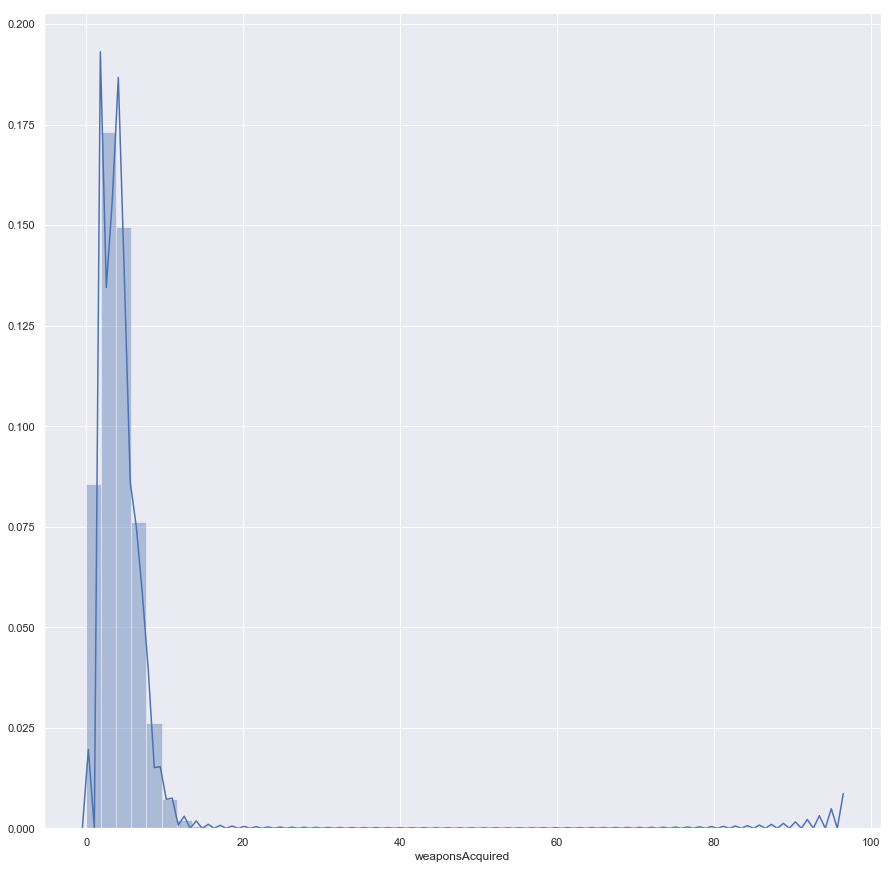

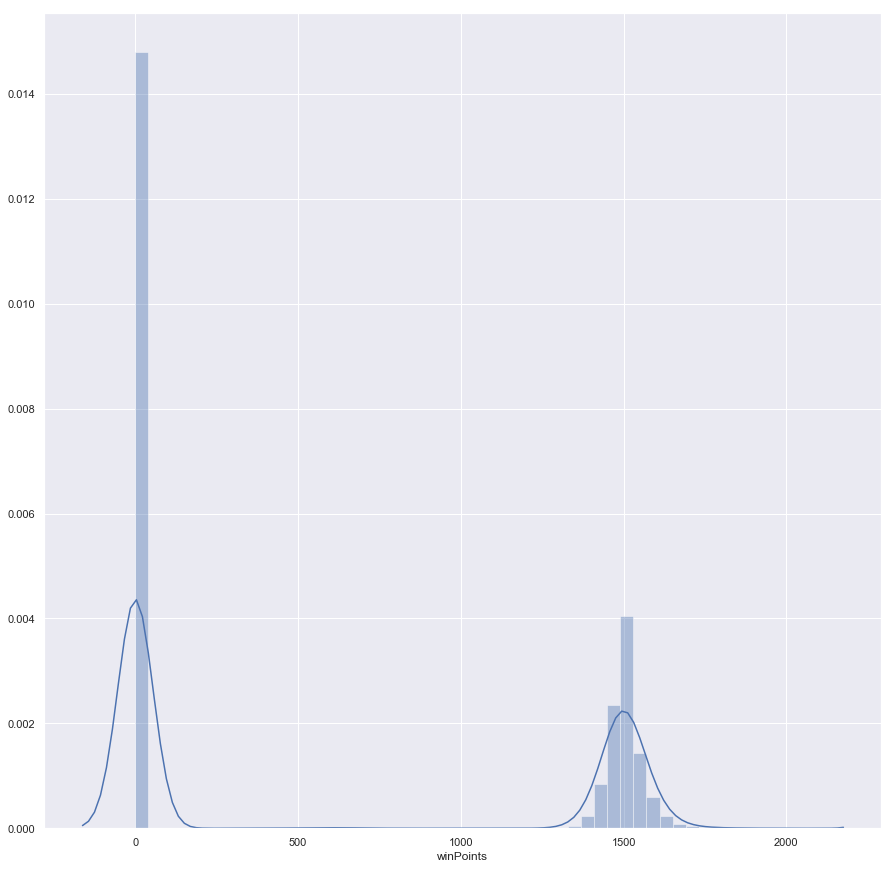

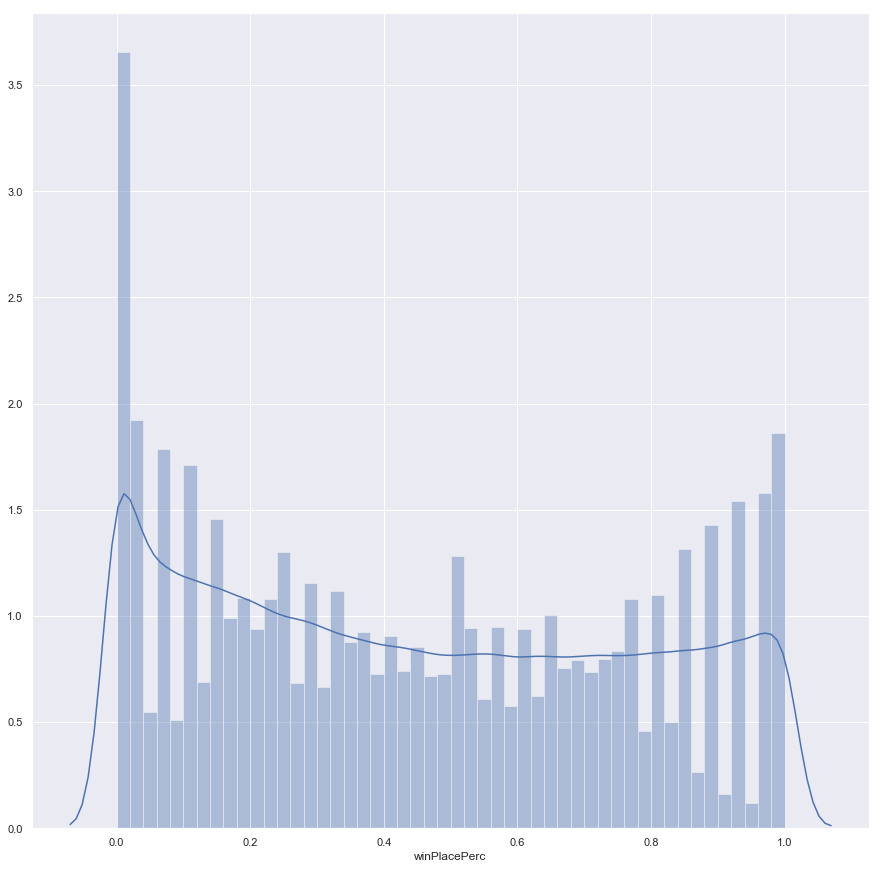

In [359]:
for feature in team_features:
    plt.figure(figsize = (15, 15))
    sns.distplot(squad[feature])

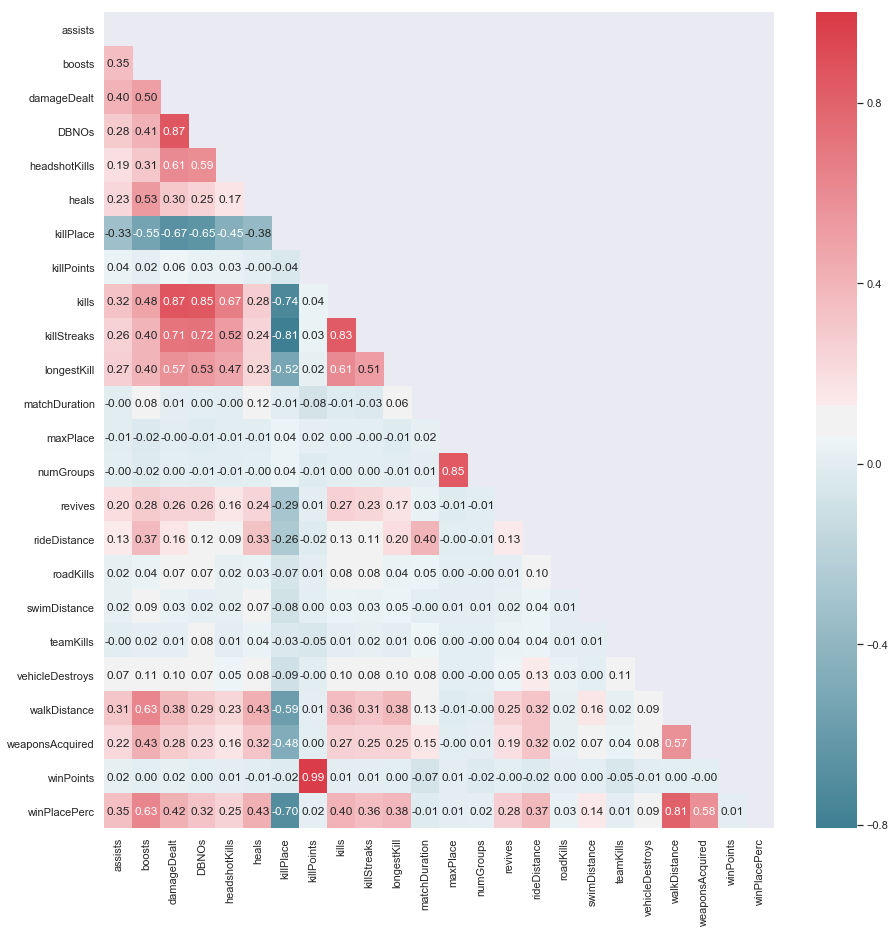

In [360]:
halfHeatMap(squad[team_features], mirror = False, corrtype = "pearson")

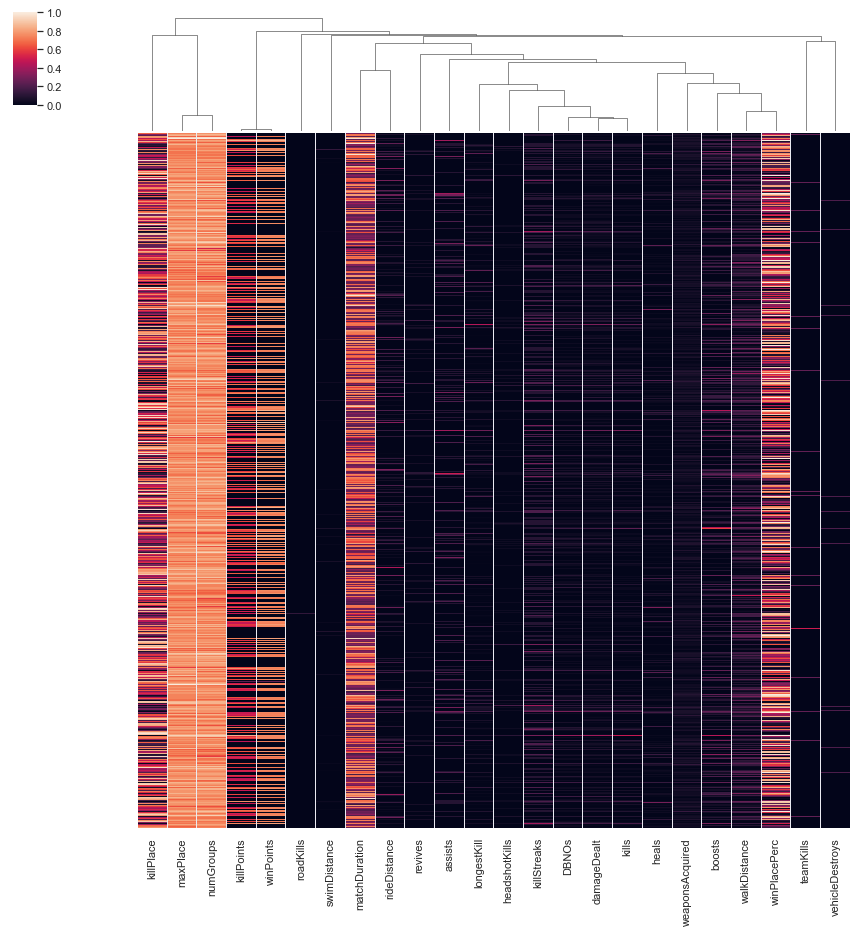

In [361]:
clustermap = sns.clustermap(squad[team_features], figsize = (15, 15), 
                            metric = "correlation", row_cluster = False, 
                            standard_scale = 1, yticklabels = [])

### Squad FPP Mode

In [362]:
squadfpp.describe().T

,count,mean,std,min,25%,50%,75%,max
assists,1756186.0,0.287245,0.639925,0.0,0.0000,0.0000,0.0000,12.0
boosts,1756186.0,1.107993,1.666273,0.0,0.0000,0.0000,2.0000,33.0
damageDealt,1756186.0,133.587592,165.785758,0.0,0.0000,89.0800,191.3000,3387.0
DBNOs,1756186.0,0.872816,1.278017,0.0,0.0000,0.0000,1.0000,26.0
headshotKills,1756186.0,0.220646,0.564464,0.0,0.0000,0.0000,0.0000,21.0
heals,1756186.0,1.476785,2.749316,0.0,0.0000,0.0000,2.0000,73.0
killPlace,1756186.0,47.921326,27.495355,1.0,24.0000,48.0000,72.0000,100.0
killPoints,1756186.0,556.643272,659.414096,0.0,0.0000,0.0000,1257.0000,2170.0
kills,1756186.0,0.908386,1.487611,0.0,0.0000,0.0000,1.0000,26.0
killStreaks,1756186.0,0.558404,0.740497,0.0,0.0000,0.0000,1.0000,8.0


In [363]:
squadfpp.info(null_counts= True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1756186 entries, 0 to 1756185
Data columns (total 28 columns):
Id                 1756186 non-null object
groupId            1756186 non-null object
matchId            1756186 non-null object
assists            1756186 non-null int64
boosts             1756186 non-null int64
damageDealt        1756186 non-null float64
DBNOs              1756186 non-null int64
headshotKills      1756186 non-null int64
heals              1756186 non-null int64
killPlace          1756186 non-null int64
killPoints         1756186 non-null int64
kills              1756186 non-null int64
killStreaks        1756186 non-null int64
longestKill        1756186 non-null float64
matchDuration      1756186 non-null int64
matchType          1756186 non-null object
maxPlace           1756186 non-null int64
numGroups          1756186 non-null int64
revives            1756186 non-null int64
rideDistance       1756186 non-null float64
roadKills          1756186 non-null i

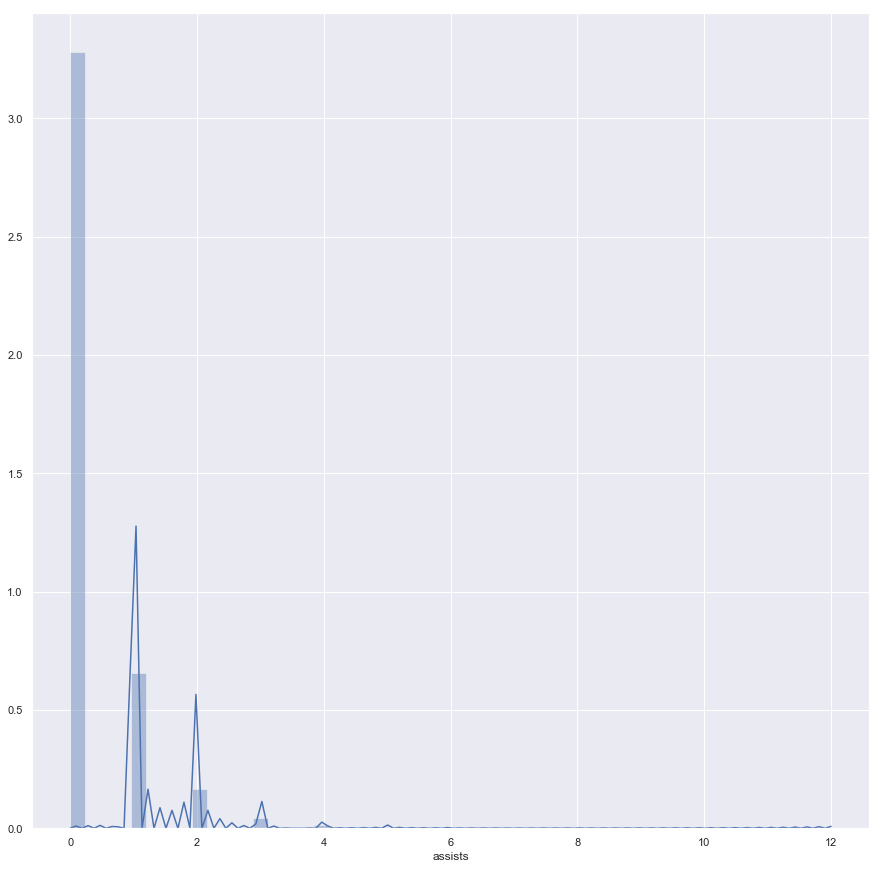

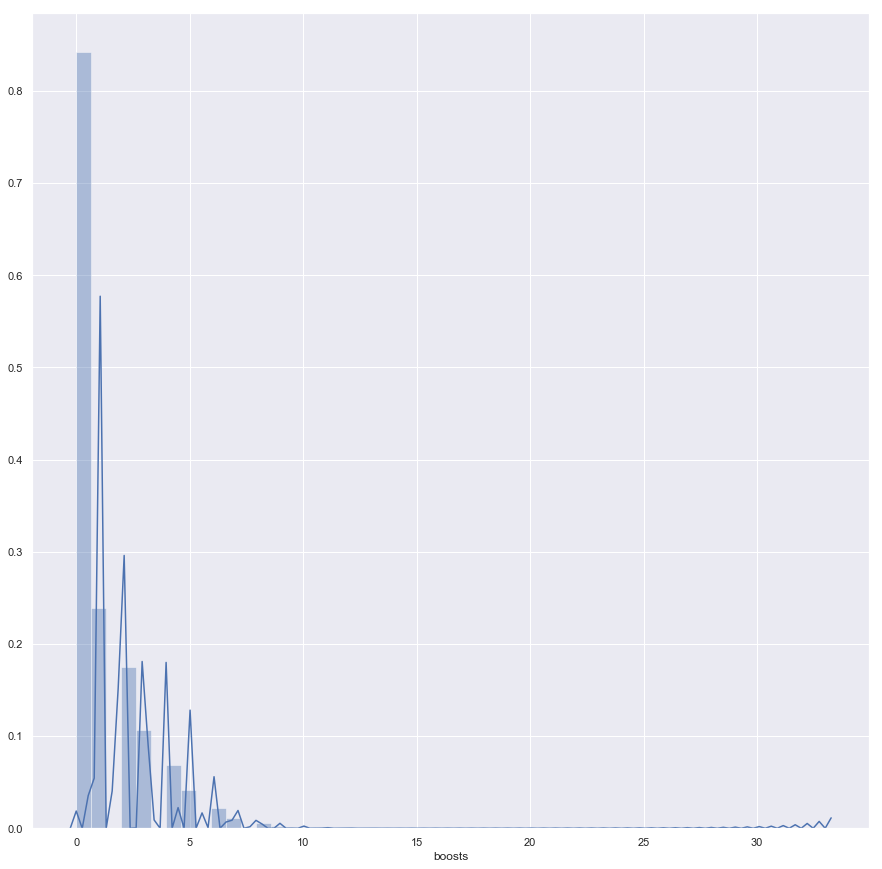

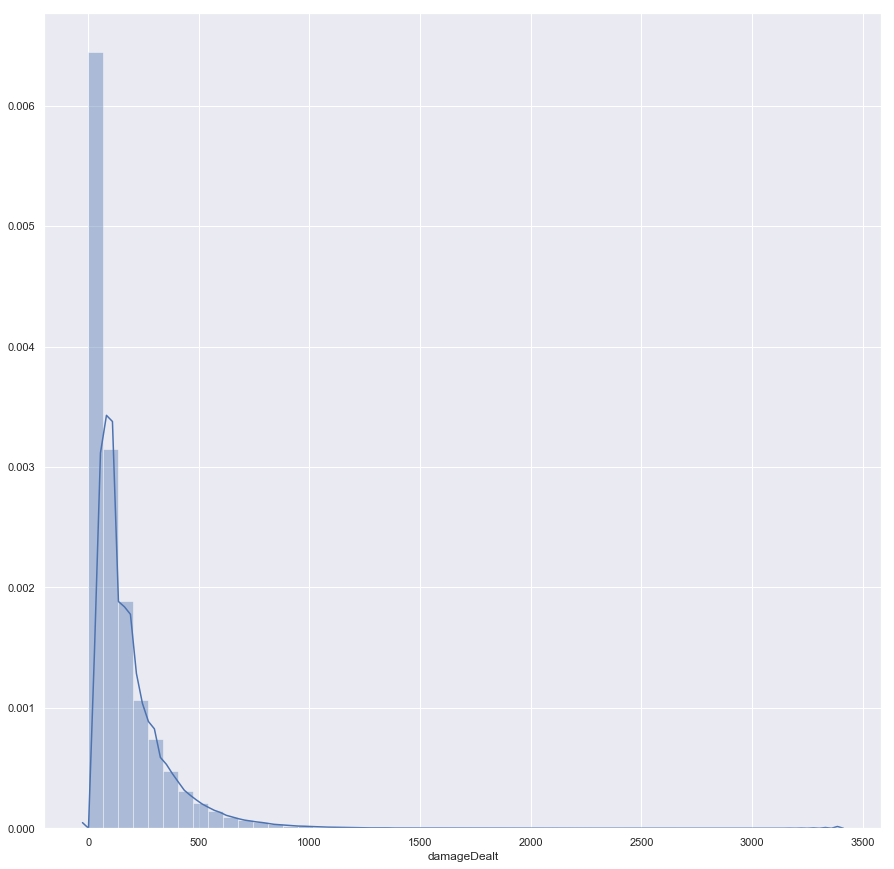

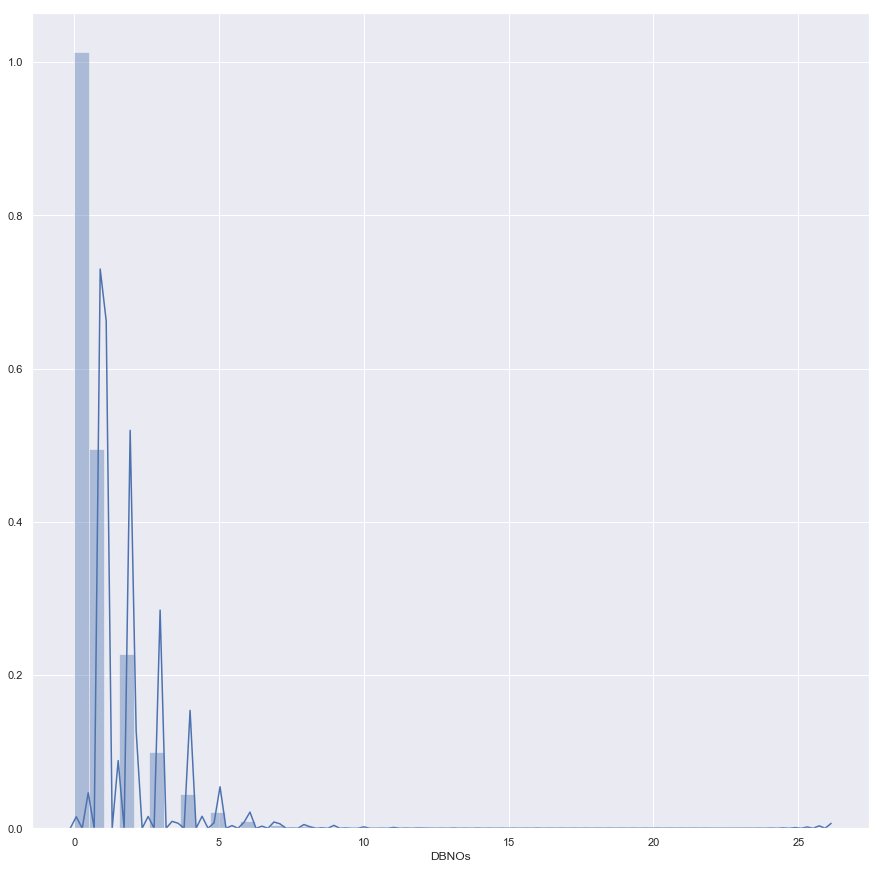

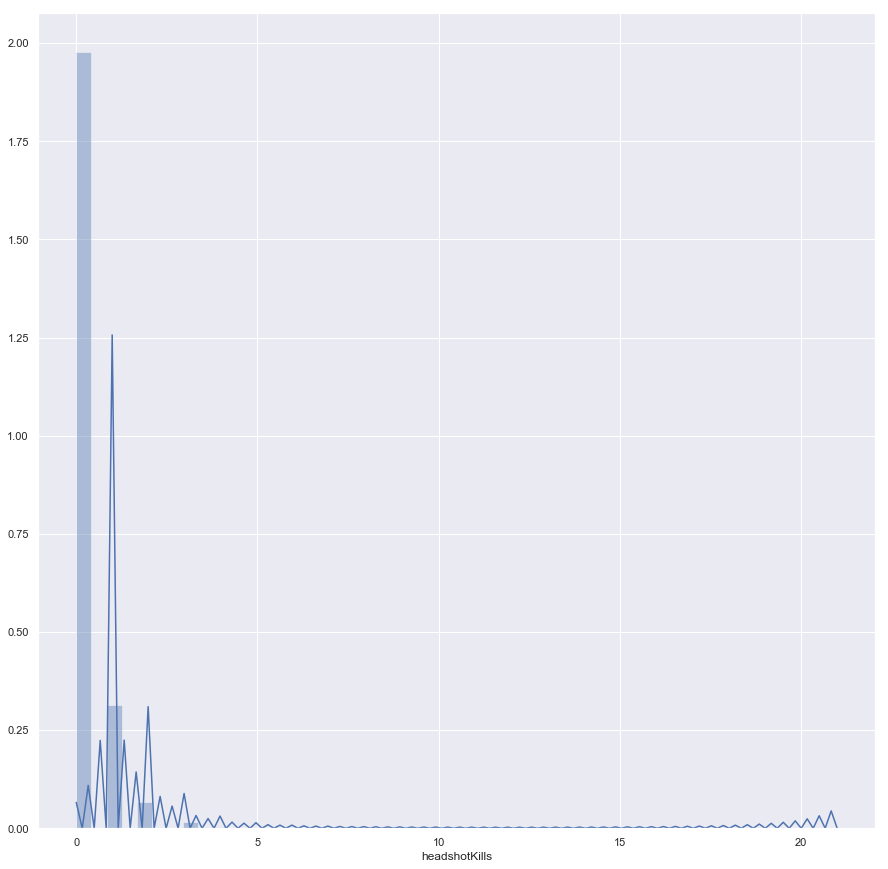

...

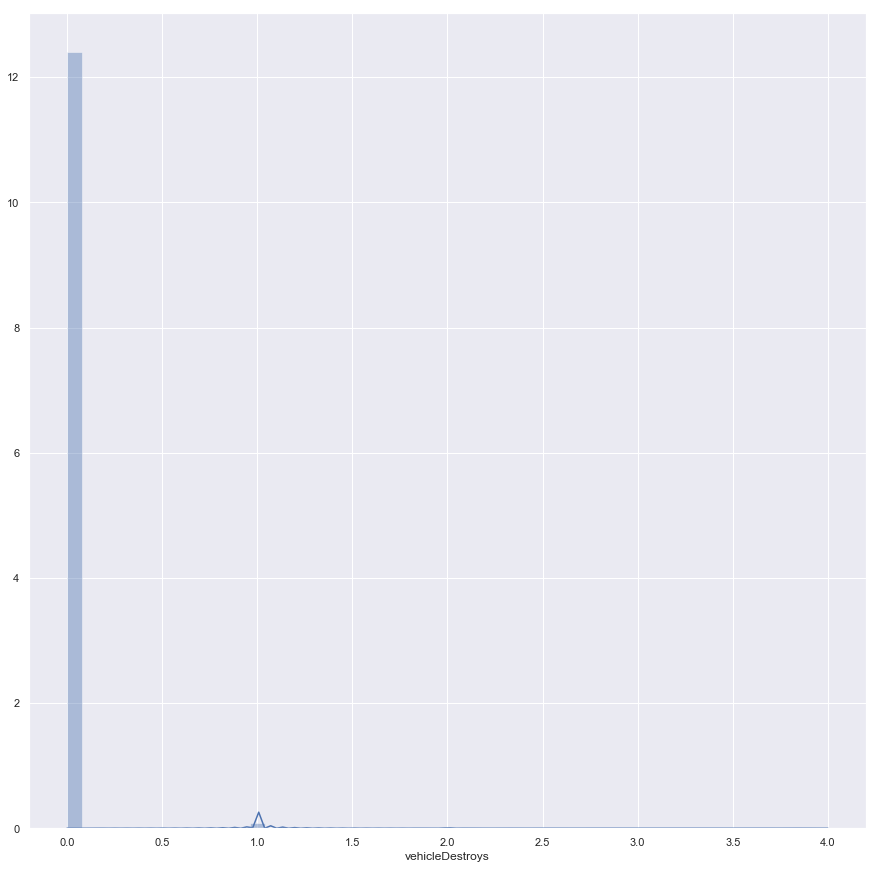

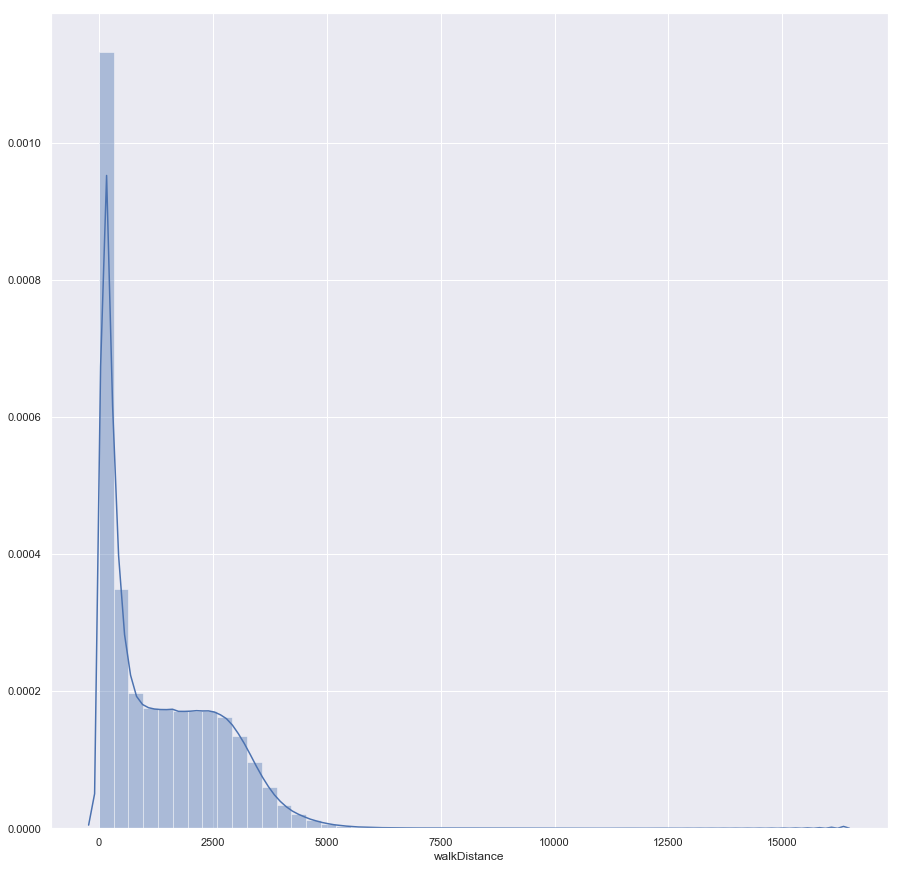

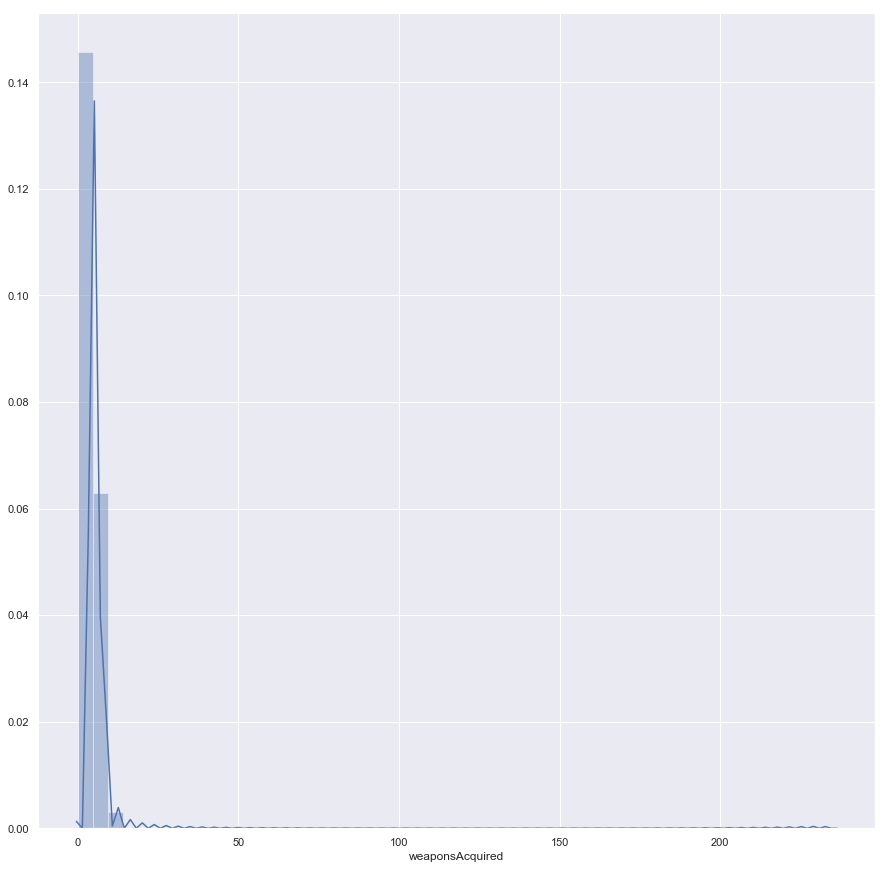

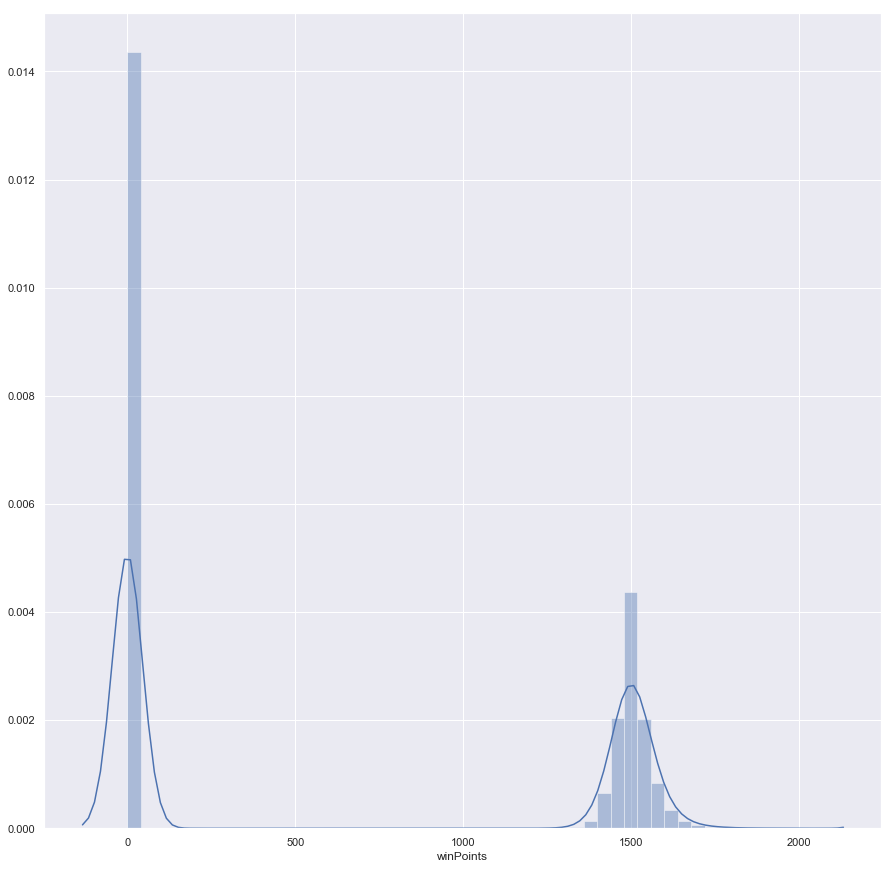

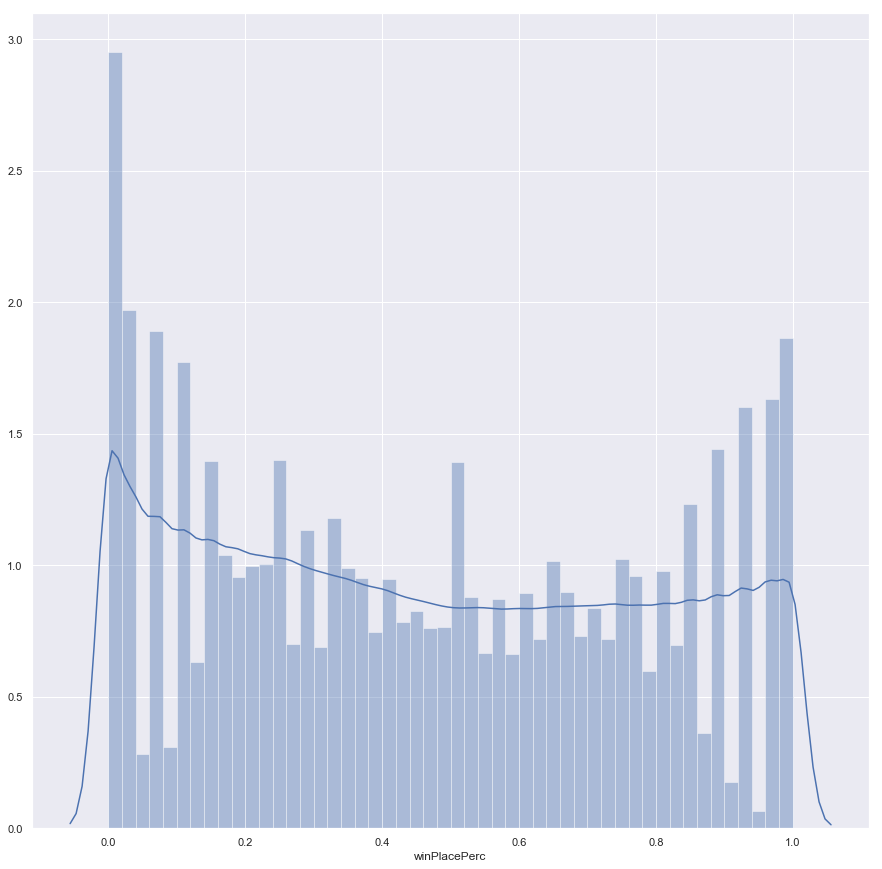

In [364]:
for feature in team_features:
    plt.figure(figsize = (15, 15))
    sns.distplot(squadfpp[feature])

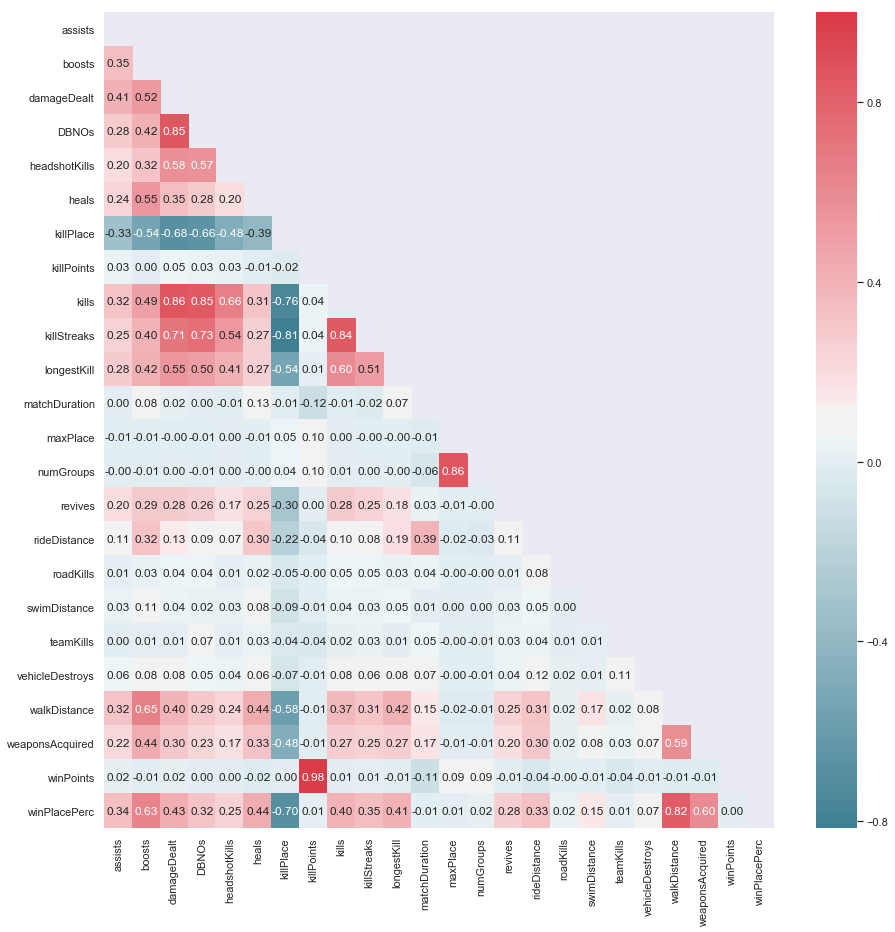

In [365]:
halfHeatMap(squadfpp[team_features], mirror = False, corrtype = "pearson")

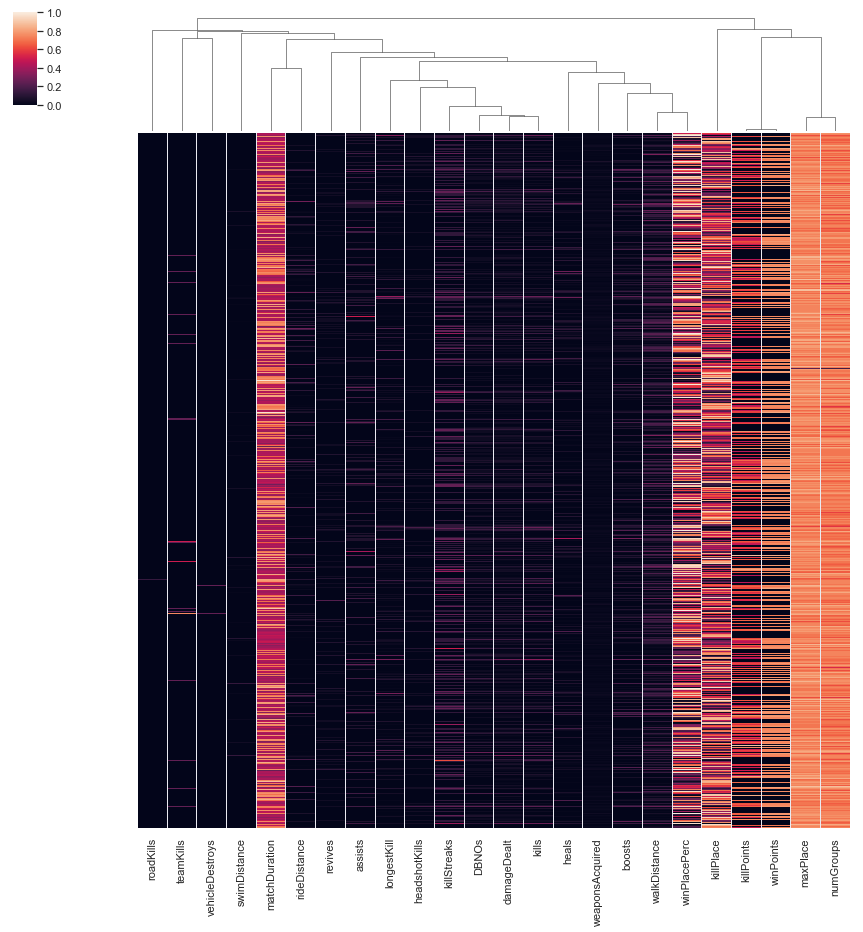

In [366]:
clustermap = sns.clustermap(squadfpp[team_features], figsize = (15, 15), 
                            metric = "correlation", row_cluster = False, 
                            standard_scale = 1, yticklabels = [])

### Normal/FPP Mode Comparison

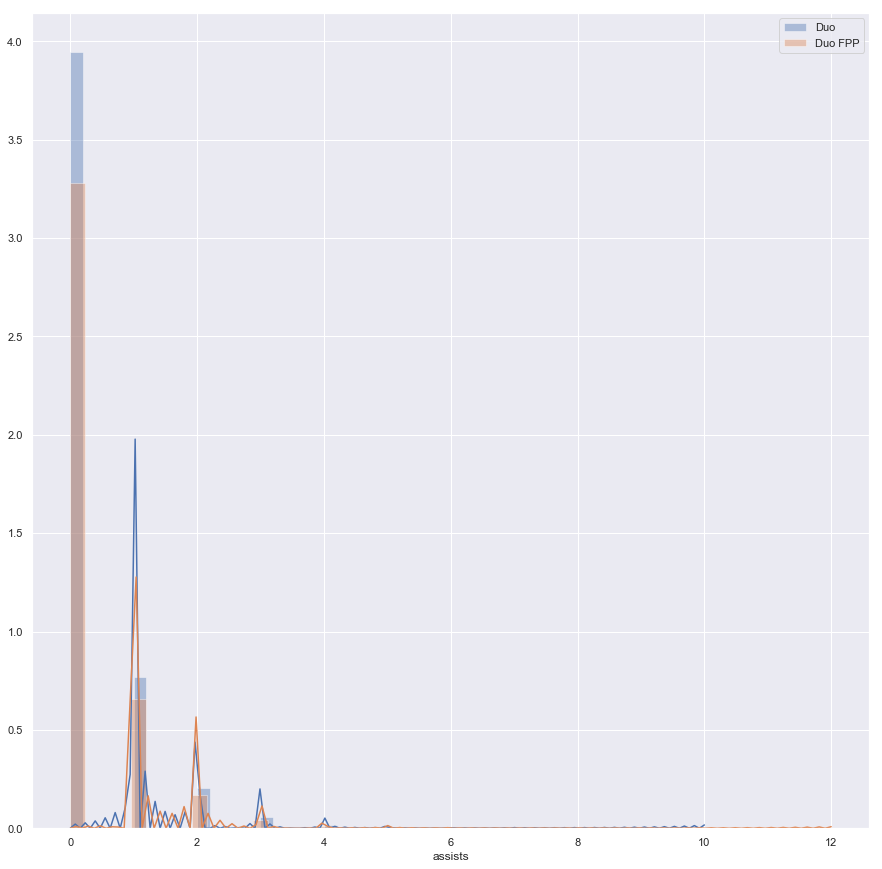

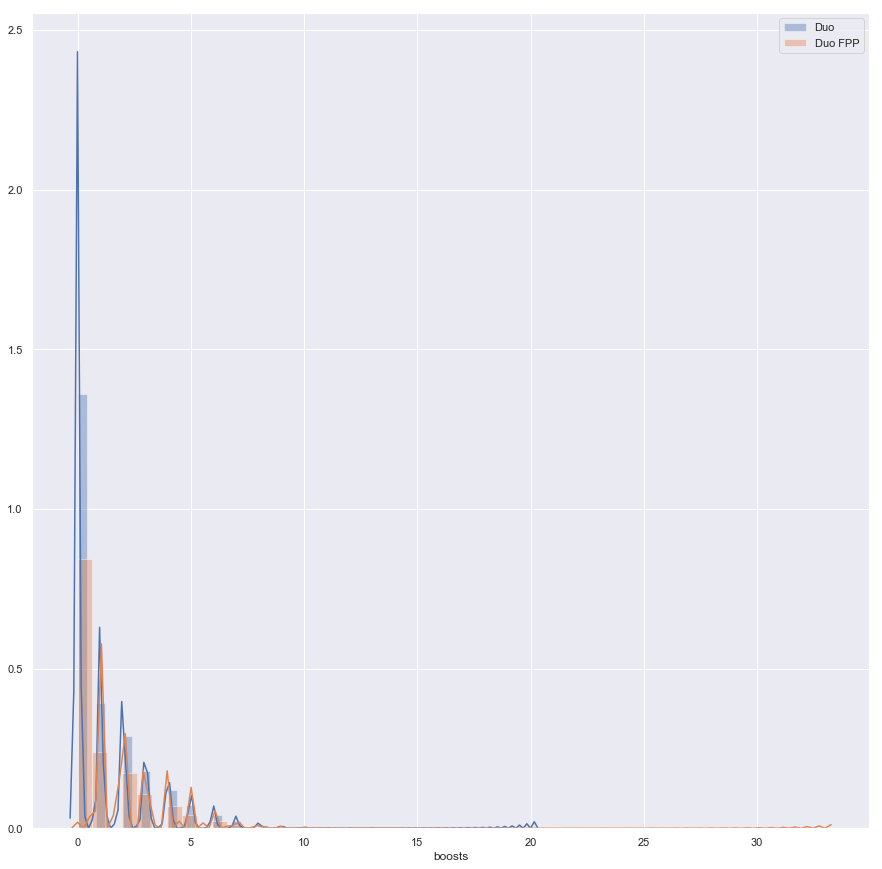

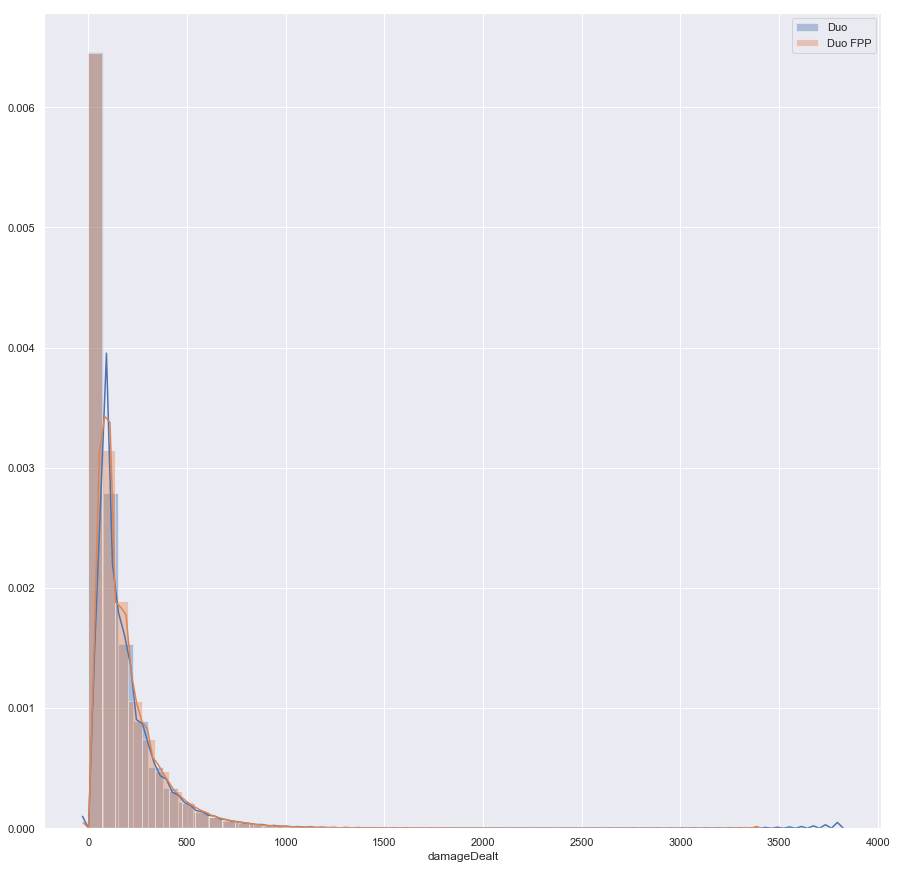

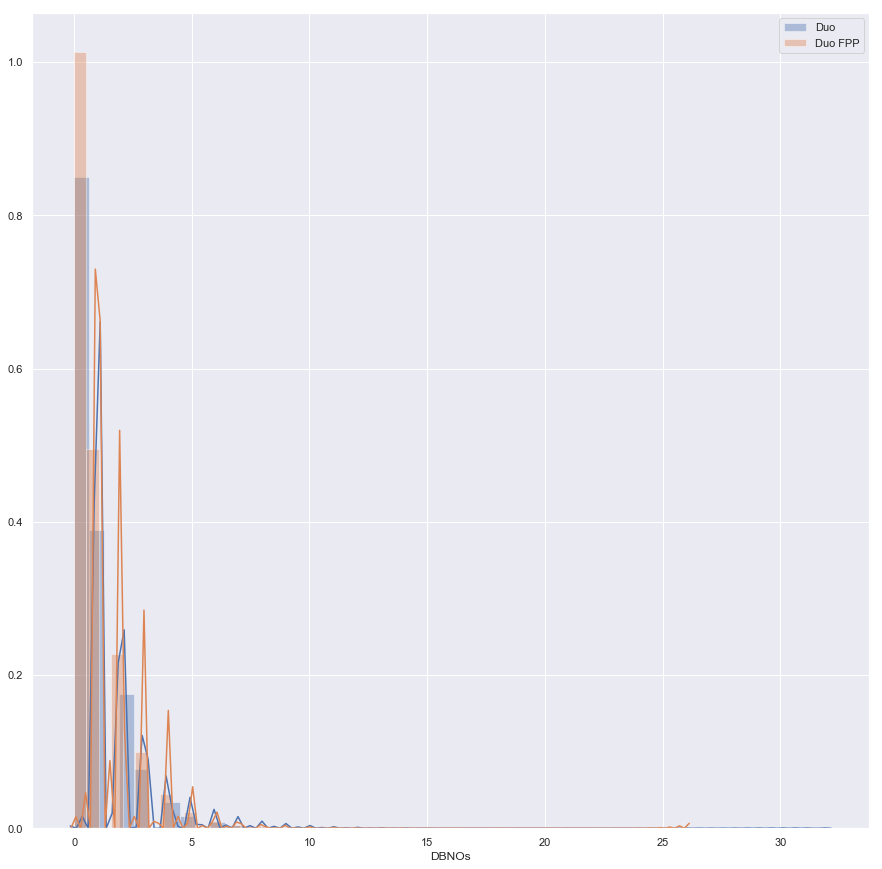

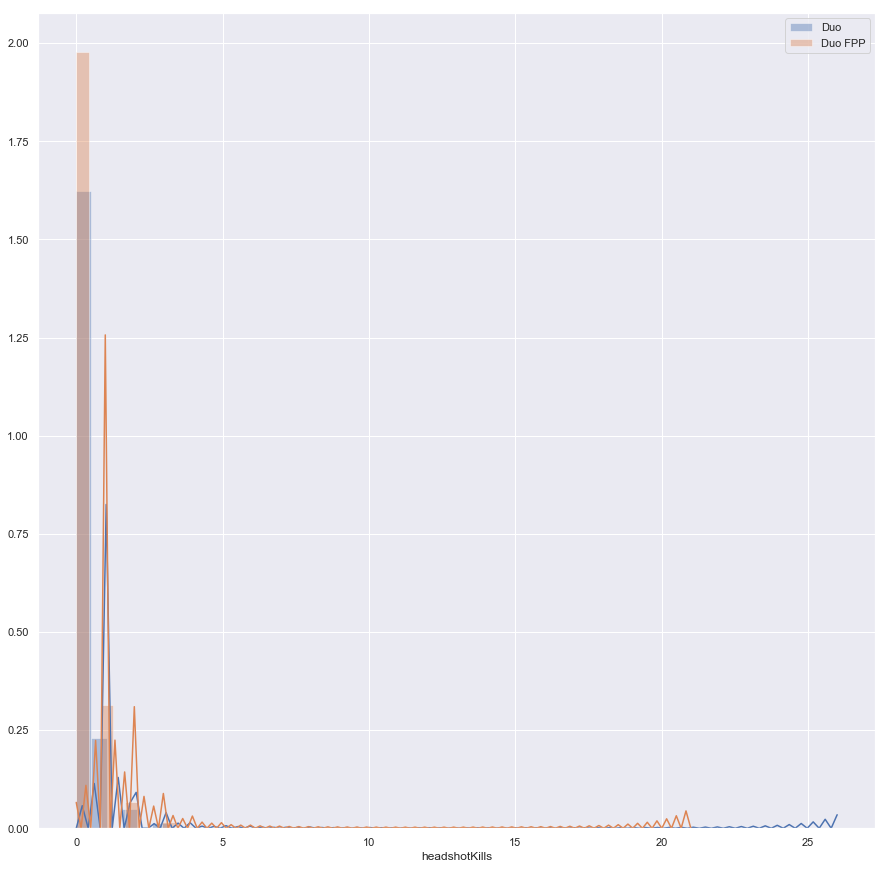

...

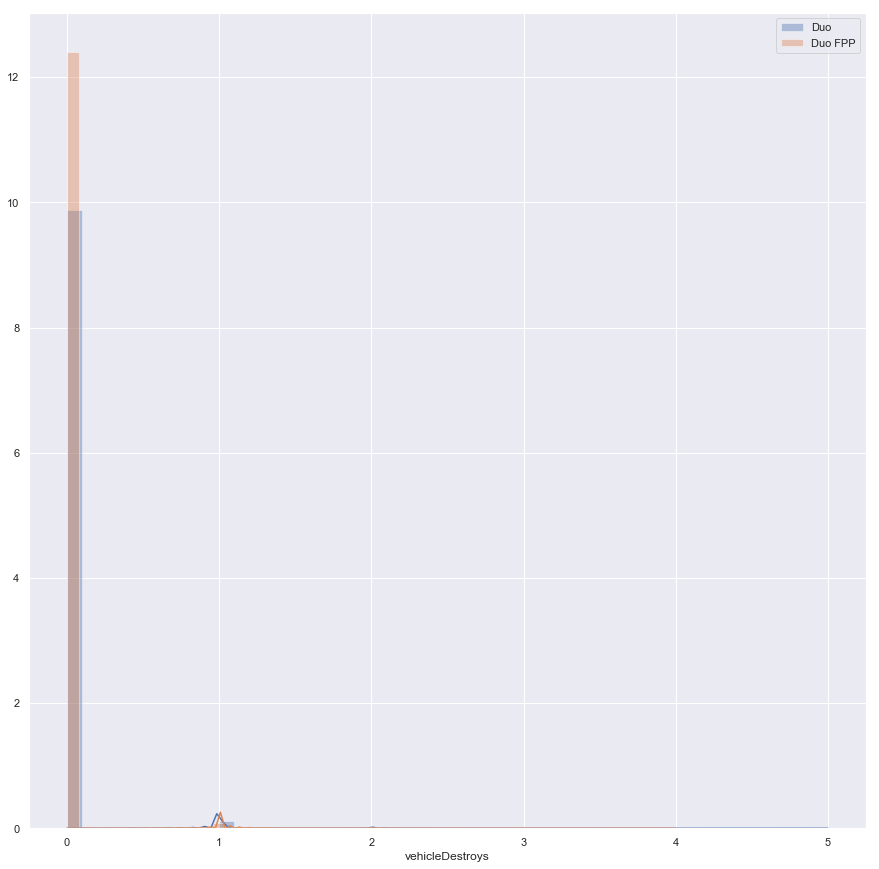

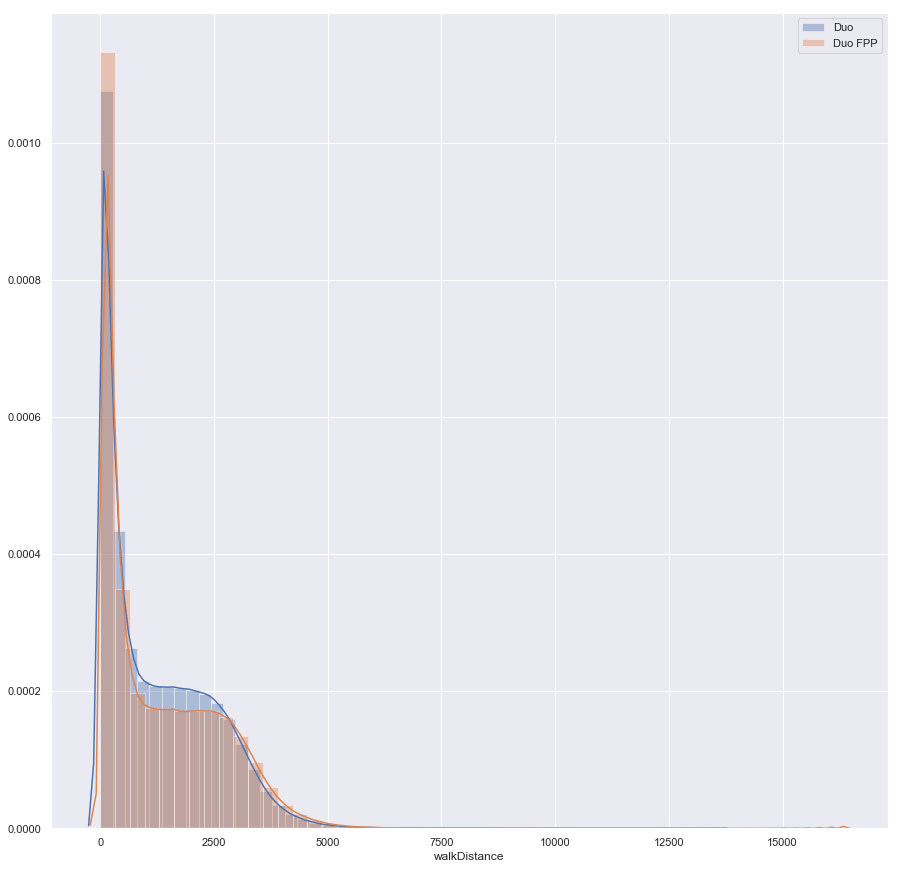

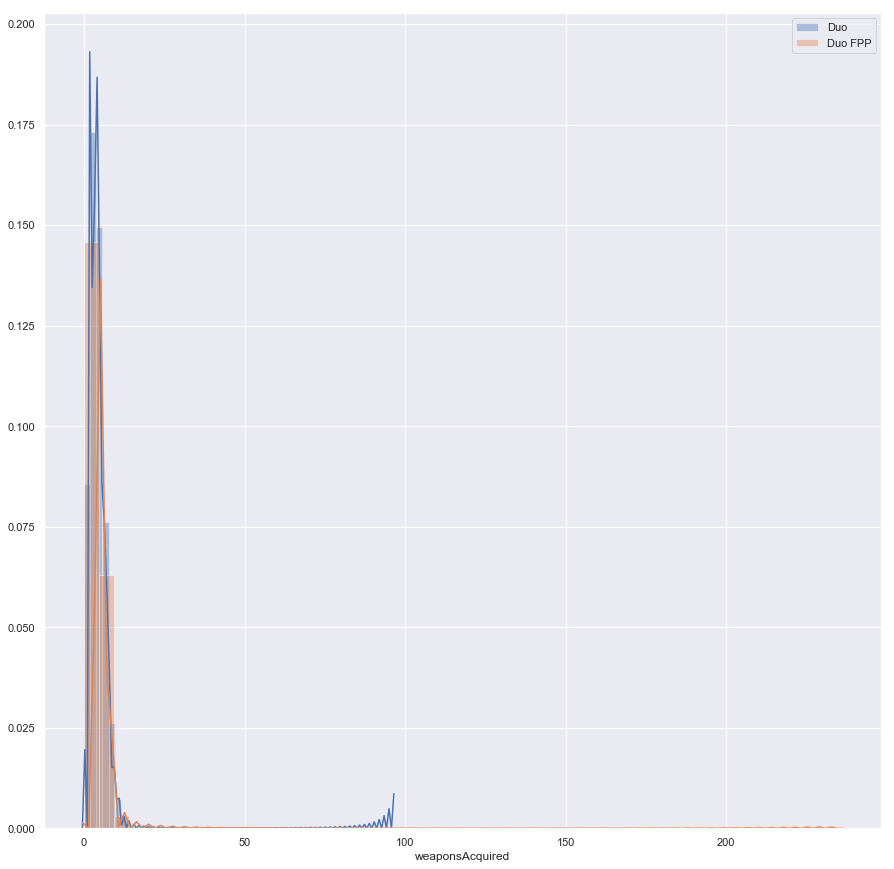

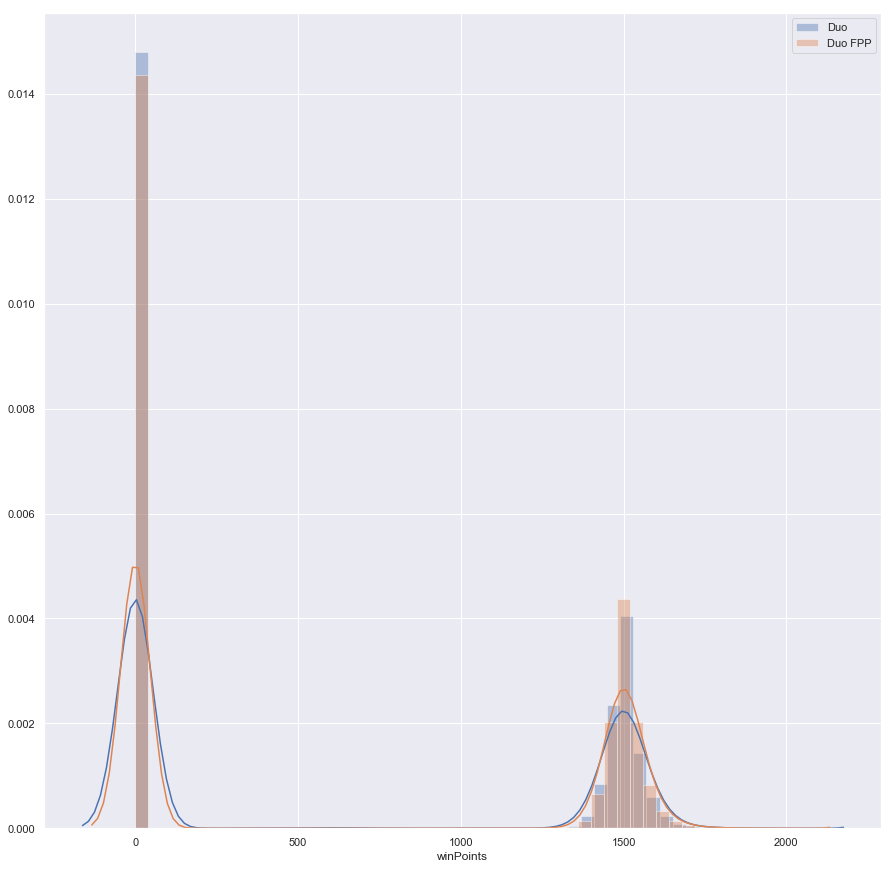

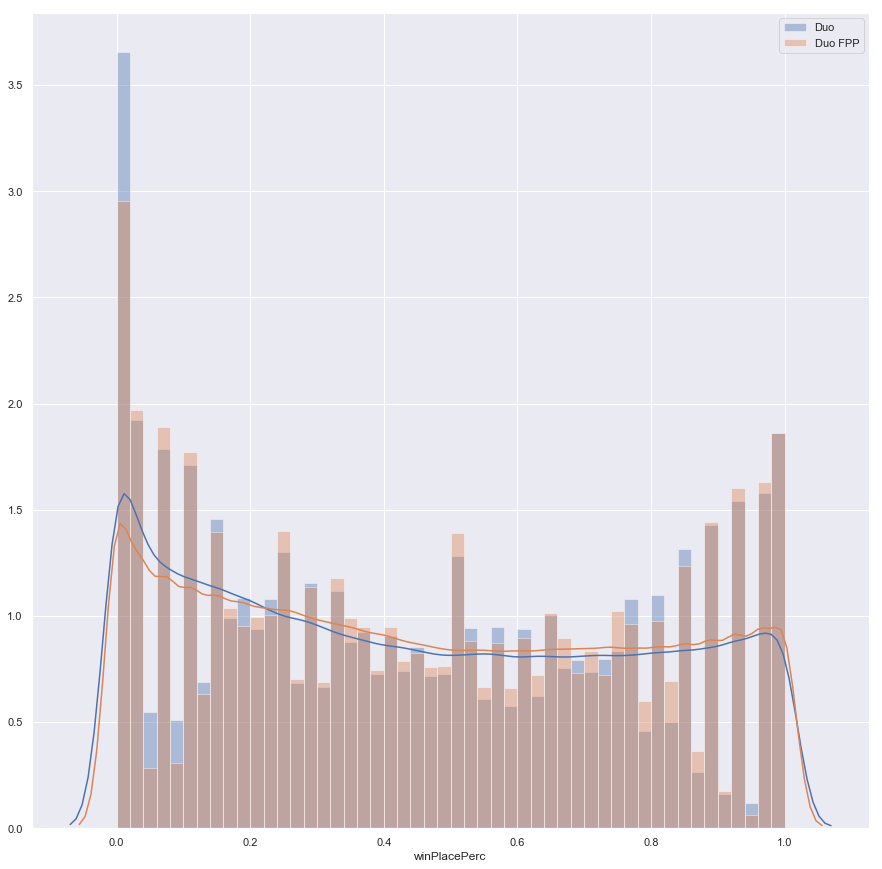

In [367]:
for feature in team_features:
    fig, ax = plt.subplots(figsize = (15, 15))
    sns.distplot(squad[feature], ax = ax, label = "Duo")
    sns.distplot(squadfpp[feature], ax = ax, label = "Duo FPP")
    ax.legend()

## Solo/Duo/Squad Comparisons

In [368]:
features_to_test = ["assists", "boosts", "damageDealt", "heals", "kills", "killStreaks", 
                    "matchDuration", "rideDistance", "walkDistance", "weaponsAcquired"]

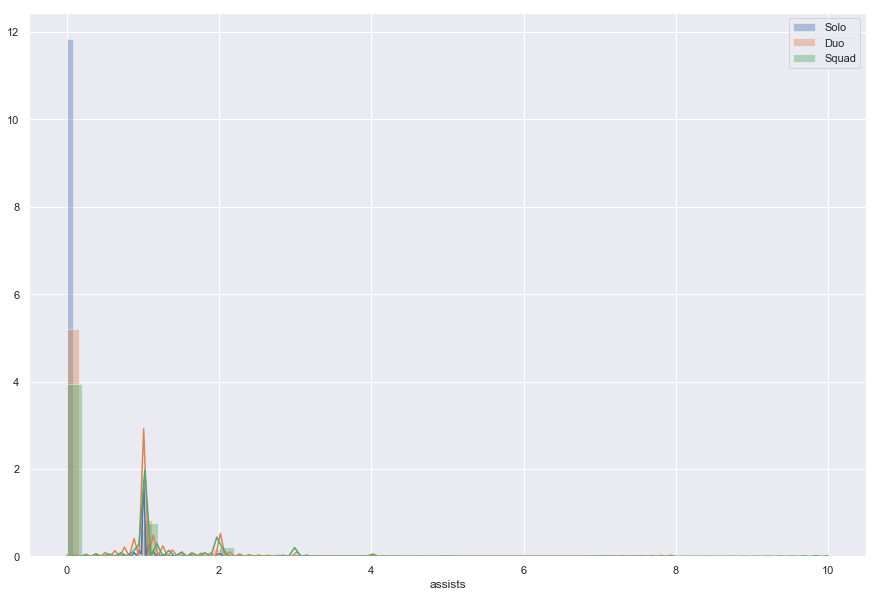

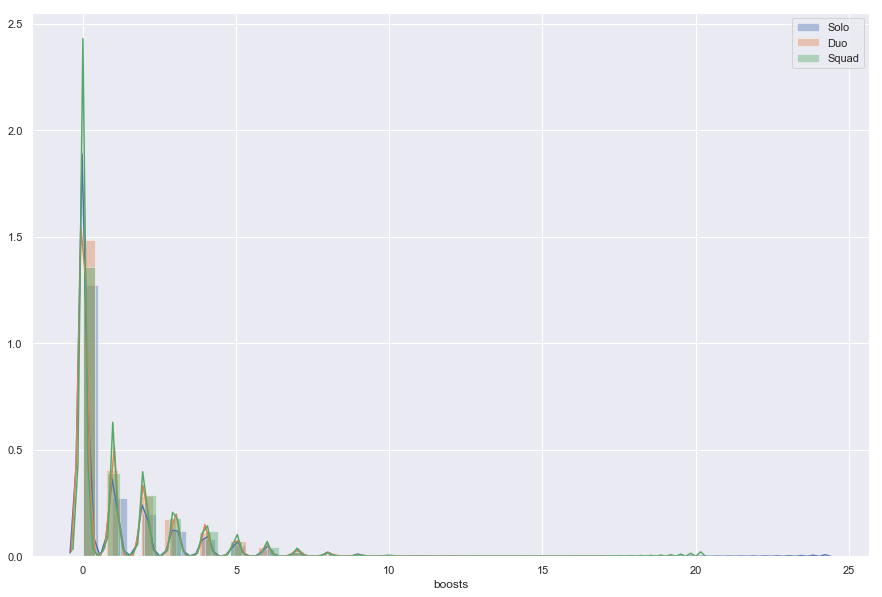

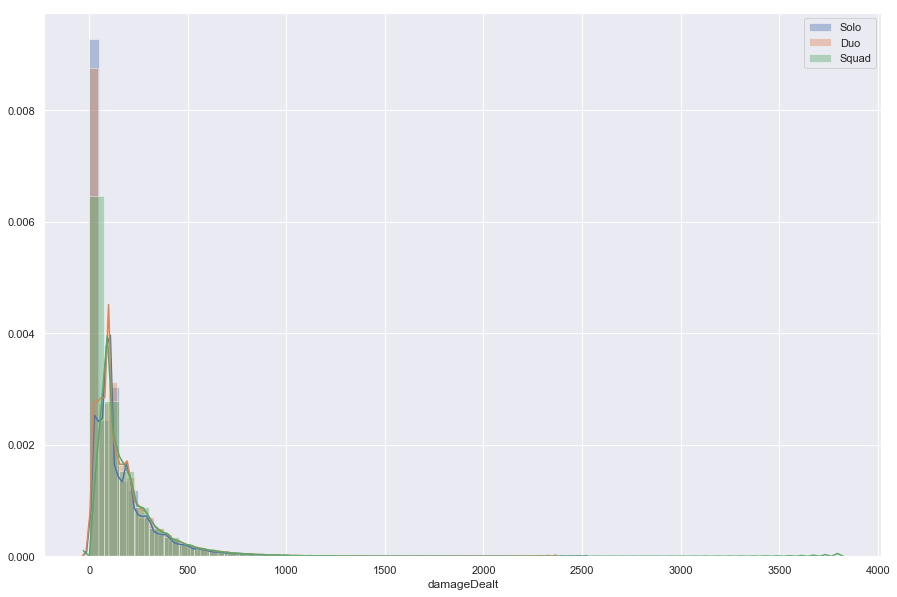

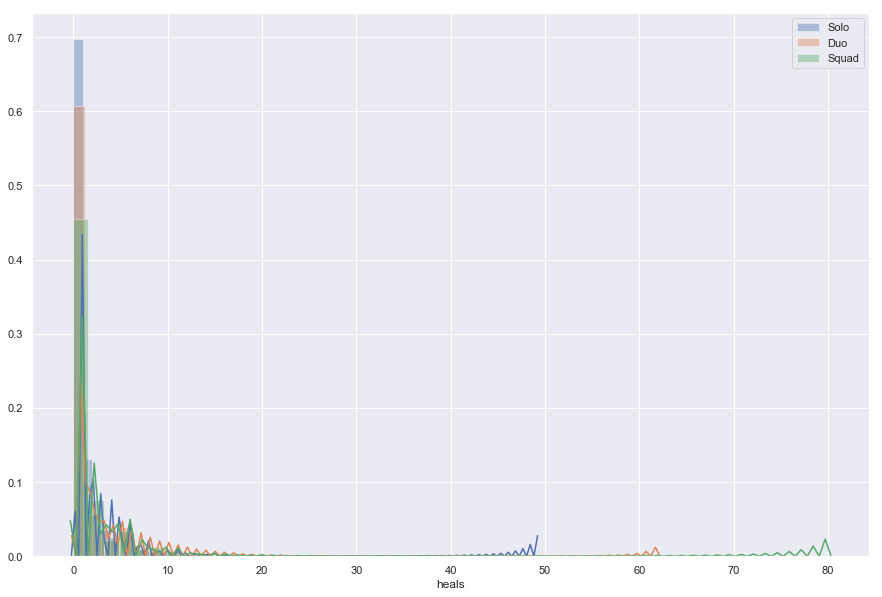

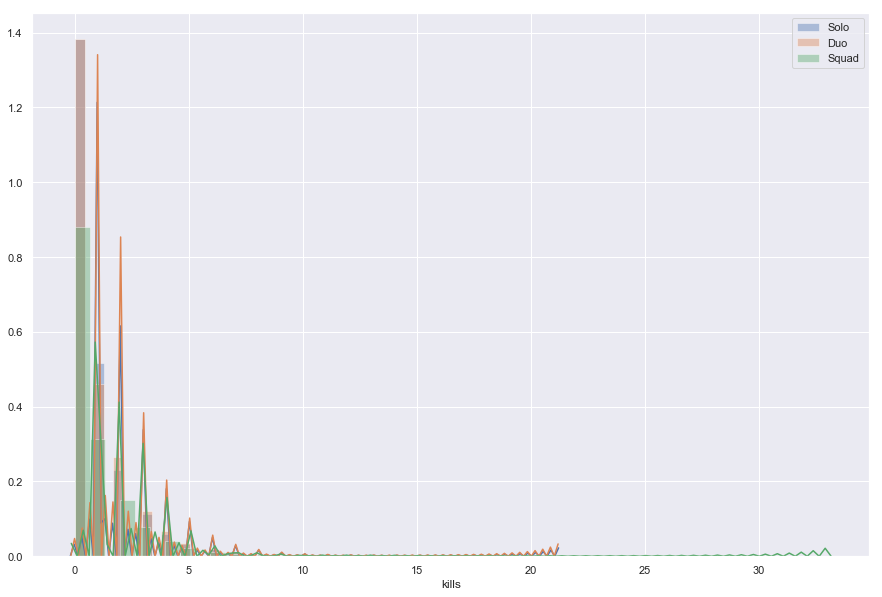

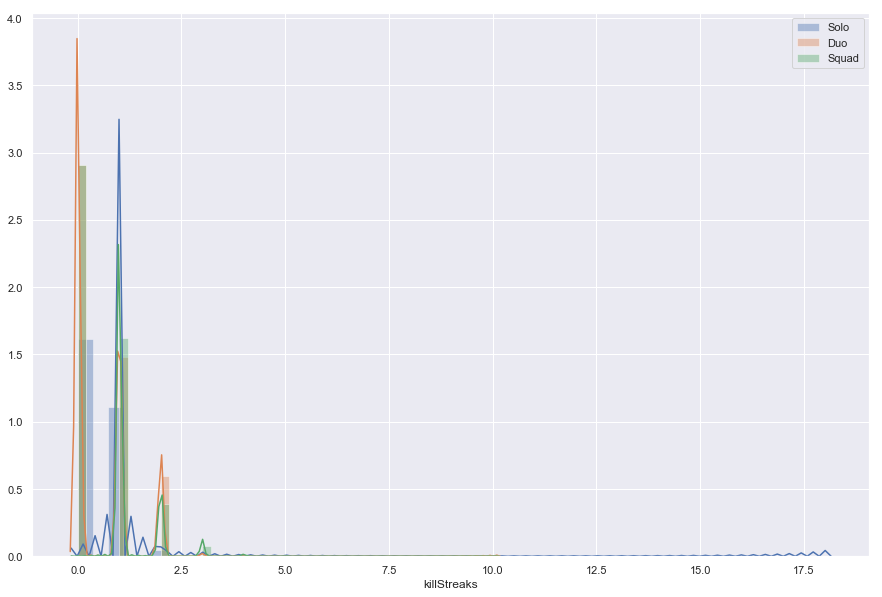

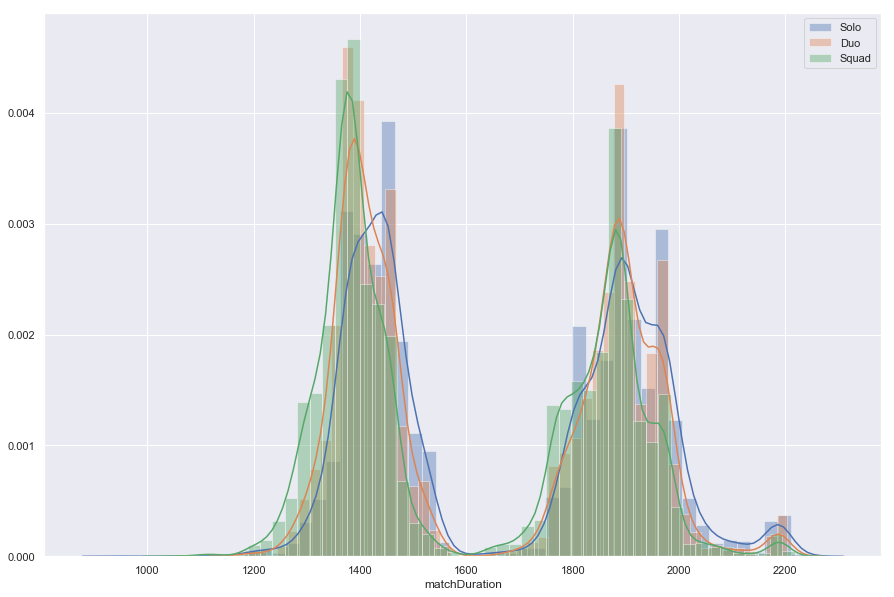

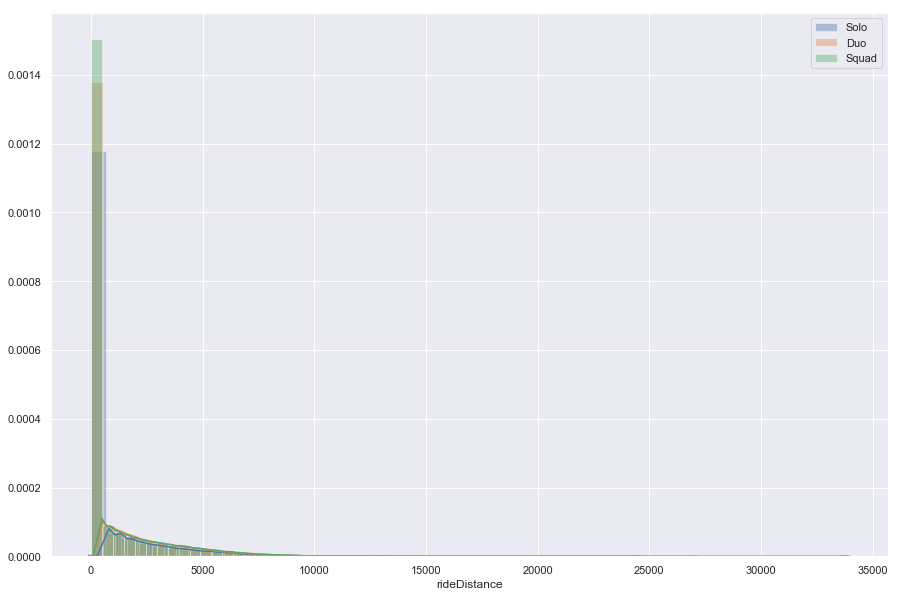

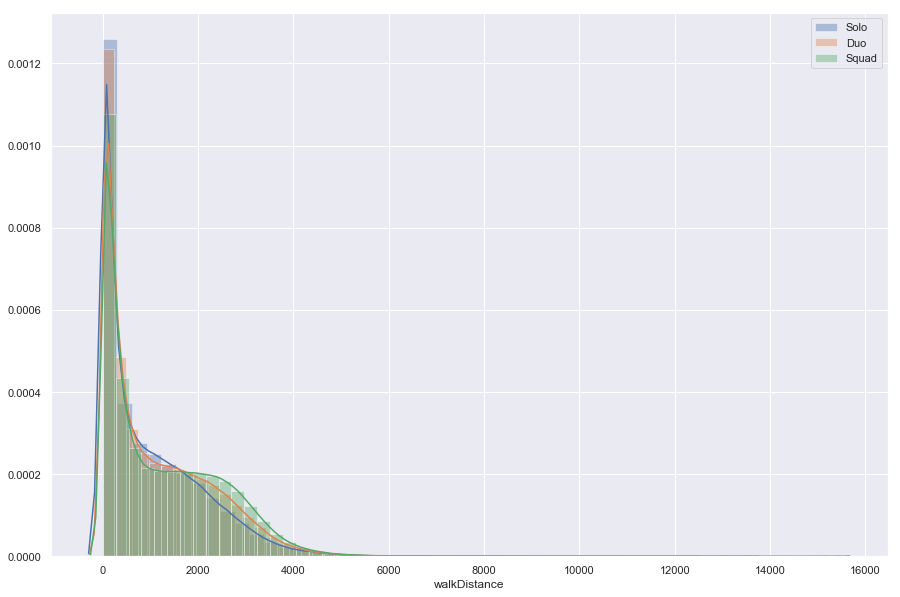

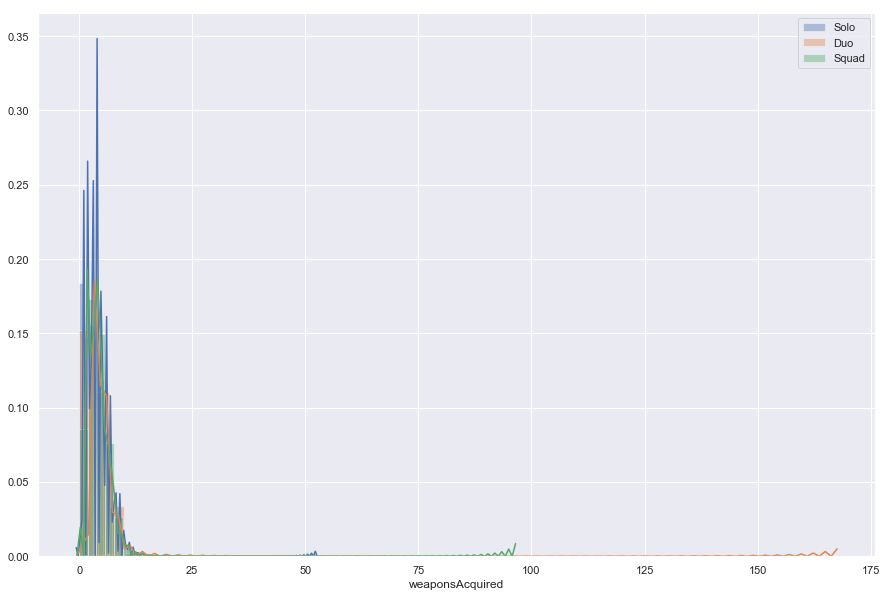

In [369]:
for feature in features_to_test:
    fig, ax = plt.subplots(figsize = (15, 10))
    sns.distplot(solo[feature], ax = ax, label = "Solo")
    sns.distplot(duo[feature], ax = ax, label = "Duo")
    sns.distplot(squad[feature], ax = ax, label = "Squad")
    ax.legend()

### Testing Statistical Significance of Differences in Distribution

In [370]:
solodmg = solo["damageDealt"]
duodmg = duo["damageDealt"]

In [371]:
stat, p = stats.mannwhitneyu(solodmg, duodmg)
print("The Mann-Whitney U Statistic is: {}".format(stat))
print("The corresponding p-value is: {}".format(p))

The Mann-Whitney U Statistic is: 26696320245.0
The corresponding p-value is: 0.0


# Machine Learning

## Hierarchical Clustering

In [372]:
from scipy.cluster.hierarchy import linkage, dendrogram

## Scikitlearn Regression

### Data Preparation

In [373]:
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
from sklearn.linear_model import ElasticNetCV
from sklearn.metrics import mean_squared_error, roc_auc_score
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import Normalizer, normalize

In [374]:
X = np.array(solo[features].drop("winPlacePerc", axis = 1))
y = np.array(solo.winPlacePerc)
feature_list = list(solo[features].columns.drop("winPlacePerc"))

In [375]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = .3, random_state = 42)
X_train, X_val, y_train, y_val = train_test_split(X_train, y_train, test_size = .2, random_state = 42)

In [376]:
print('Training Features Shape:', X_train.shape)
print('Training Labels Shape:', y_train.shape)
print('Validation Features Shape:', X_val.shape)
print('Validation Labels Shape:', y_val.shape)
print('Testing Features Shape:', X_test.shape)
print('Testing Labels Shape:', y_test.shape)

Training Features Shape: (101888, 21)
Training Labels Shape: (101888,)
Validation Features Shape: (25472, 21)
Validation Labels Shape: (25472,)
Testing Features Shape: (54583, 21)
Testing Labels Shape: (54583,)


## Hierarchical Clustering

In [377]:
from scipy.cluster.hierarchy import linkage, dendrogram

In [378]:
X_t = np.array(solo[features]).T
features = list(solo[features].columns)

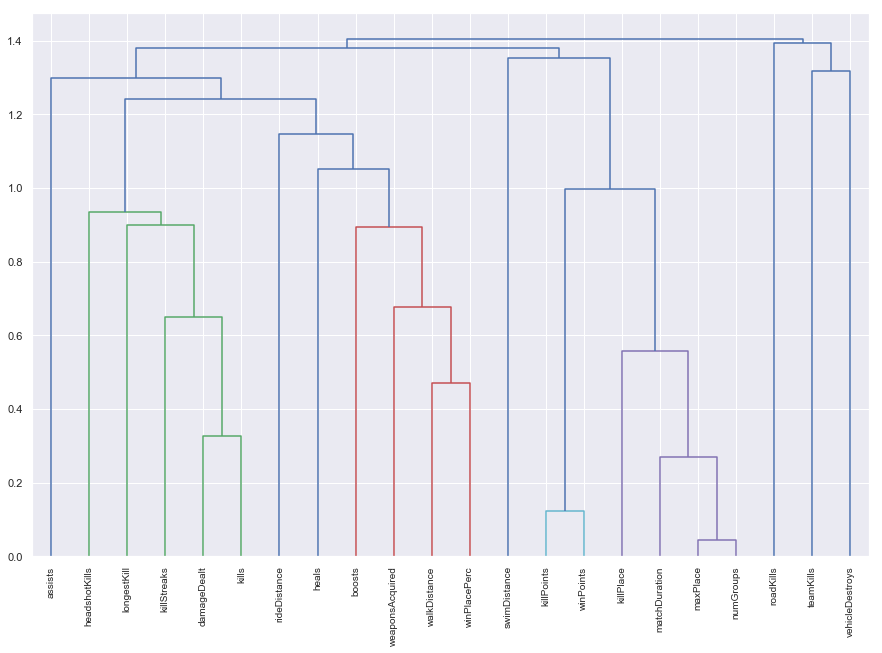

In [379]:
X_norm = normalize(X_t)
mergings = linkage(X_norm, method = "complete")
plt.figure(figsize = (15, 10))
dendrogram(mergings, labels = features, leaf_rotation = 90)
plt.show()

### ElasticNet

In [380]:
elastic = ElasticNetCV(cv = 5, random_state = 42)

In [381]:
elastic.fit(X_train, y_train)

ElasticNetCV(alphas=None, copy_X=True, cv=5, eps=0.001, fit_intercept=True,
       l1_ratio=0.5, max_iter=1000, n_alphas=100, n_jobs=1,
       normalize=False, positive=False, precompute='auto', random_state=42,
       selection='cyclic', tol=0.0001, verbose=0)

In [382]:
y_pred = elastic.predict(X_val)

print("R^2: {}".format(elastic.score(X_val, y_val)))
rmse = np.sqrt(mean_squared_error(y_val, y_pred))
print("Root Mean Squared Error: {}".format(rmse))

R^2: 0.797096113299112
Root Mean Squared Error: 0.13917604375905593


In [383]:
y_pred = elastic.predict(X_test)

print("R^2: {}".format(elastic.score(X_test, y_test)))
rmse = np.sqrt(mean_squared_error(y_test, y_pred))
print("Root Mean Squared Error: {}".format(rmse))

R^2: 0.7987155246205543
Root Mean Squared Error: 0.13813091483809153


### Random Forest

#### Parameter Tuning

In [384]:
# n_estimator tuning
estimator_options = [5, 7, 10, 15, 20]
estimator_oobs = []
estimator_scores = []
estimator_rmses = []
for estimator in estimator_options:
    model = RandomForestRegressor(n_estimators = estimator, random_state = 42, oob_score = True, n_jobs = -1)
    model.fit(X, y)
    y_pred = model.predict(X_val)
    score = model.oob_score_
    estimator_oobs.append(score)
    estimator_scores.append(model.score(X_val, y_val))
    estimator_rmses.append(mean_squared_error(y_val, y_pred))

In [385]:
for i in range(len(estimator_options)):
    print("n_estimator: {}, OOB score: {}, R^2: {}, RMSE: {}".format(estimator_options[i], 
                                                                     estimator_oobs[i], 
                                                                     estimator_scores[i], 
                                                                     estimator_rmses[i]))

n_estimator: 5, OOB score: 0.574505092864313, R^2: 0.9839644476114167, RMSE: 0.001530814378642483
n_estimator: 7, OOB score: 0.7814337367769291, R^2: 0.9858506955101778, RMSE: 0.001350746032062577
n_estimator: 10, OOB score: 0.8895947723765855, R^2: 0.9877400993051705, RMSE: 0.0011703764117122427
n_estimator: 15, OOB score: 0.9262006353089136, R^2: 0.9888128505399915, RMSE: 0.0010679675283026837
n_estimator: 20, OOB score: 0.9317309805240299, R^2: 0.9896515669031672, RMSE: 0.0009879004974178247


In [386]:
# max_depth tuning, with n_estimator = 10
depth_options = [5, 7, 10, 15, 20]
depth_oobs = []
depth_scores = []
depth_rmses = []
for depth in depth_options:
    model = RandomForestRegressor(n_estimators = 10, max_depth = depth, random_state = 42, oob_score = True, n_jobs = -1)
    model.fit(X, y)
    y_pred = model.predict(X_val)
    score = model.oob_score_
    depth_oobs.append(score)
    depth_scores.append(model.score(X_val, y_val))
    depth_rmses.append(mean_squared_error(y_val, y_pred))

In [387]:
for i in range(len(depth_options)):
    print("max_depth: {}, OOB score: {}, R^2: {}, RMSE: {}".format(depth_options[i], 
                                                                   depth_oobs[i], 
                                                                   depth_scores[i], 
                                                                   depth_rmses[i]))

max_depth: 5, OOB score: 0.845818160757415, R^2: 0.878590432711531, RMSE: 0.011590215716065468
max_depth: 7, OOB score: 0.868027015029611, R^2: 0.9026574647418969, RMSE: 0.009292685965262299
max_depth: 10, OOB score: 0.8921580761121525, R^2: 0.9342304020030563, RMSE: 0.006278614160054619
max_depth: 15, OOB score: 0.9003058198025292, R^2: 0.965993625473099, RMSE: 0.0032463769148572716
max_depth: 20, OOB score: 0.8930537938058067, R^2: 0.9830207612390865, RMSE: 0.001620902242950801


In [388]:
# max_features tuning, with n_estimator = 10 and max_depth = 15
feature_options = [5, 7, 10, 15, 20]
feature_oobs = []
feature_scores = []
feature_rmses = []
for feature in feature_options:
    model = RandomForestRegressor(n_estimators = 10, max_depth = 15, max_features= feature, 
                                  random_state = 42, oob_score = True, n_jobs = -1)
    model.fit(X, y)
    y_pred = model.predict(X_val)
    score = model.oob_score_
    feature_oobs.append(score)
    feature_scores.append(model.score(X_val, y_val))
    feature_rmses.append(mean_squared_error(y_val, y_pred))

In [389]:
for i in range(len(feature_options)):
    print("max_feature: {}, OOB score: {}, R^2: {}, RMSE: {}".format(feature_options[i], 
                                                                     feature_oobs[i], 
                                                                     feature_scores[i], 
                                                                     feature_rmses[i]))

max_feature: 5, OOB score: 0.8917169499169804, R^2: 0.956045047193393, RMSE: 0.004196105761645656
max_feature: 7, OOB score: 0.8951754965083045, R^2: 0.9582043259960074, RMSE: 0.003989972854063809
max_feature: 10, OOB score: 0.9004650240107469, R^2: 0.9634785552493579, RMSE: 0.0034864750149102243
max_feature: 15, OOB score: 0.901319614611473, R^2: 0.9653569059481183, RMSE: 0.0033071605648609206
max_feature: 20, OOB score: 0.9000241565146153, R^2: 0.965708216776705, RMSE: 0.0032736231066717017


#### Fitting Model to Test Data

In [390]:
X_test = np.concatenate((X_val, X_test))
y_test = np.concatenate((y_val, y_test))

In [391]:
print('Training Features Shape:', X_train.shape)
print('Training Labels Shape:', y_train.shape)
print('Testing Features Shape:', X_test.shape)
print('Testing Labels Shape:', y_test.shape)

Training Features Shape: (101888, 21)
Training Labels Shape: (101888,)
Testing Features Shape: (80055, 21)
Testing Labels Shape: (80055,)


In [392]:
rf = RandomForestRegressor(n_estimators = 10, max_depth = 15, max_features = 15, random_state = 42, n_jobs = -1)

In [393]:
rf.fit(X_train, y_train)

RandomForestRegressor(bootstrap=True, criterion='mse', max_depth=15,
           max_features=15, max_leaf_nodes=None, min_impurity_decrease=0.0,
           min_impurity_split=None, min_samples_leaf=1,
           min_samples_split=2, min_weight_fraction_leaf=0.0,
           n_estimators=10, n_jobs=-1, oob_score=False, random_state=42,
           verbose=0, warm_start=False)

In [394]:
y_pred = rf.predict(X_test)

In [395]:
print("R^2: {}".format(rf.score(X_test, y_test)))
rmse = np.sqrt(mean_squared_error(y_test, y_pred))
print("Root Mean Squared Error: {}".format(rmse))

R^2: 0.9368992014300754
Root Mean Squared Error: 0.07742737077961662


In [396]:
#Quantifying feature importance
importances = list(rf.feature_importances_)
feature_importances = [(feature, round(importance, 4)) for feature, importance in zip(feature_list, importances)]
feature_importances_sorted = sorted(feature_importances, key = lambda x: x[1], reverse = True)

In [397]:
for pair in feature_importances_sorted:
    print("Variable: {:25} Importance: {}".format(pair[0], pair[1]))

Variable: walkDistance              Importance: 0.5832
Variable: killPlace                 Importance: 0.306
Variable: boosts                    Importance: 0.0325
Variable: numGroups                 Importance: 0.0179
Variable: matchDuration             Importance: 0.0173
Variable: maxPlace                  Importance: 0.0096
Variable: rideDistance              Importance: 0.0073
Variable: damageDealt               Importance: 0.007
Variable: weaponsAcquired           Importance: 0.005
Variable: kills                     Importance: 0.0043
Variable: killStreaks               Importance: 0.0025
Variable: longestKill               Importance: 0.0025
Variable: heals                     Importance: 0.0014
Variable: winPoints                 Importance: 0.0013
Variable: killPoints                Importance: 0.001
Variable: swimDistance              Importance: 0.0006
Variable: headshotKills             Importance: 0.0003
Variable: assists                   Importance: 0.0002
Variable: road

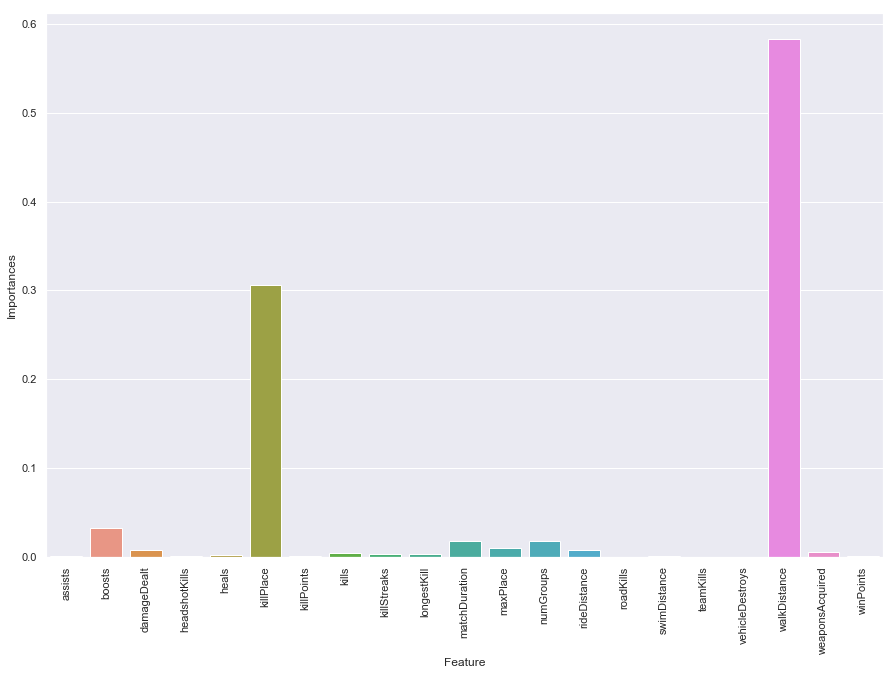

In [398]:
x_vals = list(range(len(importances)))
plt.figure(figsize = (15, 10))
sns.barplot(x_vals, importances, orientation = "vertical")
plt.xticks(x_vals, feature_list, rotation = "vertical")
plt.ylabel("Importances")
plt.xlabel("Feature")
plt.show()

In [399]:
# Construct new regressor only using most important features
rf_pared = RandomForestRegressor(n_estimators = 10, max_depth = 15, random_state = 42, n_jobs = -1)

In [400]:
feature_importances_sorted

[('walkDistance', 0.5832),
 ('killPlace', 0.306),
 ('boosts', 0.0325),
 ('numGroups', 0.0179),
 ('matchDuration', 0.0173),
 ('maxPlace', 0.0096),
 ('rideDistance', 0.0073),
 ('damageDealt', 0.007),
 ('weaponsAcquired', 0.005),
 ('kills', 0.0043),
 ('killStreaks', 0.0025),
 ('longestKill', 0.0025),
 ('heals', 0.0014),
 ('winPoints', 0.0013),
 ('killPoints', 0.001),
 ('swimDistance', 0.0006),
 ('headshotKills', 0.0003),
 ('assists', 0.0002),
 ('roadKills', 0.0001),
 ('teamKills', 0.0001),
 ('vehicleDestroys', 0.0)]

In [401]:
important_features = ["walkDistance", "killPlace", "boosts", "numGroups", "matchDuration"]
important_indices = []
for feature in important_features:
    important_indices.append(feature_list.index(feature))

In [402]:
train_important = X_train[:, important_indices]
test_important = X_test[:, important_indices]
rf_pared.fit(train_important, y_train)

RandomForestRegressor(bootstrap=True, criterion='mse', max_depth=15,
           max_features='auto', max_leaf_nodes=None,
           min_impurity_decrease=0.0, min_impurity_split=None,
           min_samples_leaf=1, min_samples_split=2,
           min_weight_fraction_leaf=0.0, n_estimators=10, n_jobs=-1,
           oob_score=False, random_state=42, verbose=0, warm_start=False)

In [403]:
predict_important = rf_pared.predict(test_important)

In [404]:
print("R^2: {}".format(rf_pared.score(test_important, y_test)))
rmse = np.sqrt(mean_squared_error(y_test, predict_important))
print("Root Mean Squared Error: {}".format(rmse))

R^2: 0.9218450763293721
Root Mean Squared Error: 0.08616983393188712


## Deep Learning Model Using Keras

In [405]:
from keras.models import Sequential
from keras.layers import Dense
from keras.callbacks import EarlyStopping
from keras import optimizers

In [406]:
n_cols = X_train.shape[1]
early_stopping_monitor = EarlyStopping(patience = 5)

### Testing Basic Model

In [311]:
model_1 = Sequential()
model_1.add(Dense(10, activation = 'relu', input_shape = (n_cols, )))
model_1.add(Dense(10, activation = 'relu'))
model_1.add(Dense(1))

model_1.compile(optimizer = "adam", loss = "mean_squared_error")

model_1.fit(X_train, y_train, validation_split = 0.2, epochs = 30, callbacks = [early_stopping_monitor])

Train on 55 samples, validate on 14 samples
Epoch 1/30
55/55 [==============================] - 1s 21ms/step - loss: 795858.4432 - val_loss: 603926.0000
Epoch 2/30
55/55 [==============================] - 0s 91us/step - loss: 726830.5580 - val_loss: 546153.0000
Epoch 3/30
55/55 [==============================] - 0s 91us/step - loss: 659738.3500 - val_loss: 493371.7500
Epoch 4/30
55/55 [==============================] - 0s 109us/step - loss: 594109.5023 - val_loss: 445539.0312
Epoch 5/30
55/55 [==============================] - 0s 91us/step - loss: 541281.7375 - val_loss: 401747.0938
Epoch 6/30
55/55 [==============================] - 0s 73us/step - loss: 488559.2602 - val_loss: 362232.5625
Epoch 7/30
55/55 [==============================] - 0s 73us/step - loss: 442369.9307 - val_loss: 326780.5625
Epoch 8/30
55/55 [==============================] - 0s 109us/step - loss: 401833.6790 - val_loss: 295229.5625
Epoch 9/30
55/55 [==============================] - 0s 91us/step - loss: 364236.86

In [307]:
y_pred = model_1.predict(X_test)
print("Keras Model's Root Mean Squared Error: {}".format(np.sqrt(model_1.evaluate(X_test, y_test))))

30/30 [==============================] - 0s 33us/step
Keras Model's Root Mean Squared Error: 147.52387253848104


### Testing Higher Node Count

In [278]:
model = Sequential()
model.add(Dense(200, activation = 'relu', input_shape = (n_cols, )))
model.add(Dense(200, activation = 'relu'))
model.add(Dense(1))

model.compile(optimizer = "adam", loss = "mean_squared_error")

model.fit(X_train, y_train, validation_split = 0.2, epochs = 30, callbacks = [early_stopping_monitor])

Train on 81510 samples, validate on 20378 samples
Epoch 1/30
81510/81510 [==============================] - 4s 50us/step - loss: 193.6478 - val_loss: 3.8504
Epoch 2/30
81510/81510 [==============================] - 3s 42us/step - loss: 21.0834 - val_loss: 2.5893
Epoch 3/30
81510/81510 [==============================] - 3s 41us/step - loss: 7.8131 - val_loss: 21.4672
Epoch 4/30
81510/81510 [==============================] - 3s 42us/step - loss: 0.2910 - val_loss: 0.0710
Epoch 5/30
81510/81510 [==============================] - 3s 43us/step - loss: 0.2911 - val_loss: 0.0558
Epoch 6/30
81510/81510 [==============================] - 3s 41us/step - loss: 0.0622 - val_loss: 0.0346
Epoch 7/30
81510/81510 [==============================] - 3s 41us/step - loss: 0.0608 - val_loss: 0.0263
Epoch 8/30
81510/81510 [==============================] - 3s 41us/step - loss: 0.0424 - val_loss: 0.0136
Epoch 9/30
81510/81510 [==============================] - 3s 42us/step - loss: 0.0172 - val_loss: 0.0135
E

In [279]:
y_pred = model.predict(X_test)
print("Keras Model's Root Mean Squared Error: {}".format(np.sqrt(model.evaluate(X_test, y_test))))

80055/80055 [==============================] - 1s 17us/step
Keras Model's Root Mean Squared Error: 0.09609785790108229


### Testing Increased Layers

In [280]:
model = Sequential()
model.add(Dense(10, activation = 'relu', input_shape = (n_cols, )))
model.add(Dense(10, activation = 'relu'))
model.add(Dense(10, activation = 'relu'))
model.add(Dense(10, activation = 'relu'))
model.add(Dense(1))

model.compile(optimizer = "adam", loss = "mean_squared_error")

model.fit(X_train, y_train, validation_split = 0.2, epochs = 30, callbacks = [early_stopping_monitor])

Train on 81510 samples, validate on 20378 samples
Epoch 1/30
81510/81510 [==============================] - 3s 39us/step - loss: 196.9719 - val_loss: 1.9219
Epoch 2/30
81510/81510 [==============================] - 2s 29us/step - loss: 0.9187 - val_loss: 0.3078
Epoch 3/30
81510/81510 [==============================] - 2s 29us/step - loss: 0.2626 - val_loss: 1.2767
Epoch 4/30
81510/81510 [==============================] - 2s 29us/step - loss: 0.2165 - val_loss: 0.0427
Epoch 5/30
81510/81510 [==============================] - 2s 28us/step - loss: 0.1636 - val_loss: 0.0392
Epoch 6/30
81510/81510 [==============================] - 2s 29us/step - loss: 0.0866 - val_loss: 0.0246
Epoch 7/30
81510/81510 [==============================] - 2s 28us/step - loss: 0.0240 - val_loss: 0.0200
Epoch 8/30
81510/81510 [==============================] - 2s 28us/step - loss: 0.0237 - val_loss: 0.0240
Epoch 9/30
81510/81510 [==============================] - 2s 28us/step - loss: 0.0269 - val_loss: 0.0202
Epo

In [281]:
y_pred = model.predict(X_test)
print("Keras Model's Root Mean Squared Error: {}".format(np.sqrt(model.evaluate(X_test, y_test))))

80055/80055 [==============================] - 1s 16us/step
Keras Model's Root Mean Squared Error: 0.09901520698812481


### Testing Increased Layers and Higher Node Count

In [282]:
model = Sequential()
model.add(Dense(200, activation = 'relu', input_shape = (n_cols, )))
model.add(Dense(200, activation = 'relu'))
model.add(Dense(200, activation = 'relu'))
model.add(Dense(200, activation = 'relu'))
model.add(Dense(1))

model.compile(optimizer = "adam", loss = "mean_squared_error")

model.fit(X_train, y_train, validation_split = 0.2, epochs = 30, callbacks = [early_stopping_monitor])

Train on 81510 samples, validate on 20378 samples
Epoch 1/30
81510/81510 [==============================] - 7s 84us/step - loss: 26.1369 - val_loss: 0.1633
Epoch 2/30
81510/81510 [==============================] - 6s 74us/step - loss: 0.2306 - val_loss: 0.0617
Epoch 3/30
81510/81510 [==============================] - 6s 73us/step - loss: 0.2094 - val_loss: 0.0248
Epoch 4/30
81510/81510 [==============================] - 6s 71us/step - loss: 0.0233 - val_loss: 0.0210
Epoch 5/30
81510/81510 [==============================] - 6s 74us/step - loss: 0.0194 - val_loss: 0.0171
Epoch 6/30
81510/81510 [==============================] - 6s 72us/step - loss: 0.0205 - val_loss: 0.1026
Epoch 7/30
81510/81510 [==============================] - 6s 72us/step - loss: 0.0949 - val_loss: 0.0948
Epoch 8/30
81510/81510 [==============================] - 6s 74us/step - loss: 0.0948 - val_loss: 0.0942
Epoch 9/30
81510/81510 [==============================] - 6s 74us/step - loss: 0.0948 - val_loss: 0.0942
Epoc

In [283]:
y_pred = model.predict(X_test)
print("Keras Model's Root Mean Squared Error: {}".format(np.sqrt(model.evaluate(X_test, y_test))))

80055/80055 [==============================] - 2s 23us/step
Keras Model's Root Mean Squared Error: 0.3082528171198691


### Testing No Early Stopping Monitor

In [284]:
model = Sequential()
model.add(Dense(200, activation = 'relu', input_shape = (n_cols, )))
model.add(Dense(200, activation = 'relu'))
model.add(Dense(200, activation = 'relu'))
model.add(Dense(200, activation = 'relu'))
model.add(Dense(1))
model.compile(optimizer = "adam", loss = "mean_squared_error")

model.fit(X_train, y_train, validation_split = 0.2, epochs = 100)

Train on 81510 samples, validate on 20378 samples
Epoch 1/100
81510/81510 [==============================] - 7s 83us/step - loss: 59.2369 - val_loss: 3.5603
Epoch 2/100
81510/81510 [==============================] - 6s 74us/step - loss: 1.0579 - val_loss: 0.2220
Epoch 3/100
81510/81510 [==============================] - 6s 72us/step - loss: 0.1744 - val_loss: 0.0638
Epoch 4/100
81510/81510 [==============================] - 6s 72us/step - loss: 0.0649 - val_loss: 0.0349
Epoch 5/100
81510/81510 [==============================] - 6s 75us/step - loss: 0.0285 - val_loss: 0.0233
Epoch 6/100
81510/81510 [==============================] - 6s 72us/step - loss: 0.9499 - val_loss: 0.0168
Epoch 7/100
81510/81510 [==============================] - 6s 72us/step - loss: 0.0185 - val_loss: 0.0142
Epoch 8/100
81510/81510 [==============================] - 6s 75us/step - loss: 0.0176 - val_loss: 0.0178
Epoch 9/100
81510/81510 [==============================] - 6s 72us/step - loss: 0.0168 - val_loss: 0.

81510/81510 [==============================] - 6s 76us/step - loss: 0.0065 - val_loss: 0.0061
Epoch 78/100
81510/81510 [==============================] - 6s 72us/step - loss: 0.0064 - val_loss: 0.0068
Epoch 79/100
81510/81510 [==============================] - 6s 74us/step - loss: 0.0066 - val_loss: 0.0059
Epoch 80/100
81510/81510 [==============================] - 6s 72us/step - loss: 0.0064 - val_loss: 0.0062
Epoch 81/100
81510/81510 [==============================] - 6s 72us/step - loss: 0.0064 - val_loss: 0.0064
Epoch 82/100
81510/81510 [==============================] - 6s 77us/step - loss: 0.0064 - val_loss: 0.0058
Epoch 83/100
81510/81510 [==============================] - 6s 73us/step - loss: 0.0065 - val_loss: 0.0059
Epoch 84/100
81510/81510 [==============================] - 6s 72us/step - loss: 0.0065 - val_loss: 0.0059
Epoch 85/100
81510/81510 [==============================] - 6s 74us/step - loss: 0.0065 - val_loss: 0.0059
Epoch 86/100
81510/81510 [========================

In [285]:
y_pred = model.predict(X_test)
print("Keras Model's Root Mean Squared Error: {}".format(np.sqrt(model.evaluate(X_test, y_test))))

80055/80055 [==============================] - 2s 22us/step
Keras Model's Root Mean Squared Error: 0.07830802767353066


### Testing Different Optimizers

In [304]:
# testing adadelta
model = Sequential()
model.add(Dense(150, activation = 'relu', input_shape = (n_cols, )))
model.add(Dense(150, activation = 'relu'))
model.add(Dense(150, activation = 'relu'))
model.add(Dense(150, activation = 'relu'))
model.add(Dense(1))

model.compile(optimizer = "adadelta", loss = "mean_squared_error")

model.fit(X_train, y_train, validation_split = 0.2, epochs = 100)

Train on 55 samples, validate on 14 samples
Epoch 1/100
55/55 [==============================] - 1s 21ms/step - loss: 43946.3290 - val_loss: 29526.4473
Epoch 2/100
55/55 [==============================] - 0s 109us/step - loss: 23636.5556 - val_loss: 5994.5352
Epoch 3/100
55/55 [==============================] - 0s 109us/step - loss: 5033.8037 - val_loss: 511.2477
Epoch 4/100
55/55 [==============================] - 0s 145us/step - loss: 357.3421 - val_loss: 35.2858
Epoch 5/100
55/55 [==============================] - 0s 145us/step - loss: 145.8989 - val_loss: 43.8358
Epoch 6/100
55/55 [==============================] - 0s 127us/step - loss: 86.2230 - val_loss: 25.9599
Epoch 7/100
55/55 [==============================] - 0s 109us/step - loss: 85.0970 - val_loss: 82.1130
Epoch 8/100
55/55 [==============================] - 0s 127us/step - loss: 101.7774 - val_loss: 23.1627
Epoch 9/100
55/55 [==============================] - 0s 127us/step - loss: 38.6959 - val_loss: 18.7118
Epoch 10/100


55/55 [==============================] - 0s 109us/step - loss: 961.9529 - val_loss: 227.6562
Epoch 80/100
55/55 [==============================] - 0s 109us/step - loss: 204.6066 - val_loss: 65.7728
Epoch 81/100
55/55 [==============================] - 0s 109us/step - loss: 86.0511 - val_loss: 122.3902
Epoch 82/100
55/55 [==============================] - 0s 109us/step - loss: 71.2447 - val_loss: 20.3325
Epoch 83/100
55/55 [==============================] - 0s 109us/step - loss: 17.4103 - val_loss: 18.6011
Epoch 84/100
55/55 [==============================] - 0s 145us/step - loss: 12.8895 - val_loss: 10.9219
Epoch 85/100
55/55 [==============================] - 0s 91us/step - loss: 12.0110 - val_loss: 6.9541
Epoch 86/100
55/55 [==============================] - 0s 109us/step - loss: 4.1417 - val_loss: 11.1911
Epoch 87/100
55/55 [==============================] - 0s 145us/step - loss: 4.2837 - val_loss: 10.6723
Epoch 88/100
55/55 [==============================] - 0s 109us/step - loss: 5

In [302]:
y_pred = model.predict(X_test)
print("Keras Model's Root Mean Squared Error: {}".format(np.sqrt(model.evaluate(X_test, y_test))))

30/30 [==============================] - 0s 67us/step
Keras Model's Root Mean Squared Error: 3.3018506727273773


### Testing LSTM Model

In [288]:
solo.head()

,Id,groupId,matchId,assists,boosts,damageDealt,headshotKills,heals,killPlace,killPoints,...,numGroups,rideDistance,roadKills,swimDistance,teamKills,vehicleDestroys,walkDistance,weaponsAcquired,winPoints,winPlacePerc
0,269c3fc4a26935,3c07be51998e6f,ce9bc89b3ca08c,0,1,100.00,0,0,24,0,...,89,0.0,0,61.0,0,0,1528.0,3,0,0.8462
1,73348483a5974b,1c8e486a643207,85601fe44d519b,0,0,17.81,0,0,79,1274,...,95,129.3,0,0.0,0,0,471.9,3,1536,0.2245
2,caa1a36afeb7b2,c653cfca3b8b06,e5e181d2da0334,0,1,100.00,0,0,38,1000,...,86,0.0,0,0.0,0,0,231.7,4,1500,0.1573
3,5fd62798396ca8,bb19a05801d30d,9e3c46f8acde82,0,0,36.00,0,0,84,0,...,92,0.0,0,0.0,0,0,292.6,1,0,0.1075
4,18d002b46b1abc,00a3f236559532,eccc44618c0442,0,1,236.00,0,7,7,1142,...,88,0.0,0,0.0,0,0,1913.0,8,1557,0.9355


In [289]:
solo[solo.matchId == solo.matchId.unique()[0]].head()

,Id,groupId,matchId,assists,boosts,damageDealt,headshotKills,heals,killPlace,killPoints,...,numGroups,rideDistance,roadKills,swimDistance,teamKills,vehicleDestroys,walkDistance,weaponsAcquired,winPoints,winPlacePerc
0,269c3fc4a26935,3c07be51998e6f,ce9bc89b3ca08c,0,1,100.0,0,0,24,0,...,89,0.0,0,61.0,0,0,1528.0,3,0,0.8462
1375,c6112d0e4e6b38,ec98324e1b5a45,ce9bc89b3ca08c,0,2,132.6,1,1,23,0,...,89,0.0,0,0.0,0,0,2218.0,4,0,0.8901
2829,786ff6642479f2,2cdc72d12d1a7c,ce9bc89b3ca08c,0,1,226.1,0,4,14,0,...,89,0.0,0,0.0,0,0,2145.0,6,0,0.7692
7625,1d328edf5fce9a,31133f8b396c3c,ce9bc89b3ca08c,0,0,0.0,0,0,67,0,...,89,0.0,0,0.0,0,0,455.5,3,0,0.3187
11101,d9ac9fdb6453bc,ef92d98d37ac37,ce9bc89b3ca08c,0,0,0.0,0,0,69,0,...,89,0.0,0,0.0,0,0,154.4,3,0,0.2967


In [290]:
solo_matches = []
for matchId in solo.matchId.unique():
    solo_matches.append(solo[solo.matchId == matchId])

In [291]:
import random
random.seed(42)

In [292]:
def train_split_matches(matches, train_perc):
    random.shuffle(matches)
    match_length = len(matches)
    train_len = math.floor(match_length * train_perc)
    train_matches = matches[:train_len]
    test_matches = matches[train_len:]
    return train_matches, test_matches

In [293]:
solo_test, solo_train = train_split_matches(solo_matches, .2)

In [294]:
print(len(solo_train), len(solo_test))

1838 459


In [295]:
solo_train[1].head()

,Id,groupId,matchId,assists,boosts,damageDealt,headshotKills,heals,killPlace,killPoints,...,numGroups,rideDistance,roadKills,swimDistance,teamKills,vehicleDestroys,walkDistance,weaponsAcquired,winPoints,winPlacePerc
1844,a8c956e95382ef,ca8e97872fe4b4,e9541009ccd9db,0,0,0.0,0,0,60,0,...,94,374.6,0,0.0,0,0,849.80,10,0,0.5714
6966,21c4e42ea61097,49df15bc21e60a,e9541009ccd9db,0,0,0.0,0,0,51,0,...,94,0.0,0,0.0,0,0,2067.00,2,0,0.8163
10262,ac7371ecbd81ce,c4051ddc49fcc5,e9541009ccd9db,0,0,100.0,0,0,37,0,...,94,0.0,0,0.0,0,0,520.60,2,0,0.5000
12339,9b0e3e1034a7d8,b23944f0f6febe,e9541009ccd9db,0,0,0.0,0,0,82,0,...,94,0.0,0,0.0,0,0,39.08,2,0,0.1429
17157,7d3bdedec77012,8469d9b0fc962f,e9541009ccd9db,0,0,166.9,0,0,40,0,...,94,0.0,0,0.0,0,0,467.00,2,0,0.4184


In [296]:
def match_list_to_array(matches, feature_list):
    match_list_array=[]
    for match in matches:
        X = np.array(match[feature_list].drop("winPlacePerc", axis = 1))
        y = np.array(match.winPlacePerc)
        match_list_array.append((X,y))
    return match_list_array

In [297]:
train_list_array = match_list_to_array(solo_train, features)

In [298]:
solo_matches_array = []
for match in solo_matches:
    X = np.array(match[features].drop("winPlacePerc", axis = 1))
    y = np.array(match.winPlacePerc)
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = .3, random_state = 42)
    